In [25]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    for kkk in range(1,time_steps_full-1): 

        # Start timing
        start_time = time.time()

        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        #particles['weight'][:,0] = particles['weight'][:,1]
        particles['bw'][:,0] = particles['bw'][:,1]
        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:,1] = ODdata.variables['lon'][:, kkk].copy()
        particles['lat'][:,1] = ODdata.variables['lat'][:, kkk].copy()
        particles['z'][:,1] = ODdata.variables['z'][:, kkk].copy()
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging

        # End timing
        end_time = time.time()

        # Calculate elapsed time
        elapsed_time = end_time - start_time

        # Print elapsed time
        print(f"Time taken for loading data {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 


        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

GRID_atm_flux = GRID_atm_flux

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)




<>:1229: SyntaxWarning: invalid escape sequence '\D'
<>:1231: SyntaxWarning: invalid escape sequence '\D'
<>:1350: SyntaxWarning: invalid escape sequence '\s'
<>:1350: SyntaxWarning: invalid escape sequence '\%'
<>:1229: SyntaxWarning: invalid escape sequence '\D'
<>:1231: SyntaxWarning: invalid escape sequence '\D'
<>:1350: SyntaxWarning: invalid escape sequence '\s'
<>:1350: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-25-891c4777d79f>:1229: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-25-891c4777d79f>:1231: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-25-891c4777d79f>:1350: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m

Creating the output grid...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
27

<ipython-input-25-891c4777d79f>:1229: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-25-891c4777d79f>:1231: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-25-891c4777d79f>:1350: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-25-891c4777d79f>:1350: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


KeyboardInterrupt: 

In [26]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    for kkk in range(1,time_steps_full-1): 

        start_time = time.time()
        
        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        #particles['weight'][:,0] = particles['weight'][:,1]
        particles['bw'][:,0] = particles['bw'][:,1]
        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:midpoint, 1] = ODdata.variables['lon'][:midpoint, kkk].copy()
        particles['lat'][:midpoint, 1] = ODdata.variables['lat'][:midpoint, kkk].copy()
        particles['z'][:midpoint, 1] = ODdata.variables['z'][:midpoint, kkk].copy()
        
        particles['lon'][midpoint:, 1] = ODdata.variables['lon'][midpoint:, kkk].copy()
        particles['lat'][midpoint:, 1] = ODdata.variables['lat'][midpoint:, kkk].copy()
        particles['z'][midpoint:, 1] = ODdata.variables['z'][midpoint:, kkk].copy()
        
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken for iteration {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 


        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

GRID_atm_flux = GRID_atm_flux

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)




<>:1228: SyntaxWarning: invalid escape sequence '\D'
<>:1230: SyntaxWarning: invalid escape sequence '\D'
<>:1349: SyntaxWarning: invalid escape sequence '\s'
<>:1349: SyntaxWarning: invalid escape sequence '\%'
<>:1228: SyntaxWarning: invalid escape sequence '\D'
<>:1230: SyntaxWarning: invalid escape sequence '\D'
<>:1349: SyntaxWarning: invalid escape sequence '\s'
<>:1349: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-26-eddf606ee55d>:1228: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-26-eddf606ee55d>:1230: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-26-eddf606ee55d>:1349: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m

Restarted gas_dist_modelling (Python 3.12.2)

In [1]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    for kkk in range(1,time_steps_full-1): 

        start_time = time.time()
        
        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        #particles['weight'][:,0] = particles['weight'][:,1]
        particles['bw'][:,0] = particles['bw'][:,1]
        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:midpoint, 1] = ODdata.variables['lon'][:midpoint, kkk].copy()
        particles['lat'][:midpoint, 1] = ODdata.variables['lat'][:midpoint, kkk].copy()
        particles['z'][:midpoint, 1] = ODdata.variables['z'][:midpoint, kkk].copy()
        
        particles['lon'][midpoint:, 1] = ODdata.variables['lon'][midpoint:, kkk].copy()
        particles['lat'][midpoint:, 1] = ODdata.variables['lat'][midpoint:, kkk].copy()
        particles['z'][midpoint:, 1] = ODdata.variables['z'][midpoint:, kkk].copy()
        
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken for data loading {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 


        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

GRID_atm_flux = GRID_atm_flux

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)




<>:1228: SyntaxWarning: invalid escape sequence '\D'
<>:1230: SyntaxWarning: invalid escape sequence '\D'
<>:1349: SyntaxWarning: invalid escape sequence '\s'
<>:1349: SyntaxWarning: invalid escape sequence '\%'
<>:1228: SyntaxWarning: invalid escape sequence '\D'
<>:1230: SyntaxWarning: invalid escape sequence '\D'
<>:1349: SyntaxWarning: invalid escape sequence '\s'
<>:1349: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-1-c0e4be98b888>:1228: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-1-c0e4be98b888>:1230: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-1-c0e4be98b888>:1349: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{

Creating the output grid...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
27

<ipython-input-1-c0e4be98b888>:1228: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-1-c0e4be98b888>:1230: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-1-c0e4be98b888>:1349: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-1-c0e4be98b888>:1349: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


NameError: name 'midpoint' is not defined

In [2]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    # Open the dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)

    # Number of particles
    n_particles = ODdata.variables['lon'][:, 0].shape[0]

    
    # Determine the midpoint
    midpoint = n_particles // 2 #this is all to speed up things.. 


    for kkk in range(1,time_steps_full-1): 
        # Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
        particles = {'lon': np.ma.zeros((n_particles, 2)),
                    'lat': np.ma.zeros((n_particles, 2)),
                    'z': np.ma.zeros((n_particles, 2)),
                    'time': np.ma.zeros(2)}

        start_time = time.time()
        
        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        #particles['weight'][:,0] = particles['weight'][:,1]
        particles['bw'][:,0] = particles['bw'][:,1]
        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:midpoint, 1] = ODdata.variables['lon'][:midpoint, kkk].copy()
        particles['lat'][:midpoint, 1] = ODdata.variables['lat'][:midpoint, kkk].copy()
        particles['z'][:midpoint, 1] = ODdata.variables['z'][:midpoint, kkk].copy()
        
        particles['lon'][midpoint:, 1] = ODdata.variables['lon'][midpoint:, kkk].copy()
        particles['lat'][midpoint:, 1] = ODdata.variables['lat'][midpoint:, kkk].copy()
        particles['z'][midpoint:, 1] = ODdata.variables['z'][midpoint:, kkk].copy()
        
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken for data loading {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 


        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

GRID_atm_flux = GRID_atm_flux

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)




<>:1244: SyntaxWarning: invalid escape sequence '\D'
<>:1246: SyntaxWarning: invalid escape sequence '\D'
<>:1365: SyntaxWarning: invalid escape sequence '\s'
<>:1365: SyntaxWarning: invalid escape sequence '\%'
<>:1244: SyntaxWarning: invalid escape sequence '\D'
<>:1246: SyntaxWarning: invalid escape sequence '\D'
<>:1365: SyntaxWarning: invalid escape sequence '\s'
<>:1365: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-2-d801162b0139>:1244: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-2-d801162b0139>:1246: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-2-d801162b0139>:1365: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{

Creating the output grid...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
27

<ipython-input-2-d801162b0139>:1244: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-2-d801162b0139>:1246: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-2-d801162b0139>:1365: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-2-d801162b0139>:1365: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


KeyError: 'bw'

In [3]:
particles['bw']

KeyError: 'bw'

In [4]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    # Open the dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)

    # Number of particles
    n_particles = ODdata.variables['lon'][:, 0].shape[0]

    
    # Determine the midpoint
    midpoint = n_particles // 2 #this is all to speed up things.. 


    for kkk in range(1,time_steps_full-1): 

        start_time = time.time()
        
        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        particles['bw'][:,0] = particles['bw'][:,1]


        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:midpoint, 1] = ODdata.variables['lon'][:midpoint, kkk].copy()
        particles['lat'][:midpoint, 1] = ODdata.variables['lat'][:midpoint, kkk].copy()
        particles['z'][:midpoint, 1] = ODdata.variables['z'][:midpoint, kkk].copy()
        #load second half
        particles['lon'][midpoint:, 1] = ODdata.variables['lon'][midpoint:, kkk].copy()
        particles['lat'][midpoint:, 1] = ODdata.variables['lat'][midpoint:, kkk].copy()
        particles['z'][midpoint:, 1] = ODdata.variables['z'][midpoint:, kkk].copy()
        
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken for data loading {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 


        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

GRID_atm_flux = GRID_atm_flux

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)




<>:1240: SyntaxWarning: invalid escape sequence '\D'
<>:1242: SyntaxWarning: invalid escape sequence '\D'
<>:1361: SyntaxWarning: invalid escape sequence '\s'
<>:1361: SyntaxWarning: invalid escape sequence '\%'
<>:1240: SyntaxWarning: invalid escape sequence '\D'
<>:1242: SyntaxWarning: invalid escape sequence '\D'
<>:1361: SyntaxWarning: invalid escape sequence '\s'
<>:1361: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-4-173b4b7a6576>:1240: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-4-173b4b7a6576>:1242: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-4-173b4b7a6576>:1361: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{

Creating the output grid...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
27

<ipython-input-4-173b4b7a6576>:1240: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-4-173b4b7a6576>:1242: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-4-173b4b7a6576>:1361: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-4-173b4b7a6576>:1361: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


KeyboardInterrupt: 

In [ ]:
0.802 * 2

In [5]:
2+2

4

In [6]:
0.70826203/600

0.0011804367166666668

In [7]:
(0.70826203*10^{-3})/600

TypeError: unsupported operand type(s) for ^: 'float' and 'set'

In [8]:
(0.70826203*10**{-3})/600

TypeError: unsupported operand type(s) for ** or pow(): 'int' and 'set'

In [9]:
(0.70826203*10**-3)/600

1.1804367166666665e-06

In [10]:
6.53/(3600*24)

7.557870370370371e-05

In [11]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    # Open the dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)

    # Number of particles
    n_particles = ODdata.variables['lon'][:, 0].shape[0]

    
    # Determine the midpoint
    midpoint = n_particles // 2 #this is all to speed up things.. 


    for kkk in range(1,time_steps_full-1): 

        start_time = time.time()
        
        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        particles['bw'][:,0] = particles['bw'][:,1]


        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:midpoint, 1] = ODdata.variables['lon'][:midpoint, kkk].copy()
        particles['lat'][:midpoint, 1] = ODdata.variables['lat'][:midpoint, kkk].copy()
        particles['z'][:midpoint, 1] = ODdata.variables['z'][:midpoint, kkk].copy()
        #load second half
        particles['lon'][midpoint:, 1] = ODdata.variables['lon'][midpoint:, kkk].copy()
        particles['lat'][midpoint:, 1] = ODdata.variables['lat'][midpoint:, kkk].copy()
        particles['z'][midpoint:, 1] = ODdata.variables['z'][midpoint:, kkk].copy()
        
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken for data loading {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#
      

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 


        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

GRID_atm_flux = GRID_atm_flux

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)




<>:1241: SyntaxWarning: invalid escape sequence '\D'
<>:1243: SyntaxWarning: invalid escape sequence '\D'
<>:1362: SyntaxWarning: invalid escape sequence '\s'
<>:1362: SyntaxWarning: invalid escape sequence '\%'
<>:1241: SyntaxWarning: invalid escape sequence '\D'
<>:1243: SyntaxWarning: invalid escape sequence '\D'
<>:1362: SyntaxWarning: invalid escape sequence '\s'
<>:1362: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-11-f1b44cb9a684>:1241: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-11-f1b44cb9a684>:1243: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-11-f1b44cb9a684>:1362: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m

Creating the output grid...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
27

<ipython-input-11-f1b44cb9a684>:1241: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-11-f1b44cb9a684>:1243: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-11-f1b44cb9a684>:1362: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-11-f1b44cb9a684>:1362: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


KeyboardInterrupt: 

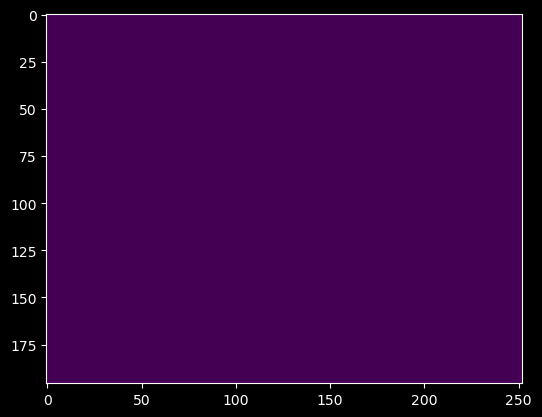

In [12]:
plt.imshow(GRID_active)

In [13]:

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')


<>:23: SyntaxWarning: invalid escape sequence '\D'
<>:25: SyntaxWarning: invalid escape sequence '\D'
<>:23: SyntaxWarning: invalid escape sequence '\D'
<>:25: SyntaxWarning: invalid escape sequence '\D'
<ipython-input-13-71b6cb750305>:23: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-13-71b6cb750305>:25: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:


In [14]:
change_indices

array([  7935,  15738,  23134,  29973,  36613,  91881, 155665, 212033,
       260034, 293232, 314496, 325609, 332855, 333505, 333517],
      dtype=int64)

In [15]:
help(kernel_matrix_2d_NOFLAT)

Help on function kernel_matrix_2d_NOFLAT in module __main__:

kernel_matrix_2d_NOFLAT(x, y, x_grid, y_grid, bw, weights, ker_size_frac=4, bw_cutoff=2)
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution.
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input:
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the k

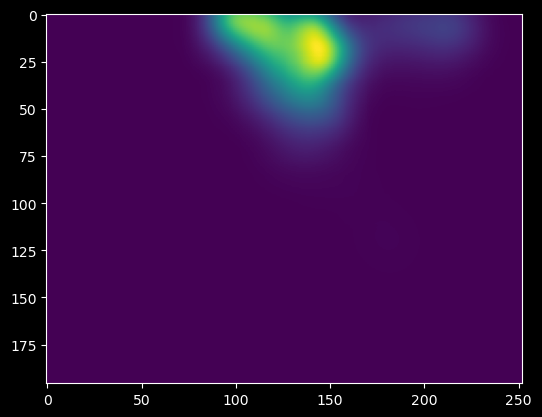

In [16]:
plt.imshow(GRID_atm[600,:,:])

In [17]:
28*24

672

In [18]:

GRID_atm_flux = GRID_atm_flux[672:,:,:] #remove the first day

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')


<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\%'
<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-19-00b5277730d9>:39: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-19-00b5277730d9>:39: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-19-00b5277730d9>:39: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-19-00b5277730d9>:39: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m

TypeError: Shapes of x (196, 252) and z (252, 196) do not match

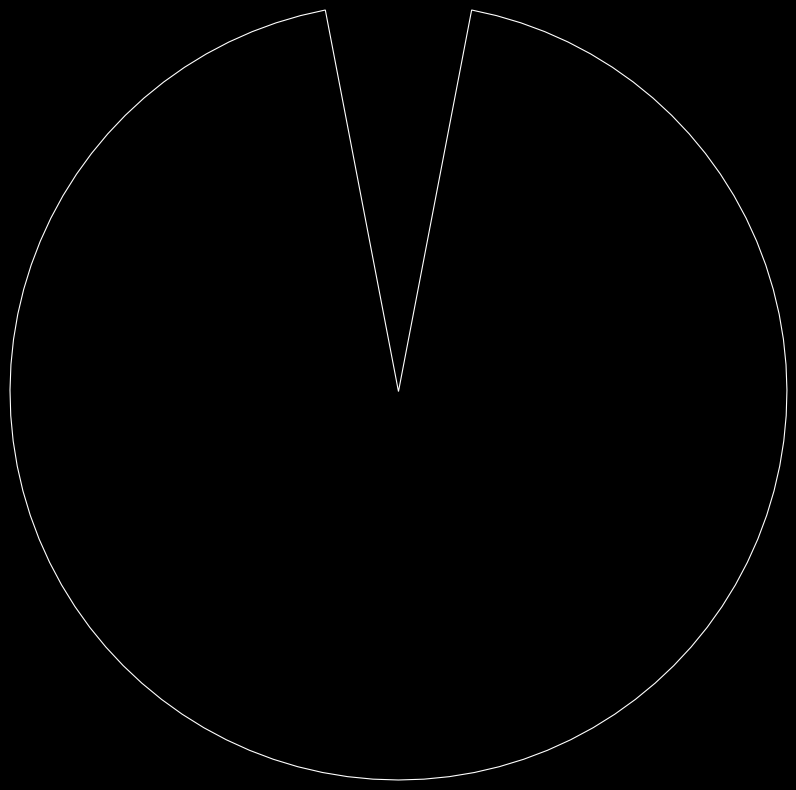

In [19]:

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/15,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

In [20]:
np.shape(lons_zoomed)

(196, 252)

In [21]:
np.shape(ws_zoomed)

(196, 252)

In [22]:
np.shape(lats_zoomed)

(196, 252)

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-23-e63a42b590a7>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-23-e63a42b590a7>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-23-e63a42b590a7>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-23-e63a42b590a7>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m

NameError: name 'min_lon' is not defined

c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


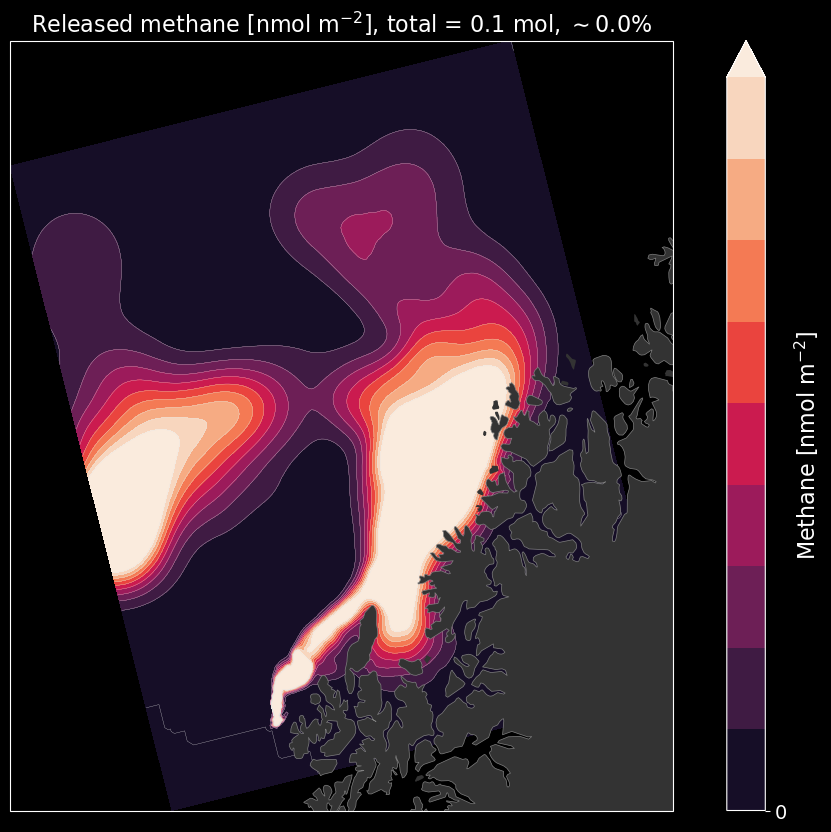

In [23]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

In [ ]:


#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\%'
<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-24-af3bd3a70c1f>:22: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-24-af3bd3a70c1f>:22: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-24-af3bd3a70c1f>:22: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-24-af3bd3a70c1f>:22: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m

NameError: name 'min_lon' is not defined

c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


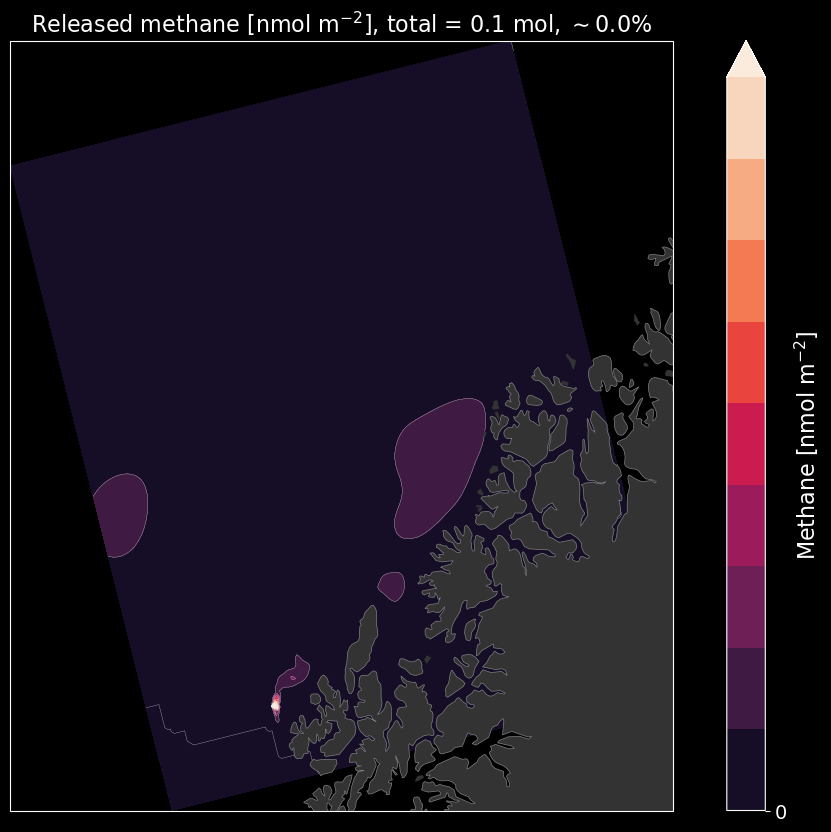

In [24]:

levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed)),60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

In [25]:
lon_mesh

array([[12.46253083, 12.46091957, 12.45930611, ..., 11.97984863,
        11.97751484, 11.97517725],
       [12.50158652, 12.5       , 12.49841131, ..., 12.02630882,
        12.0240108 , 12.02170904],
       [12.54064438, 12.5390826 , 12.53751868, ..., 12.07277273,
        12.07051049, 12.06824457],
       ...,
       [20.00045081, 20.00361405, 20.0067816 , ..., 20.9469824 ,
        20.95155337, 20.95613173],
       [20.03929749, 20.04248505, 20.04567695, ..., 20.99308387,
        20.99768977, 21.0023031 ],
       [20.07813983, 20.08135171, 20.08456795, ..., 21.03917794,
        21.04381873, 21.04846702]])

In [26]:
min_lon

NameError: name 'min_lon' is not defined

In [27]:

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\%'
<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-28-325f07565de6>:22: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-28-325f07565de6>:22: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

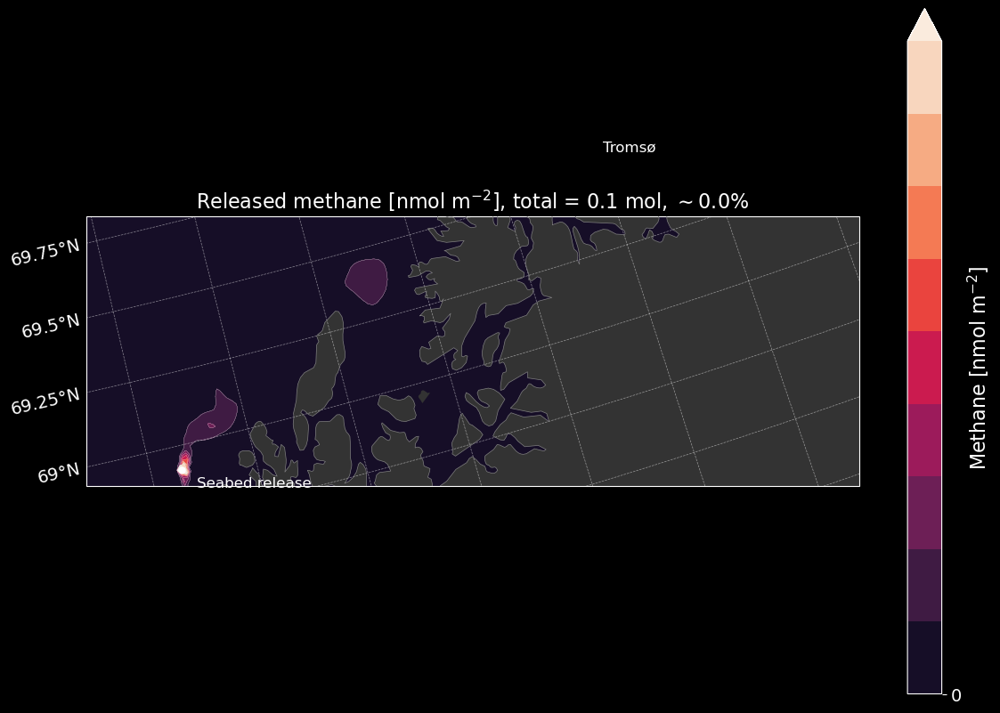

In [28]:

levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed)),60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


In [29]:


#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)


<>:32: SyntaxWarning: invalid escape sequence '\s'
<>:32: SyntaxWarning: invalid escape sequence '\%'
<>:32: SyntaxWarning: invalid escape sequence '\s'
<>:32: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-30-b3cdf67eb4cc>:32: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-30-b3cdf67eb4cc>:32: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-30-b3cdf67eb4cc>:32: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-30-b3cdf67eb4cc>:32: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m

TypeError: Shapes of x (252, 196) and z (196, 252) do not match

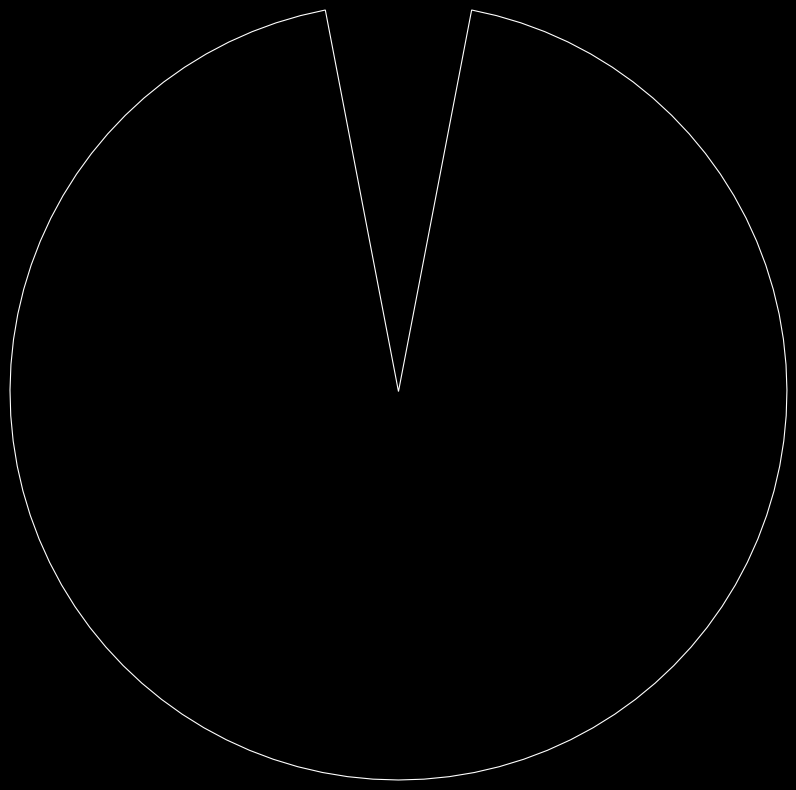

In [30]:

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed)),60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

In [31]:
np.shape(GRID_atm_flux_mm_m2)

(913, 196, 252)

In [32]:
np.shape(GRID_atm_flux)

(913, 196, 252)

<>:93: SyntaxWarning: invalid escape sequence '\s'
<>:93: SyntaxWarning: invalid escape sequence '\%'
<>:93: SyntaxWarning: invalid escape sequence '\s'
<>:93: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-33-d83558ce5b27>:93: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-33-d83558ce5b27>:93: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-33-d83558ce5b27>:93: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-33-d83558ce5b27>:93: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m

TypeError: Shapes of x (252, 196) and z (196, 252) do not match

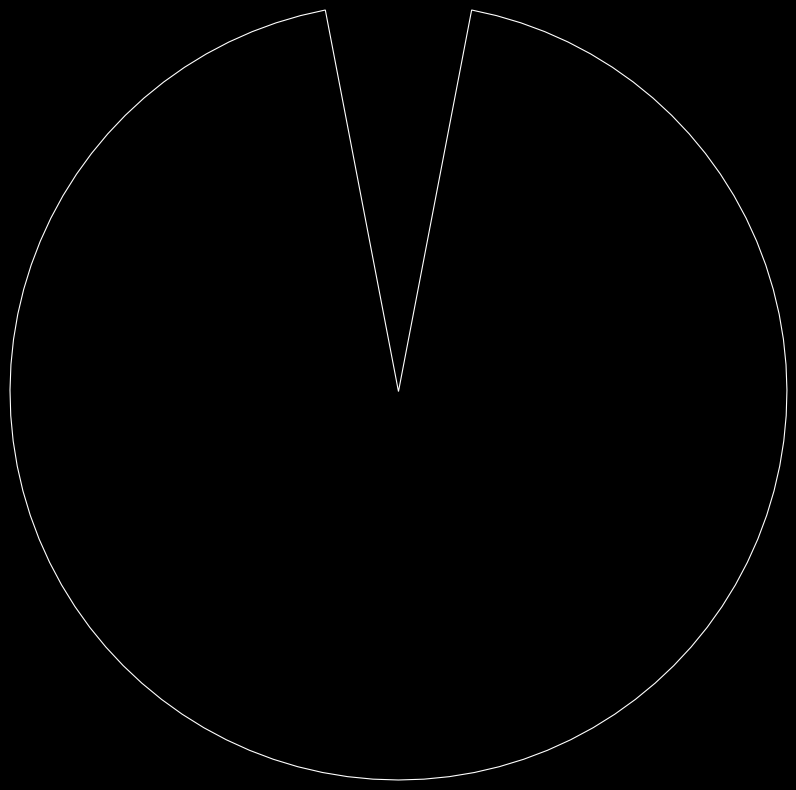

In [33]:


#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

#GRID_atm_flux = GRID_atm_flux[672:,:,:] #remove the first day

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed)),60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

<>:93: SyntaxWarning: invalid escape sequence '\s'
<>:93: SyntaxWarning: invalid escape sequence '\%'
<>:93: SyntaxWarning: invalid escape sequence '\s'
<>:93: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-34-c61a0adfb680>:93: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-34-c61a0adfb680>:93: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

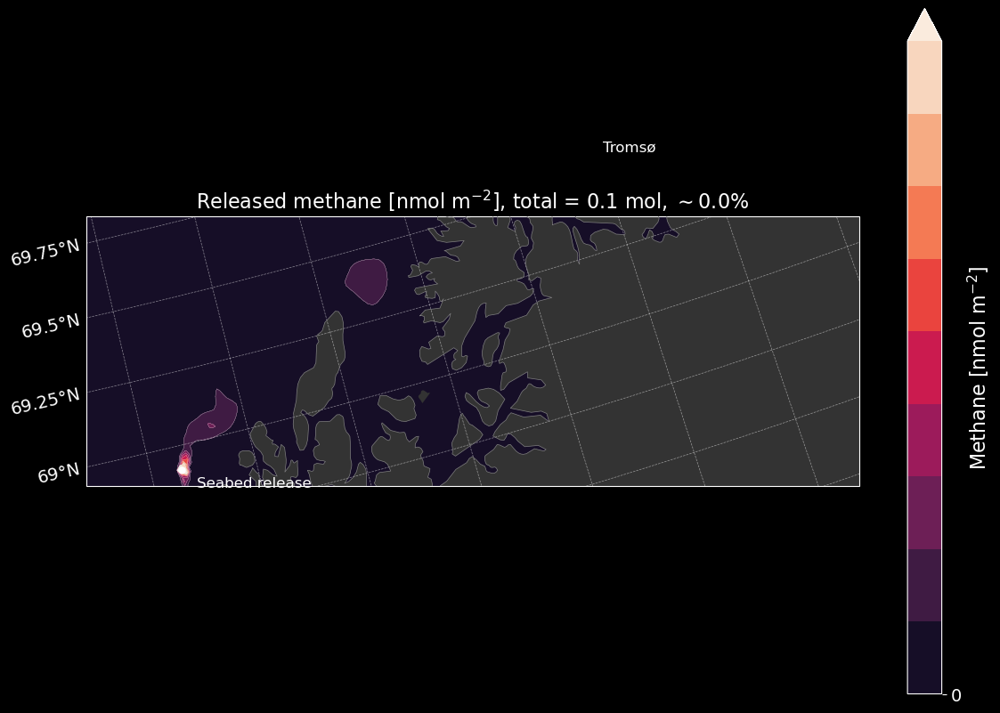

In [34]:
#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

#GRID_atm_flux = GRID_atm_flux[672:,:,:] #remove the first day

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed)),60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 24.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-35-bd641ef32c6b>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-35-bd641ef32c6b>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

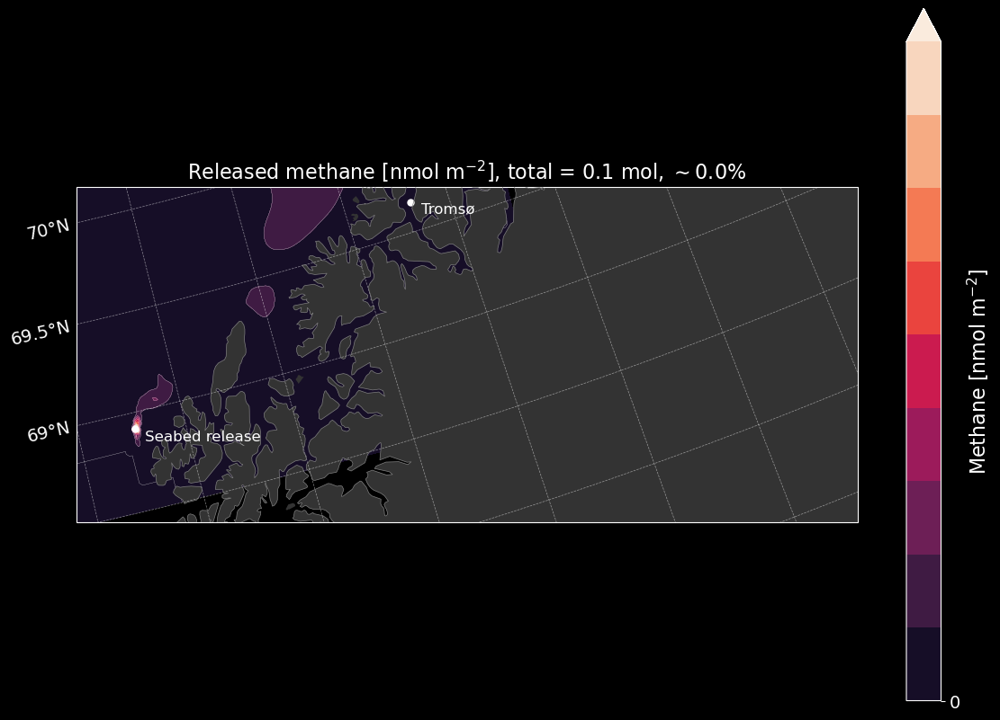

In [35]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

min_lon = 12
max_lon = 24.5
min_lat = 68.5
max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-36-468a78fcc40d>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-36-468a78fcc40d>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

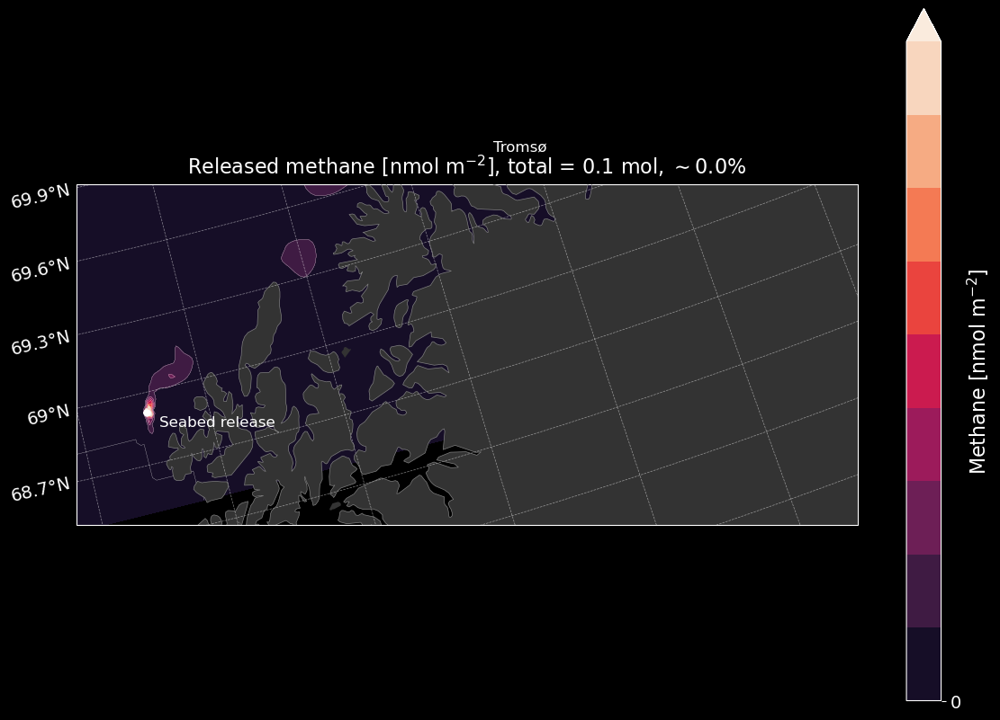

In [36]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

min_lon = 12
max_lon = 22.5
min_lat = 68.5
max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)

#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


In [37]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

min_lon = 12
max_lon = 22.5
min_lat = 68.5
max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits
ax.set_xlim([min_lon,max_lon])
ax.set_ylim([min_lat,max_lat])


#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-37-2405b2bd405d>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-37-2405b2bd405d>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


ValueError: Image size of 60368415x10632334 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1400x1000 with 2 Axes>

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-38-d173bd7e16e0>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-38-d173bd7e16e0>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


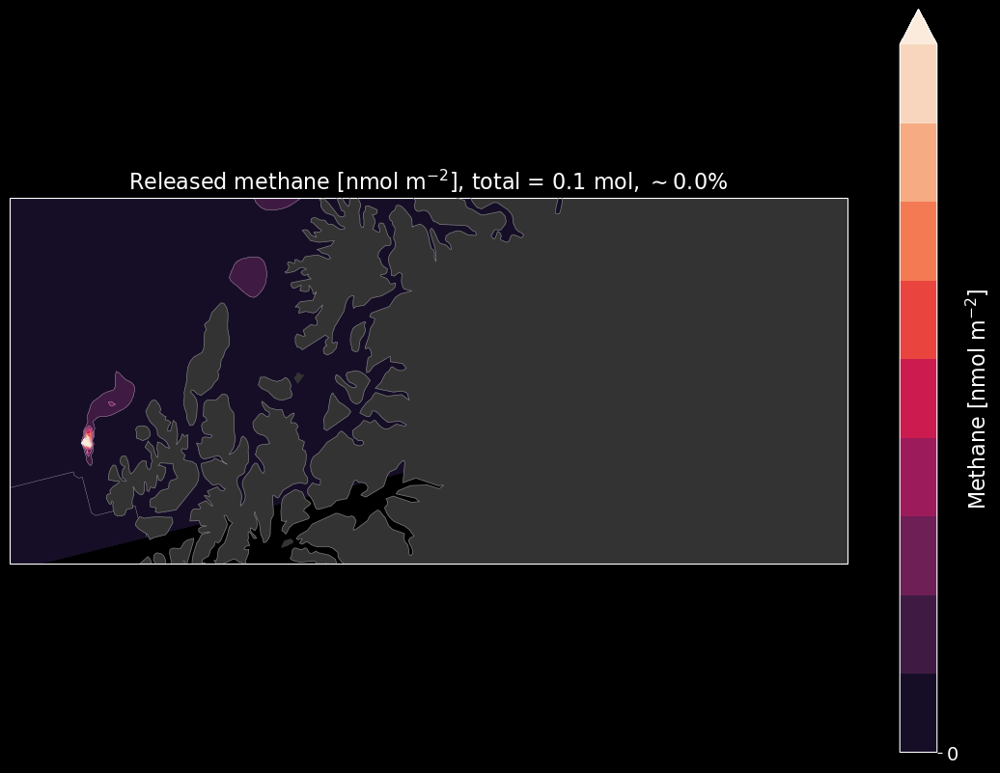

In [38]:
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

min_lon = 12
max_lon = 22.5
min_lat = 68.5
max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])

<>:93: SyntaxWarning: invalid escape sequence '\s'
<>:93: SyntaxWarning: invalid escape sequence '\%'
<>:93: SyntaxWarning: invalid escape sequence '\s'
<>:93: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-39-b1be18b80543>:93: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-39-b1be18b80543>:93: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

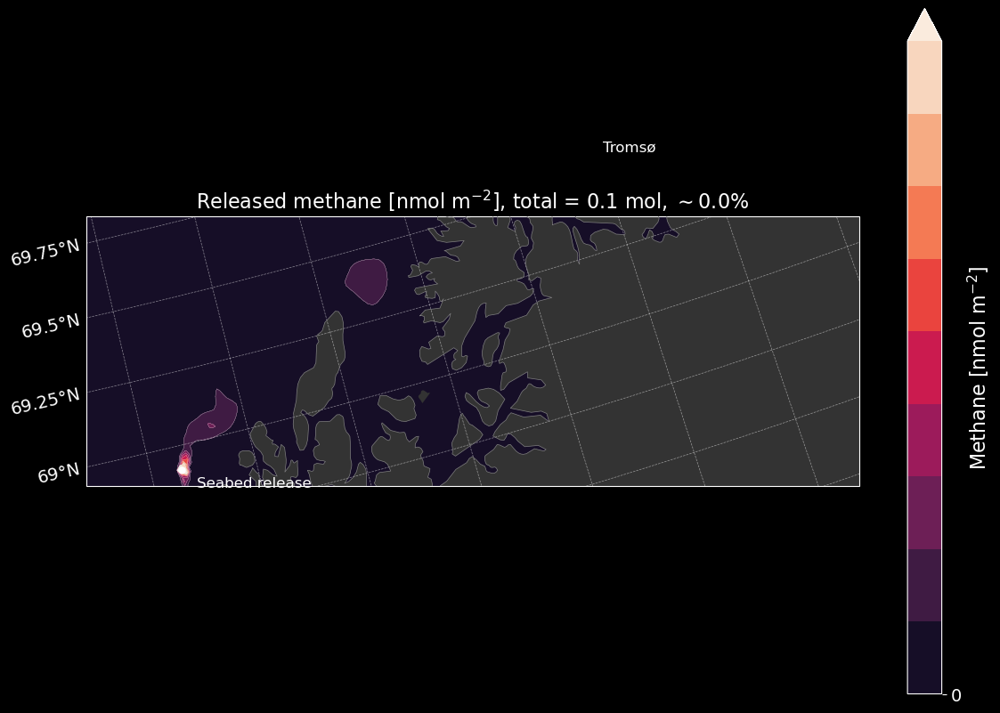

In [39]:


#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

#GRID_atm_flux = GRID_atm_flux[672:,:,:] #remove the first day

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum*1000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed)),60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


In [40]:
bin_x_mesh

array([[396170.98668577, 397770.98668577, 399370.98668577, ...,
        704970.98668577, 706570.98668577, 708170.98668577],
       [396170.98668577, 397770.98668577, 399370.98668577, ...,
        704970.98668577, 706570.98668577, 708170.98668577],
       [396170.98668577, 397770.98668577, 399370.98668577, ...,
        704970.98668577, 706570.98668577, 708170.98668577],
       ...,
       [396170.98668577, 397770.98668577, 399370.98668577, ...,
        704970.98668577, 706570.98668577, 708170.98668577],
       [396170.98668577, 397770.98668577, 399370.98668577, ...,
        704970.98668577, 706570.98668577, 708170.98668577],
       [396170.98668577, 397770.98668577, 399370.98668577, ...,
        704970.98668577, 706570.98668577, 708170.98668577]])

In [41]:
np.max(lat_mesh)

72.10538210825267

In [42]:
max_lat

72.10538210825267

<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\%'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-43-c150680c684f>:12: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = ' + str(np.round(total_sum, 2)) + ' mol, $\sim' + str(percent_of_release) + '\%$', fontsize=16)
<ipython-input-43-c150680c684f>:12: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = ' + str(np.round(total_sum, 2)) + ' mol, $\sim' + str(percent_of_release) + '\%$', fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-pack

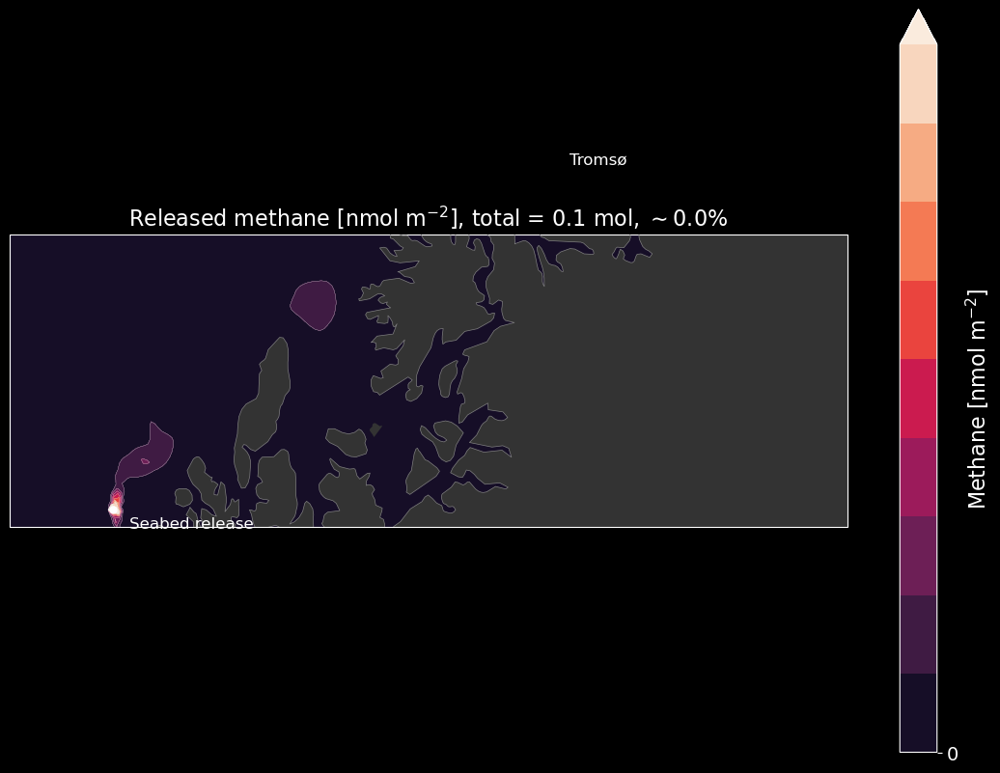

In [43]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0], projection=projection)

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels, cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0, extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = ' + str(np.round(total_sum, 2)) + ' mol, $\sim' + str(percent_of_release) + '\%$', fontsize=16)

contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels=levels, colors='0.9', 
                     linewidths=0.2, transform=ccrs.PlateCarree(), zorder=1)

# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color='0.5', linewidth=0.5)

# Plot a red dot at the location of Tromsø
ax.plot(18.9553, 69.6496, marker='o', color='white', markersize=5, transform=ccrs.PlateCarree())
# with a text label
ax.text(19.0553, 69.58006, 'Tromsø', transform=ccrs.PlateCarree(), color='white', fontsize=12)

# Add dot where the release is (at 14.29, 68.9179949)
ax.plot(14.29, 68.9179949, marker='o', color='white', markersize=5, transform=ccrs.PlateCarree())
# Add text in lower right corner with the total sum
ax.text(14.39, 68.8479949, 'Seabed release', transform=ccrs.PlateCarree(), color='white', fontsize=12)

# Set the geographical extent of the plot
ax.set_extent([min_lon + 1.5, max_lon, min_lat + 0.5, max_lat - 3], crs=ccrs.PlateCarree())

# Show the plot
plt.show()

<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\%'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-44-336e035d7c6d>:12: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = ' + str(np.round(total_sum, 2)) + ' mol, $\sim' + str(percent_of_release) + '\%$', fontsize=16)
<ipython-input-44-336e035d7c6d>:12: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = ' + str(np.round(total_sum, 2)) + ' mol, $\sim' + str(percent_of_release) + '\%$', fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-pack

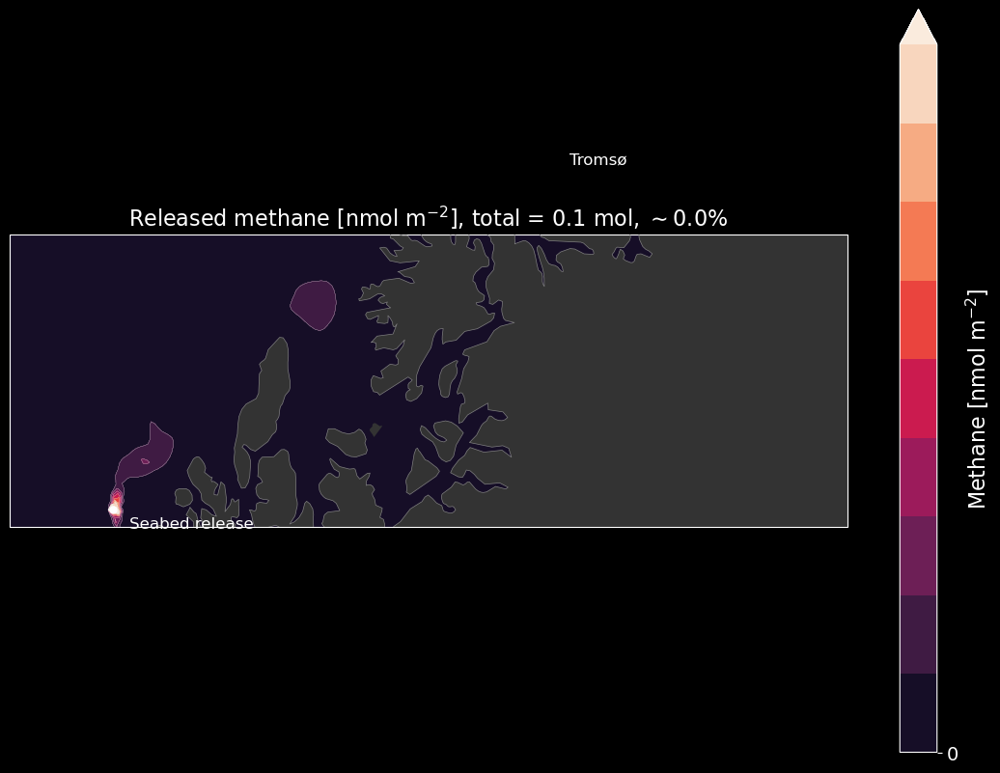

In [44]:
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0], projection=projection)

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels, cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0, extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = ' + str(np.round(total_sum, 2)) + ' mol, $\sim' + str(percent_of_release) + '\%$', fontsize=16)

contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels=levels, colors='0.9', 
                     linewidths=0.2, transform=ccrs.PlateCarree(), zorder=1)

# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color='0.5', linewidth=0.5)

# Plot a red dot at the location of Tromsø
ax.plot(18.9553, 69.6496, marker='o', color='white', markersize=5, transform=ccrs.PlateCarree())
# with a text label
ax.text(19.0553, 69.58006, 'Tromsø', transform=ccrs.PlateCarree(), color='white', fontsize=12)

# Add dot where the release is (at 14.29, 68.9179949)
ax.plot(14.29, 68.9179949, marker='o', color='white', markersize=5, transform=ccrs.PlateCarree())
# Add text in lower right corner with the total sum
ax.text(14.39, 68.8479949, 'Seabed release', transform=ccrs.PlateCarree(), color='white', fontsize=12)

# Set the geographical extent of the plot
ax.set_extent([min_lon + 1.5, max_lon, min_lat + 0.5, max_lat - 3], crs=ccrs.PlateCarree())

# Show the plot
plt.show()

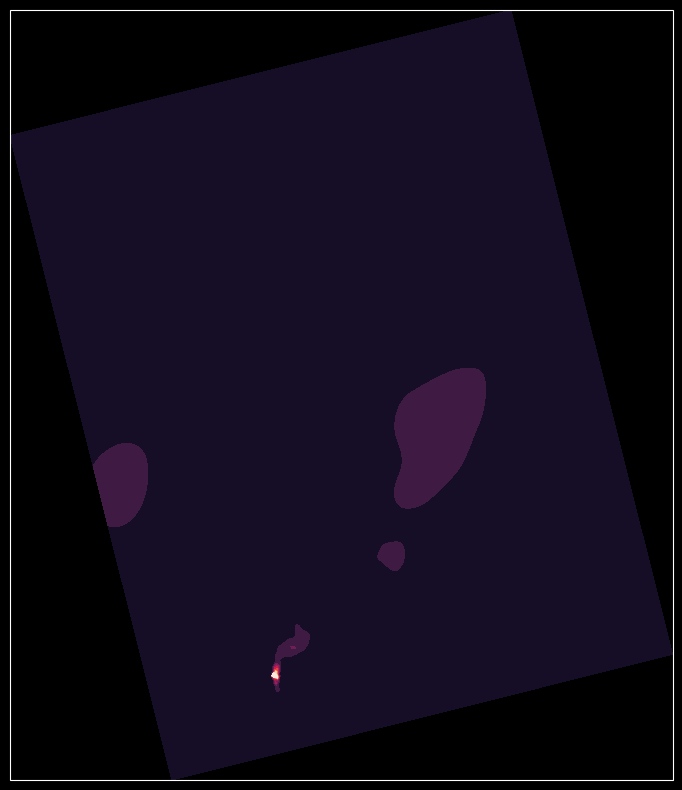

In [45]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-46-bd1ceaaae4b9>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-46-bd1ceaaae4b9>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


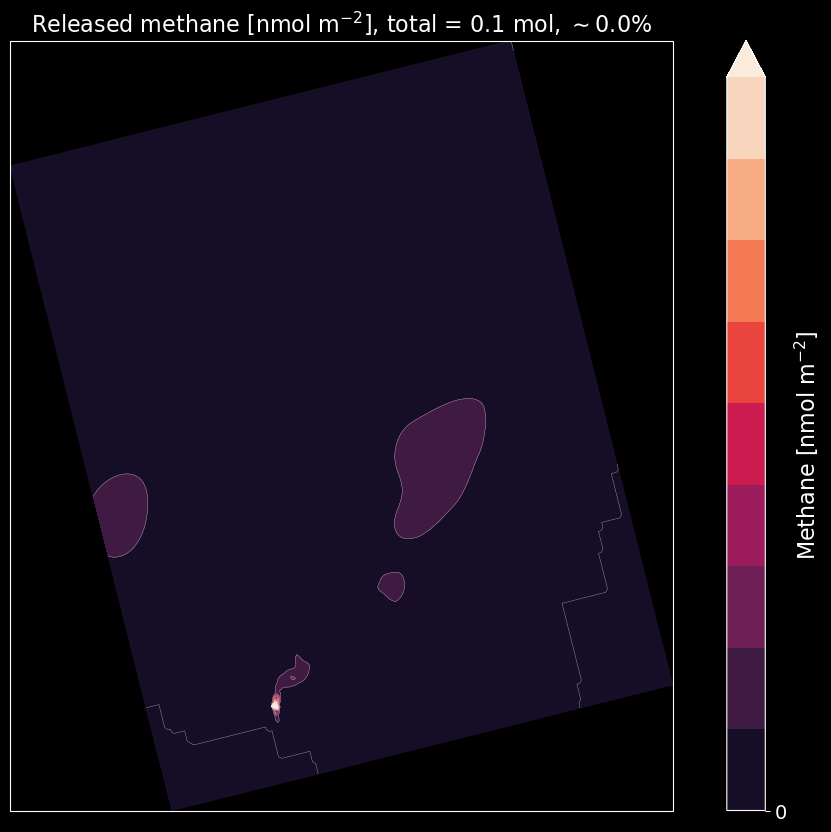

In [46]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-47-d3601a75f4b8>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-47-d3601a75f4b8>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)


c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


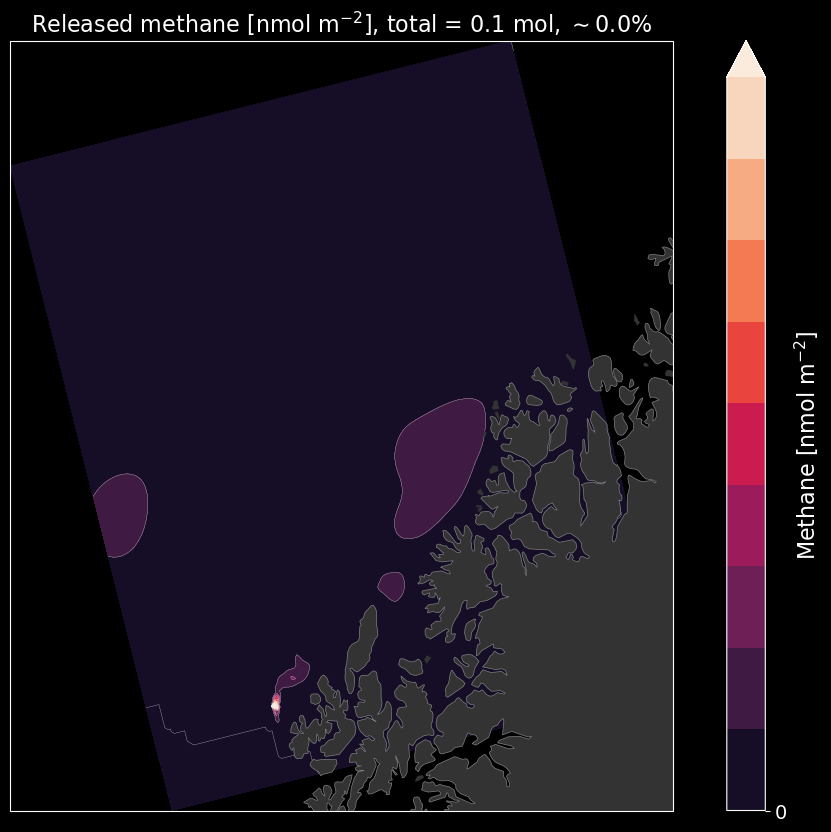

In [47]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-48-6946730f66b2>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-48-6946730f66b2>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


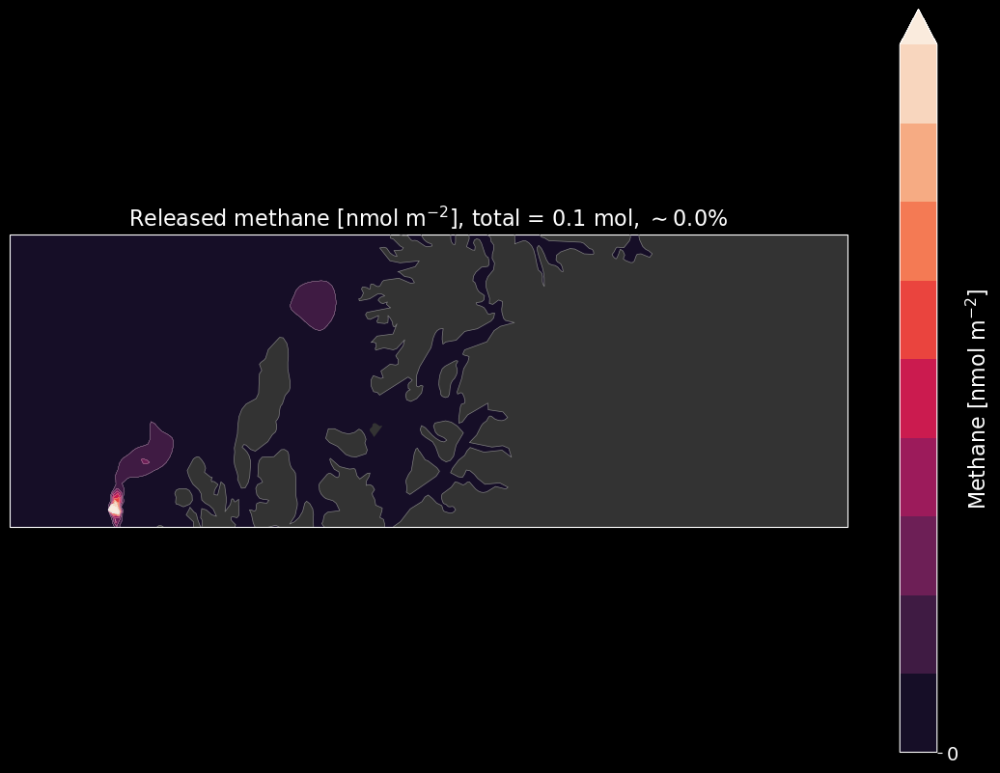

In [48]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-3])

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-49-e1e699f25c6d>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-49-e1e699f25c6d>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

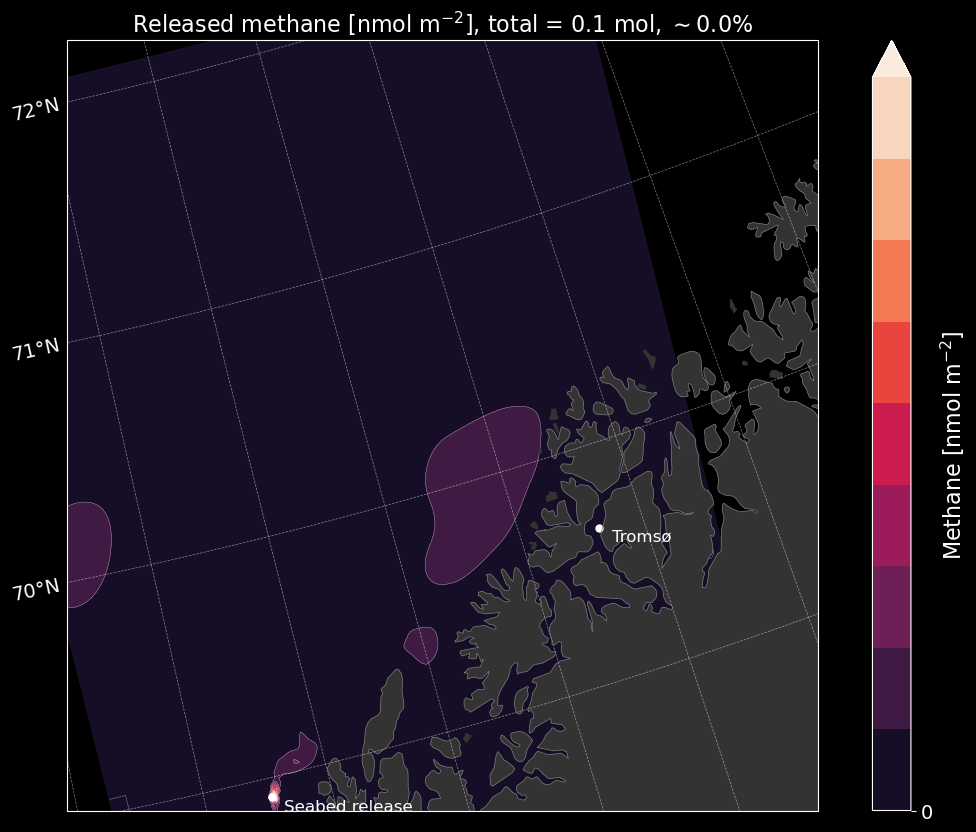

In [49]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon, min_lat+0.5, max_lat-0.5])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-50-ba52b8a60c5f>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-50-ba52b8a60c5f>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

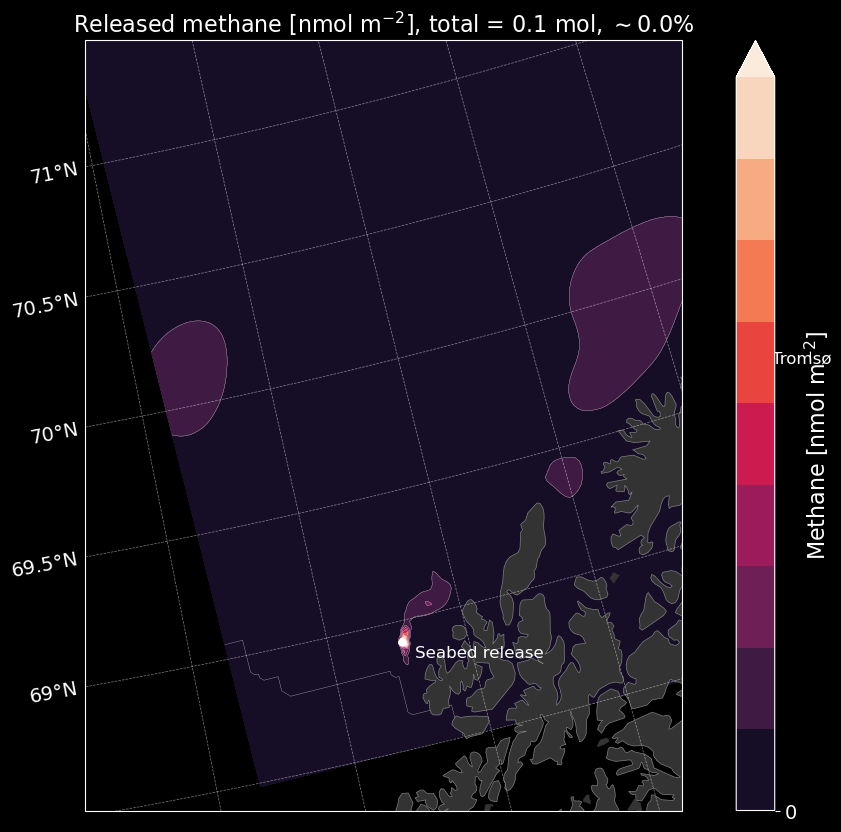

In [50]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon, max_lon-4, min_lat, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-51-9c9279643261>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-51-9c9279643261>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

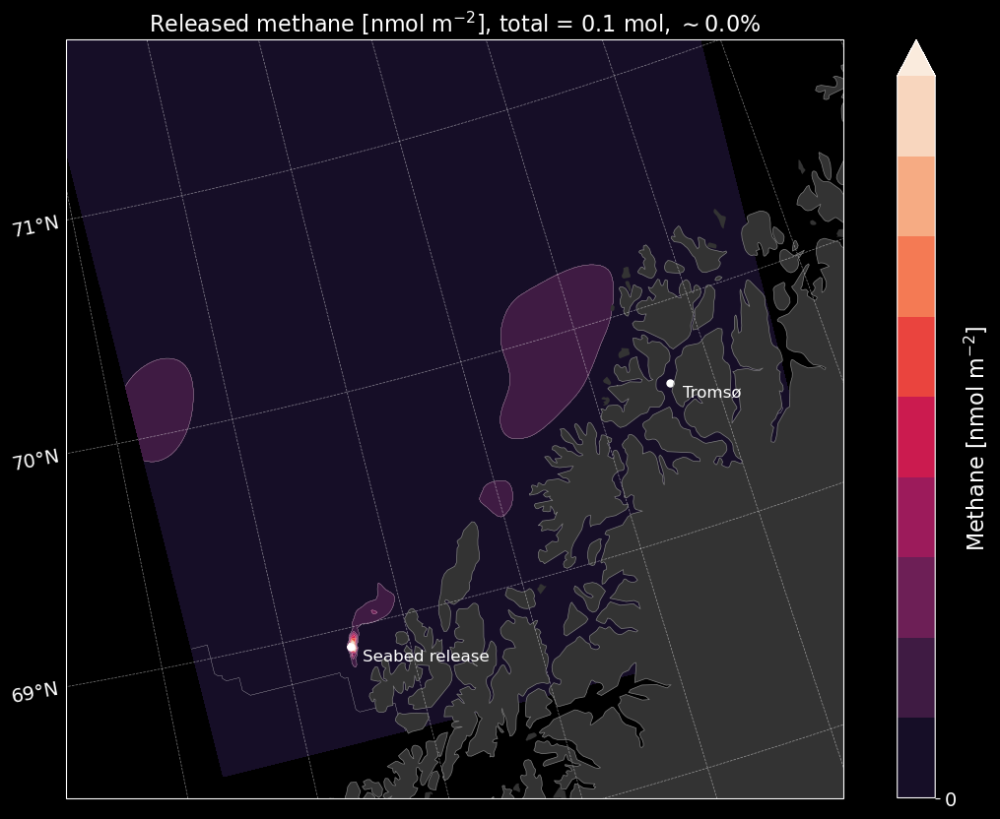

In [51]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon, max_lon-1, min_lat, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-52-de71ae558bba>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-52-de71ae558bba>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

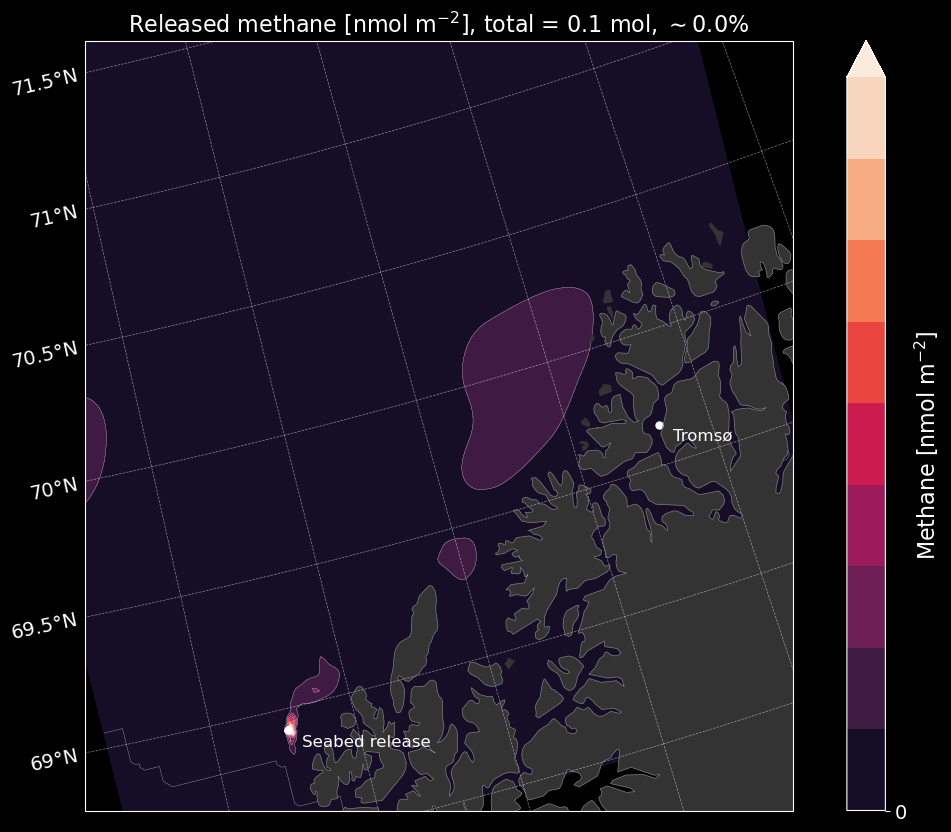

In [52]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\%'
<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-53-bdec27c57b61>:22: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-53-bdec27c57b61>:22: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

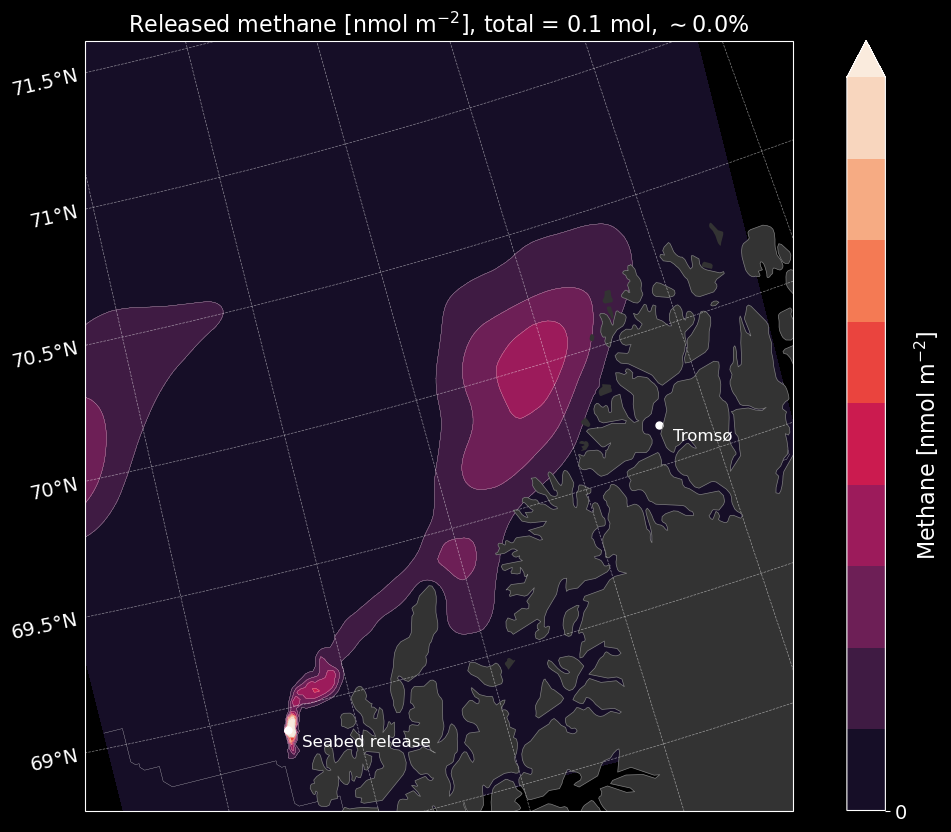

In [53]:

levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/2,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+1.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-54-94164b60638a>:17: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-54-94164b60638a>:17: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

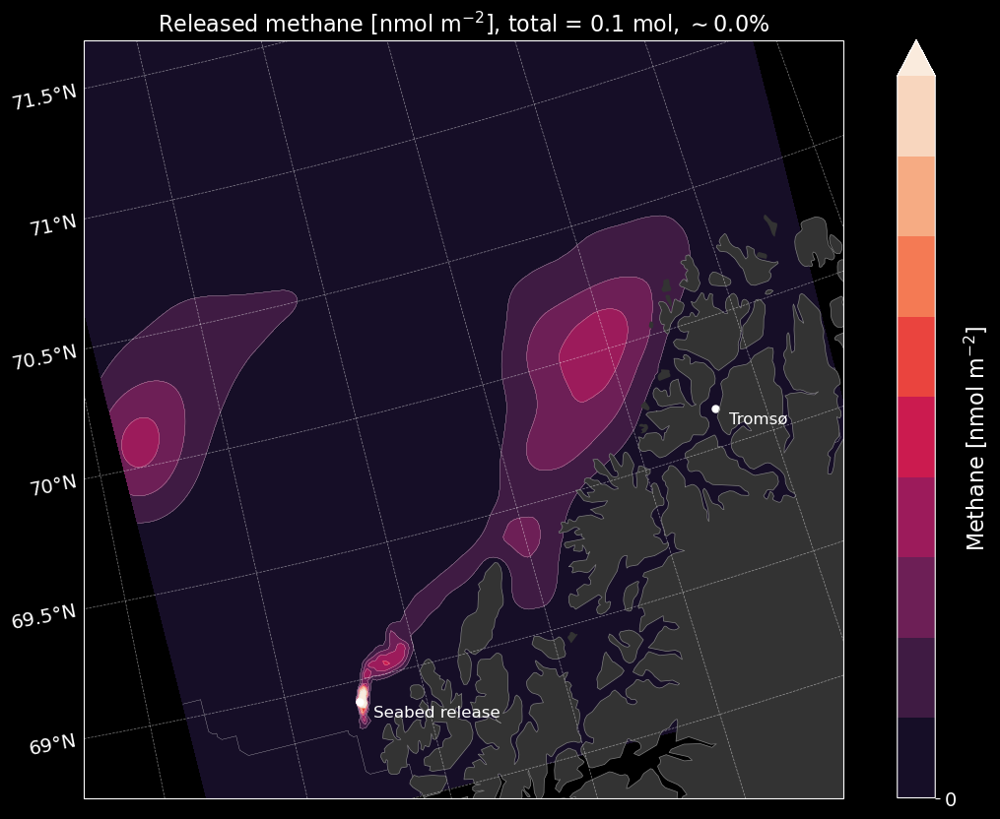

In [54]:

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+0.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

In [55]:
np.unique(np.round(levels[:-1]))

array([0.])

In [56]:
levels[:-1]

array([0.        , 0.00543971, 0.01087941, 0.01631912, 0.02175882,
       0.02719853, 0.03263823, 0.03807794, 0.04351764])

<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\%'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-57-215bfa7fb5bb>:28: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-57-215bfa7fb5bb>:28: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

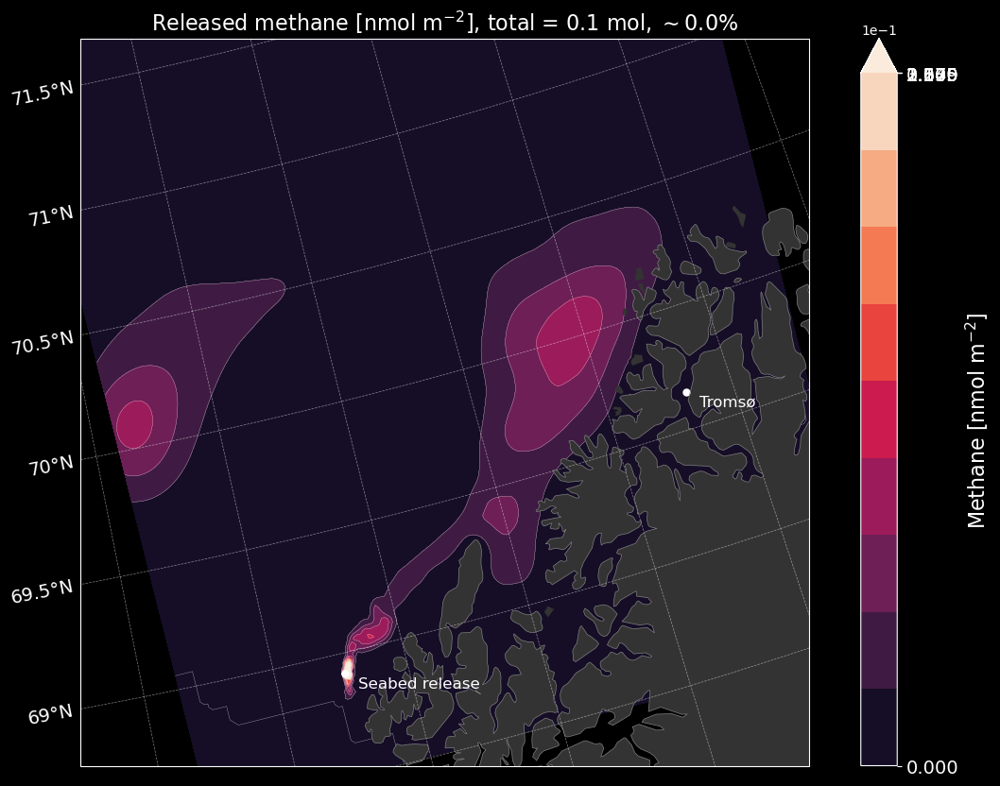

In [57]:

levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/2,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
#get a ticklabel vector (should be 7 ticks with even spacing from 0 to max)
ticklabelvector = np.linspace(0,np.nanmax(np.nanmax(ws_zoomed))/2,7)
#cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.set_ticks(ticklabelvector)
#make the colorbar ticks in scientific notation
cbar.ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+0.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\%'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-58-0e2f93a54f63>:28: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-58-0e2f93a54f63>:28: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

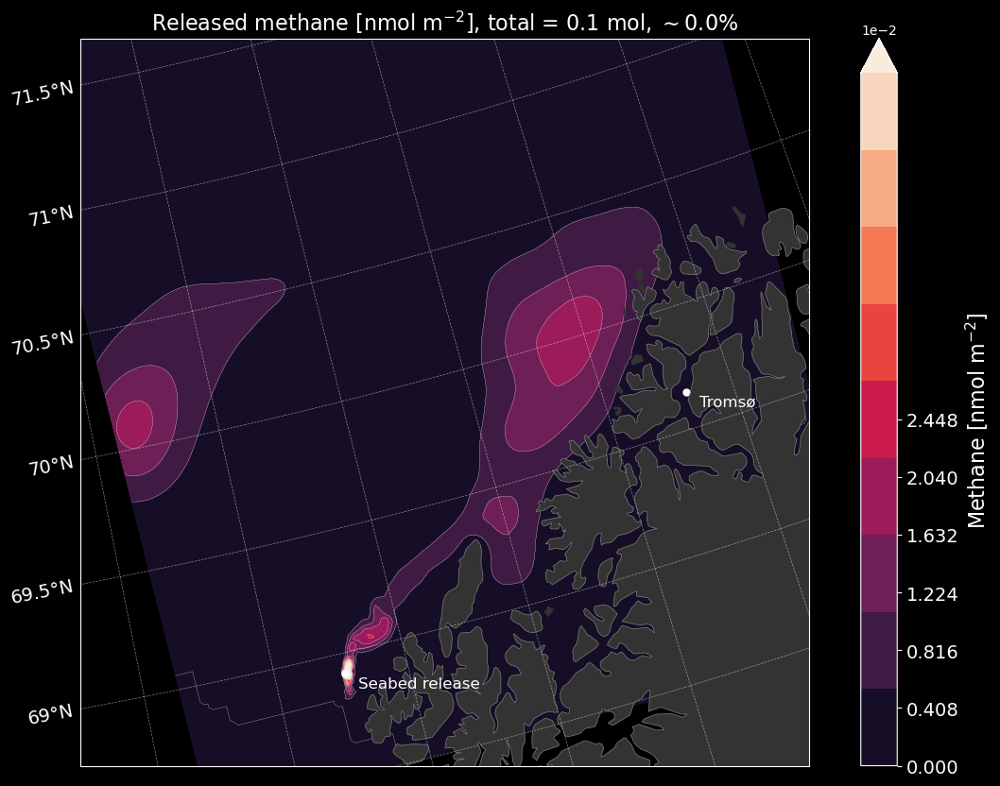

In [58]:

levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/2,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
#get a ticklabel vector (should be 7 ticks with even spacing from 0 to max)
ticklabelvector = np.linspace(0,np.nanmax(np.nanmax(levels))/2,7)
#cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.set_ticks(ticklabelvector)
#make the colorbar ticks in scientific notation
cbar.ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+0.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\%'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-59-f461b1877707>:28: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-59-f461b1877707>:28: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

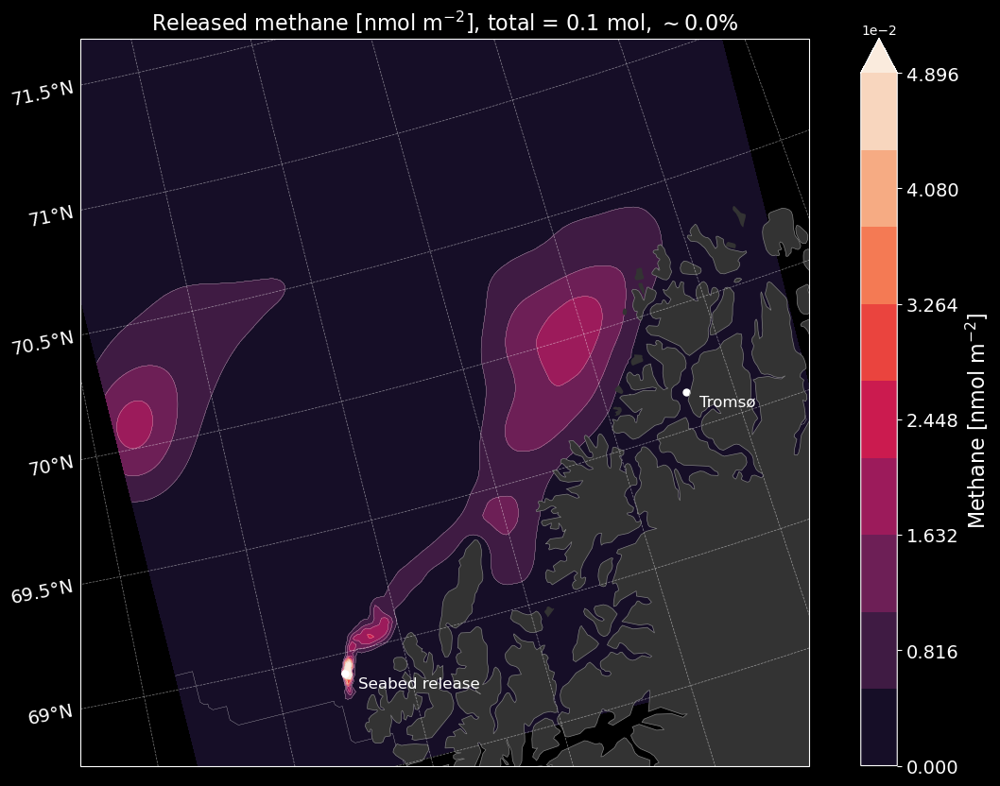

In [59]:

levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/2,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
#get a ticklabel vector (should be 7 ticks with even spacing from 0 to max)
ticklabelvector = np.linspace(0,np.nanmax(np.nanmax(levels)),7)
#cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.set_ticks(ticklabelvector)
#make the colorbar ticks in scientific notation
cbar.ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+0.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

<>:35: SyntaxWarning: invalid escape sequence '\s'
<>:35: SyntaxWarning: invalid escape sequence '\%'
<>:35: SyntaxWarning: invalid escape sequence '\s'
<>:35: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-60-b9f7e70bad89>:35: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
<ipython-input-60-b9f7e70bad89>:35: SyntaxWarning: invalid escape sequence '\%'
  ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\kdo000\AppData\Local\anaconda3\envs\gas_dist_modelling\Lib\site-packages\cartopy\mpl\sty

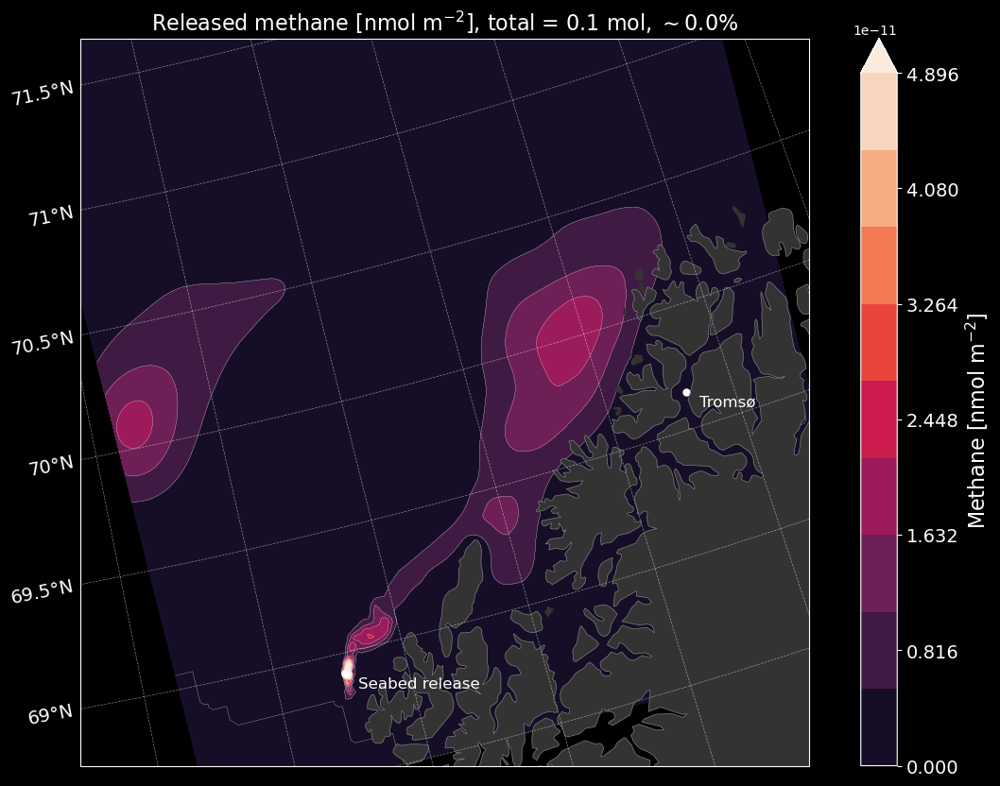

In [60]:
ws_zoomed = GRID_atm_flux_sum/1000000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/2,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [nmol m$^{-2}$]', fontsize=16)
#get a ticklabel vector (should be 7 ticks with even spacing from 0 to max)
ticklabelvector = np.linspace(0,np.nanmax(np.nanmax(levels)),7)
#cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.set_ticks(ticklabelvector)
#make the colorbar ticks in scientific notation
cbar.ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [nmol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+0.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()


In [61]:
'''
Load and plot opendrift data

Author: Knut Ola Dølven

I think this one runs the big simulation.. 

'''
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import netCDF4 as nc
import utm
from scipy.sparse import coo_matrix as coo_matrix
from scipy.sparse import csr_matrix as csr_matrix
import pickle
from numba import jit, prange
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numpy.ma import masked_invalid
import imageio
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter
import seaborn as sns
import time


###############   
###SET RULES###
###############

plotting = False
#Set plotting style
plt.style.use('dark_background') 
#fit wind data
fit_wind_data = False
#fit gas transfer velocity
fit_gt_vel = False
#set path for wind model pickle file
wind_model_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\interpolated_wind_sst_fields_test.pickle'
#plot wind data
plot_wind_field = False
#plot gas transfer velocity
plot_gt_vel = False
#Use all depth layers
use_all_depth_layers = False
### CONSTANTS ###
#max kernel bandwidth
max_ker_bw = 17500
#atmospheric background concentration
#atmospheric_conc = ((44.64*2)/1000000) #mol/m3 #1911.8 ± 0.6 ppb #44.64 #From Helge
atmospheric_conc = (3.3e-09)*1000 #mol/m3 #ASSUMING SATURATION CONCENTRATION EVERYWHERE. 
#oceanic background concentration
background_ocean_conc = (3.3e-09)*1000 #mol/m3
#Oswald solubility coeffocient
oswald_solu_coeff = 0.28 #(for methane)
#Set projection
projection = ccrs.LambertConformal(central_longitude=0.0, central_latitude=70.0, standard_parallels=(70.0, 70.0))
#grid size
dxy_grid = 1600. #m
dz_grid = 15. #m
#grid cell volume
V_grid = dxy_grid*dxy_grid*dz_grid
#age constant
age_constant = 36 #m per hour, see figure.
#Initial bandwidth
initial_bandwidth = 50 #m
#set colormap
#colromap = 'magma'
colormap = sns.color_palette("rocket", as_cmap=True)
#K value for the microbial oxidation (MOx) (see under mox section for more values)
R_ox = 10**-7 #s^-1
#total seabed release
total_seabed_release = 20833
#only for top layer trigger
kde_all = True
#Weight full sim
weights_full_sim = 0.0408 #mol/hr
#Set manual border for grid
manual_border = True

#List of variables in the script:
#datapath: path to the netcdf file containing the opendrift data|
#ODdata: netcdf file containing the opendrift data
#particles: dictionary containing information about the drift particles
#GRID: list of lists containing the horizontal fields at each depth and time step as sparse matrices

 #create a list of lists containing the horizontal fields at each depth and time step as sparse matrices
GRID = []

################################
########## FUNCTIONS ###########
################################

def load_nc_data(filename):
    '''
    Load netcdf file and return a dictionary with the variables
    '''
    #load data
    ODdata = nc.Dataset(filename)

    #check the variables in the file
    print(ODdata.variables.keys())

    #Create a dictionary with the variables (just more used to working with dictionaries)
    particles = {'lon':ODdata.variables['lon'][:].copy(),
                        'lat':ODdata.variables['lat'][:].copy(),
                        'z':ODdata.variables['z'][:].copy(),
                        'time':ODdata.variables['time'][:].copy(),
                        'status':ODdata.variables['status'][:].copy(),
                        'trajectory':ODdata.variables['trajectory'][:].copy()} #this is 

    #example of usage
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'
    #particles = load_nc_data(datapath)
    return particles

###########################################################################################

#@numba.jit(nopython=False)
def create_grid(time,
                UTM_x_minmax,
                UTM_y_minmax,
                maxdepth,
                resolution=[1000,10],
                savefile_path=False,
                grid_params=[],
                fill_data = False):
    '''
    Creates a list of lists containing sparse matrices for each horizontal field at each 
    depth level and time step. 
    Saves the grid object as a pickle file for later use as option.
    Creates a csr matrix with GRID[timestep][depth_level]

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.
    savefile_path: path to where the grid object should be saved as a pickle file
    grid_params: list containing the grid parameters. If this is not empty, the grid object will not be created
    but parameters from the grid_params list will be used. The list should contain the following:
    [bin_x,bin_y,bin_z,bin_time].
    fill_data: boolean. If True, the grid object will be filled with the horizontal fields from
    the particles dictionary
    maxdepth: maximum depth of the drift

    Output:
    GRID: list of lists containing the sparse matrices for each horizontal field at each
        depth level and time step
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid
    '''
    #Create a 4 dimensional grid, covering the whole area of the drift and all timesteps
    #Define grid spatial resolution

    if not grid_params:
        grid_resolution = resolution[0] #in meters
        #Define temporal resolution
        grid_temporal_resolution = time[1] - time[0] #the time resolution from OD.
        #Define vertical resolution
        grid_vertical_resolution = resolution[1] #in meters

        ### CREATE HORIZONTAL GRID ###
        UTM_x_min = UTM_x_minmax[0]
        UTM_x_max = UTM_x_minmax[1]
        UTM_y_min = UTM_y_minmax[0]
        UTM_y_max = UTM_y_minmax[1]

        #Define the bin edges using the grid resolution and min/max values
        bin_x = np.arange(UTM_x_min-grid_resolution,
                          UTM_x_max+grid_resolution,
                          grid_resolution)
        bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)

        #Create a horizontal matrix with sizes bin_x and bin_y containing only zeroes
        #This is the matrix that will be filled with the horizontal fields
        H_0 = np.zeros((bin_x.shape[0],bin_y.shape[0]))

        ### CREATE VERTICAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_z = np.arange(0,
                          maxdepth+grid_vertical_resolution,
                          grid_vertical_resolution)

        ### CREATE TEMPORAL GRID ###
        #Define the bin edges using the grid resolution and min/max values
        bin_time = np.arange(np.min(time),
                             np.max(time)+grid_temporal_resolution,
                             grid_temporal_resolution)
    
    #Loop over all time steps and depth levels and create a sparse matrix for each
    GRID = []
    #GRID.append([])
    for i in range(0,bin_time.shape[0]):
        #Create a sparse matrix for each depth level and timestep
        print(i)
        GRID.append([])
        #Bin all the particles at time j into different depth levels
        for j in range(0,bin_z.shape[0]):
            #Create a sparse matrix for each time step
            GRID[i].append([])
            #Create a sparse matrix for each depth level
            GRID[i][j] = csr_matrix(H_0)
            #if fill_data == True:
                #Bin the particles in the first time step and depth level to the grid
                #Binned x coordinates:
                #x = UTM_x[z_indices == i,j]
                #Binned y coordinates:
                #y = UTM_y[z_indices == i,j]
                #Find the index locations of the x and y coordinates
                #x_indices = np.digitize(x,bin_x)
                #y_indices = np.digitize(y,bin_y)
                #Create a horizontal field with the same size as the grid and fill with the 
                #horizontal coordinates, adding up duplicates in the x_indices/y_indices list
                #Find duplicates in the x_indices/y_indices list
                #x_indices_unique = np.unique(x_indices)
            #else:
    
    if savefile_path == True:
        #save the grid object as a pickle file for later use
        #filename
        f = savefile_path
        with open('grid_object.pickle', 'wb') as f:
            pickle.dump(GRID, f)
    
    return GRID,bin_x,bin_y,bin_z,bin_time

###########################################################################################

def add_utm(particles):
    '''
    Adds utm coordinates to the particles dictionary
    
    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the lat/lon coordinates

    Output:
    particles: dictionary containing the variables from the netcdf file. Now also contains the UTM coordinates
    
    '''
    #get utm coordinates:
    UTM_x = np.ma.zeros(particles['lon'].shape)
    UTM_x.mask = particles['lon'].mask
    UTM_y = np.ma.zeros(particles['lon'].shape)
    UTM_y.mask = particles['lon'].mask
    #Loop over all time steps
    for i in range(particles['lon'].shape[1]):
        #set all values outside of the UTM domain to nan
        #...
        #Find the UTM coordinates
        valid_indices = ~particles['lat'][:,i].mask & ~particles['lon'][:,i].mask
        UTM_x[valid_indices,i], UTM_y[valid_indices,i], _, _ = utm.from_latlon(particles['lat'][valid_indices,i], particles['lon'][valid_indices,i])
    
        particles['UTM_x'] = UTM_x
        particles['UTM_y'] = UTM_y


    return particles

###########################################################################################


def get_grid_params(particles,resolution=[1000,10]):
    '''
    Gets the grid parameters, i.e. the bin edges for the horizontal, vertical and temporal grids
    from the particles dictionary

    Input:
    particles: dictionary containing the variables from the netcdf file. Must contain the UTM coordinates
    resolution: list containing the horizontal, vertical and temporal resolution of the grid
        default is [1000,10] which means 1000 meters in the horizontal, 10 meters in the vertical.

    Output:
    bin_x: bin edges for the horizontal grid
    bin_y: bin edges for the horizontal grid
    bin_z: bin edges for the vertical grid
    bin_time: bin edges for the temporal grid 
    '''
    #Get min/max values for the horizontal grid
    UTM_x_min = np.min(particles['UTM_x'])
    UTM_x_max = np.max(particles['UTM_x'])
    UTM_y_min = np.min(particles['UTM_y'])
    UTM_y_max = np.max(particles['UTM_y'])

    grid_resolution = resolution[0] #in meters
    #Define temporal resolution
    grid_temporal_resolution = particles['time'][1] - particles['time'][0] #the time resolution from OD.
    #Define vertical resolution
    grid_vertical_resolution = resolution[1] #in meters
    
    #Define the bin edges using the grid resolution and min/max values
    bin_x = np.arange(UTM_x_min-grid_resolution,
                        UTM_x_max+grid_resolution,
                        grid_resolution)
    bin_y = np.arange(UTM_y_min-grid_resolution,
                          UTM_y_max+grid_resolution,
                          grid_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_z = np.arange(0,
                          np.max(np.abs(particles['z']))+grid_vertical_resolution,
                          grid_vertical_resolution)
    #Define the bin edges using the grid resolution and min/max values
    bin_time = np.arange(np.min(particles['time']),
                         np.max(particles['time'])+grid_temporal_resolution,
                         grid_temporal_resolution)

    return bin_x,bin_y,bin_z,bin_time

#############################################################################################################

def calc_schmidt_number(T=5,gas='methane'):
    '''
    Calculates the Schmidt number for methane, co2, oxygen or nitrogen in 
    seawater at a given temperature. Temperature default value is 5 degrees celcius.

    Input:
    T: temperature in degrees celcius
    gas: string containing the name of the gas. Default is methane. Options are 
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    Sc: Schmidt number

    '''
    
    #Coefficient matrix for methane, oxygen, nitrogen, and carbon dioxide
    #Coefficients from Table 1 in Wanninkhof (2014)

    coeffmat = np.array([[2101.2,-131.54,4.4931,-0.08676,0.00070663],
                        [2116.8,-136.25,4.7353,-0.092307,0.0007555],
                        [1920.4,-135.6,5.2122,-0.10939,0.00093713],
                        [2304.8,-162.75,6.2557,-0.13129,0.0011255]])

    if gas == 'methane':
        coeff = coeffmat[0]
    elif gas == 'carbon dioxide':
        coeff = coeffmat[1]
    elif gas == 'oxygen':
        coeff = coeffmat[2]
    elif gas == 'nitrogen':
        coeff = coeffmat[3]
    else:
        print('Error: Gas name not recognized')
    
    Sc = coeff[0] + coeff[1]*T + coeff[2]*T**2 + coeff[3]*T**3 + coeff[4]*T**4
    
    #everything is good.

    return Sc

#############################################################################################################

def calc_gt_vel(u10=5,temperature=20,gas='methane'):
    ''' 
    Calculates the gas transfer velocity using the Wanninkhof (2014) formulation.

    Input:
    C_o: concentration in the surface layer
    C_a: concentration in the atmosphere
    Sc: Schmidt number #
    u10: wind speed at 10 meters height
    temperature: temperature in degrees celcius in air(?)
    gas: string containing the name of the gas. Default is methane. Options are
    'methane', 'carbon dioxide', 'oxygen' and 'nitrogen'

    Output:
    k: gas transfer velocity #cm/hr #It says in the paper at least ... 

    '''

    #Calculate the Schmidt number
    Sc = calc_schmidt_number(T=temperature,gas=gas)

    #make this such that we can calculate the gas transfer velocity for the whole grid and just
    #grab the data... 
    #Calculate the gas transfer velocity constant
    k = (0.251 * u10**2 * (Sc/660)**(-0.5)) #cm/hr

    #Calculate the atmospheric flux
    #F = k * (C_o - C_a) #mol/m2/day

    return k

def calc_mox_consumption(C_o,R_ox):
    '''
    Calculates the consumption of oxygen due to methane oxidation

    Input:
    C_o: concentration of methane (mol/m3)
    R_ox: rate of oxygen consumption due to methane oxidation (1/s)

    Output:
    O2_consumption: consumption of oxygen due to methane oxidation
    '''
    CH4_consumption = R_ox * C_o

    return CH4_consumption

def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]**2))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

from matplotlib.colors import LogNorm

def plot_2d_data_map_loop(data,
                          lon,
                          lat,
                          projection,
                          levels,
                          timepassed,
                          colormap,
                          title,
                          unit,
                          savefile_path=False,
                          show=False,
                          adj_lon = [0,0],
                          adj_lat = [0,0],
                          bar_position = [0.195,0.12,0.54558,0.03],
                          dpi=150,
                          log_scale=False):
    '''
    Plots 2d data on a map with time progression bar

    Input:
    data: 2d data
    lon: longitude
    lat: latitude
    timepassed: i and length of time vector
    projection: projection
    levels: levels for the contour plot
    colormap: colormap
    title: title of the plot
    unit: unit of the data
    savefile_path: path to where the plot should be saved
    show: boolean. If True, the plot will be shown

    Output:
    fig: figure object
    '''
    #Check if coordinate input is mesh or vector
    if np.shape(lon) != np.shape(data):
        lon, lat = np.meshgrid(lon, lat)
    
    #get map extent
    min_lon = np.min(lon)+adj_lon[0]
    max_lon = np.max(lon)+adj_lon[1]
    min_lat = np.min(lat)+adj_lat[0]
    max_lat = np.max(lat)+adj_lat[1]
    
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object  # Create a GridSpec object
    ax = fig.add_subplot(gs[0],projection=projection)

    if log_scale:
        norm = LogNorm()
        levels = np.logspace(np.log10(np.min(data)), np.log10(np.max(data)/2), num=10)  # Generate levels logarithmically
    else:
        norm = None
    contourf = ax.contourf(lon, lat, data, levels=levels, cmap=colormap, norm=norm, transform=ccrs.PlateCarree(), zorder=0, extend='max')
    
    # Add a filled contour plot with a lower zorder
    contourf = ax.contourf(lon, lat, data, levels=levels,cmap=colormap,transform=ccrs.PlateCarree(), zorder=0, extend='max')
    cbar = plt.colorbar(contourf, ax=ax)
    cbar.set_label(unit, fontsize=16)
    cbar.set_ticks(levels[1:-1])
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(title,fontsize=16)
    contour = ax.contour(lon, lat, data, levels = levels, colors = '0.9', linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
    # Add the land feature with a higher zorder
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
    # Add the coastline with a higher zorder
    ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
    # Set the geographical extent of the plot
    ax.set_extent([min_lon, max_lon, min_lat, max_lat])
    #Plot a red dot at the location of tromsø
    ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #with a text label
    ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
    #add location marker for seepage
    ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
    #add text in lower right corner with the total sum
    ax.text(14.39,68.8479949,'Methane seeps',transform=ccrs.PlateCarree(),color='white',fontsize=12)

    #add text in lower right corner with the total sum
    #Try to fix labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
    gl.top_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size':14}
    gl.ylabel_style = {'size':14}
    #savefigure if savefile_path is given

    ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
    fig.subplots_adjust(hspace=0.2)
    ax2.set_position(bar_position)
    ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
    #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
    ax2.fill_between([0, timepassed[0]], [0, 0], [1, 1], color='grey')
    ax2.set_yticks([])  # Hide the y-axis ticks
    ax2.set_xticks([0,timepassed[1]])  # Set the x-axis ticks at the start and end
    ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'],fontsize=16)  # Set the x-axis tick labels to the start and end time


    if savefile_path != False:
        plt.savefig(savefile_path,dpi=dpi)
    #show figure if show is True
    if show == True:
        plt.show()

    return fig

def fit_wind_sst_data(bin_x,bin_y,bin_time,run_test=False):
    '''
    loads and fits wind and sea surface temperature data onto model grid given by bin_x, bin_y and bin_time.
    '''
    print('Fitting wind data')
    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\ERAV_all_2018.pickle', 'rb') as f:
        lons, lats, times, sst, u10, v10, ws = pickle.load(f)
    #create a time vector on unix timestamps
    #create datetime vector
    datetime_vector = pd.to_datetime(times)
    # Convert datetime array to Unix timestamps
    wind_time_unix = (datetime_vector.astype(np.int64) // 10**9).values
    #create a time vector that starts on May 20 if using the test data
    ocean_time_unix = bin_time
    #reverse the lats coordinates and associated matrices (sst, u10, v10, ws)
    lats = lats[::-1]
    #the matrices should be reversed only in the first dimension
    sst = sst[:,::-1,:]
    u10 = u10[:,::-1,:]
    v10 = v10[:,::-1,:]
    ws = ws[:,::-1,:]
    ### FIT THE WIND DATASET ONTO THE MODEL GRID ###
    #create a lon/lat meshgrid
    lon_mesh,lat_mesh = np.meshgrid(lons,lats)
    # Create empty arrays for UTM coordinates
    UTM_x_wind = np.empty_like(lon_mesh)
    UTM_y_wind = np.empty_like(lat_mesh)
    utm_zone = 33 #force zone number to be 33
    # Convert each point in the grid to UTM
    for i in range(lon_mesh.shape[0]):
        for j in range(lon_mesh.shape[1]):
            UTM_x_wind[i, j], UTM_y_wind[i, j], _, _ = utm.from_latlon(lat_mesh[i, j], lon_mesh[i, j],force_zone_number=utm_zone)
    #create meshgrids for bin_x and bin_y
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
    #Loop over and 
    #1. Create objects to store wind fields and sst fields for each model timestep
    #2. Find the closest neighbour in time in the wind field
    #3. Interpolate the wind field onto the model grid
    #4. Interpolate the sst field onto the model grid
    #create objects to store wind fields and sst fields for each model timestep
    ws_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    sst_interp = np.zeros((len(bin_time),len(bin_y),len(bin_x)))
    for i in range(0,len(bin_time)):
        print(i)
        #find the closest neighbour in time in the wind field
        time_diff = np.abs(ocean_time_unix[i] - wind_time_unix)
        time_index = np.argmin(time_diff)
        #interpolate ws and sst onto the model grid
        ws_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), ws[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='cubic')
        sst_interp[i,:,:] = griddata((UTM_x_wind.flatten(), UTM_y_wind.flatten()), sst[time_index,:,:].flatten(), (bin_x_mesh, bin_y_mesh), method='nearest')
    #store the interpolated wind fields and sst fields in a pickle file
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'wb') as f:
        pickle.dump([ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix], f)
    return None

#################################
########## INITIATION ###########
#################################

#if __name__ == '__main__':

#Just load the grid object to make it faster
#with open('grid_object.pickle', 'rb') as f:
#   GRID = pickle.load(f)

run_test = False
run_full = True
if run_test == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_test.nc'#test dataset
    particles = load_nc_data(datapath)
    particles = add_utm(particles)
    #adjust the time vector to start on May 20 2018

run_full = True
if run_full == True:
    datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst_unlimited_vdiff.nc'#real dataset
    #datapath = r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\data\OpenDrift\drift_norkyst.nc'#real dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)
    #number of particles
    n_particles = first_timestep_lon = ODdata.variables['lon'][:, 0].copy()
    #Create an empty particles dictionary with size n_particlesx2 (one for current and one for previous timestep)
    particles = {'lon':np.ma.zeros((len(n_particles),2)),
                'lat':np.ma.zeros((len(n_particles),2)),
                'z':np.ma.zeros((len(n_particles),2)),
                'time':np.ma.zeros(2),}
    #first timestep:
    particles['lon'][:,0] = ODdata.variables['lon'][:, 0].copy()
    particles['lat'][:,0] = ODdata.variables['lat'][:, 0].copy()
    particles['z'][:,0] = ODdata.variables['z'][:, 0].copy()
    particles['timefull'] = ODdata.variables['time'][:].copy()
    particles['time'][0] = ODdata.variables['time'][0].copy()
    #second timestep:
    particles['lon'][:,1] = ODdata.variables['lon'][:, 1].copy()
    particles['lat'][:,1] = ODdata.variables['lat'][:, 1].copy()
    particles['z'][:,1] = ODdata.variables['z'][:, 1].copy()
    #and current time step
    particles['time'][1] = ODdata.variables['time'][1].copy()
    #add utm
    particles = add_utm(particles)
    #unmasked_first_timestep_lon = first_timestep_lon[~first_timestep_lon.mask]
    #set limits for grid manually since we dont know how this will evolv
    #loop over all timesteps to check the limits of the grid or define boundaries manually
    force_zone_number = 33
    if manual_border == True:
        minlon = 12.5
        maxlon = 21
        minlat = 68.5
        maxlat = 72
        maxdepth = 15*20
    else:
        for i in range(0,ODdata.variables['lon'].shape[1]):
            #get max and min unmasked lat/lon values
            print(i)
            if i == 0:
                minlon = np.min(ODdata.variables['lon'][:,i].compressed())
                maxlon = np.max(ODdata.variables['lon'][:,i].compressed())
                minlat = np.min(ODdata.variables['lat'][:,i].compressed())
                maxlat = np.max(ODdata.variables['lat'][:,i].compressed())
                maxdepth = np.max(np.abs(ODdata.variables['z'][:,i].compressed()))
            else:
                minlon = np.min([np.min(ODdata.variables['lon'][:,i].compressed()),minlon])
                maxlon = np.max([np.max(ODdata.variables['lon'][:,i].compressed()),maxlon])
                minlat = np.min([np.min(ODdata.variables['lat'][:,i].compressed()),minlat])
                maxlat = np.max([np.max(ODdata.variables['lat'][:,i].compressed()),maxlat])
                maxdepth = np.max([np.max(np.abs(ODdata.variables['z'][:,i].compressed())),maxdepth])
    
    #get the min/max values for the UTM coordinates using the utm package and the minlon/maxlon/minlat/maxlat values
    minUTMxminUTMy = utm.from_latlon(minlat,minlon)
    minUTMxmaxUTMy = utm.from_latlon(minlat,maxlon)
    maxUTMxminUTMy = utm.from_latlon(maxlat,minlon)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat,maxlon)
    # Example: Forcing all coordinates to UTM zone 33N
    force_zone_number = 33

    minUTMxminUTMy = utm.from_latlon(minlat, minlon, force_zone_number=force_zone_number)
    minUTMxmaxUTMy = utm.from_latlon(minlat, maxlon, force_zone_number=force_zone_number)
    maxUTMxminUTMy = utm.from_latlon(maxlat, minlon, force_zone_number=force_zone_number)
    maxUTMxmaxUTMy = utm.from_latlon(maxlat, maxlon, force_zone_number=force_zone_number)
    
###### SET UP GRIDS FOR THE MODEL ######
print('Creating the output grid...')
#MODEELING OUTPUT GRID
if run_test == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['time']),np.nan),
                                                [np.max([100000-dxy_grid-1,np.min(particles['UTM_x'].compressed())]),np.min([np.max(particles['UTM_x'].compressed()),1000000-dxy_grid-1])],
                                                [np.max([dxy_grid+1,np.min(particles['UTM_y'].compressed())]),np.min([np.max(particles['UTM_y'].compressed()),10000000-dxy_grid-1])],
                                                np.max(np.abs(particles['z'])),
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
elif run_full == True:
    GRID,bin_x,bin_y,bin_z,bin_time = create_grid(np.ma.filled(np.array(particles['timefull']),np.nan),
                                                [np.max([100000-dxy_grid-1,minUTMxminUTMy[0]]),np.min([1000000-dxy_grid-1,maxUTMxmaxUTMy[0]])],
                                                [np.max([dxy_grid+1,minUTMxminUTMy[1]]),np.min([10000000-dxy_grid-1,maxUTMxmaxUTMy[1]])],
                                                maxdepth+25,
                                                savefile_path=False,
                                                resolution=np.array([dxy_grid,dz_grid]))
#CREATE ONE ACTIVE HORIZONTAL MODEL FIELD
GRID_active = np.zeros((len(bin_x),len(bin_y)))
#ATMOSPHERIC FLUX GRID
GRID_atm_flux = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#MOX CONSUMPTION GRID
GRID_mox = np.zeros((len(bin_time),len(bin_x),len(bin_y)))
#Total atmoshperic flux vector (as function of time, in mol/hr)
total_atm_flux = np.zeros(len(bin_time))
#Total MoX consumption vector (as function of time, in mol/hr)
total_mox = np.zeros(len(bin_time))
#particle weightloss history
particles_atm_loss = np.zeros((len(bin_time)))
#particle mox loss history
particles_mox_loss = np.zeros((len(bin_time)))

#Create coordinates for plotting
bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
#And lon lat coordinates
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh.T,bin_y_mesh.T,zone_number=33,zone_letter='V')

#Create datetime vector from bin_time
if run_test == True: 
    timedatetime = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
else:
    timedatetime = pd.to_datetime(bin_time,unit='s')

############################
###### FIRST TIMESTEP ######
############################

#Get the last timestep (to get the size of the thing)
bin_time_number = np.digitize(particles['time'][0],bin_time)
bin_time_number = len(particles['time'])-1

#Get the utm coordinates of the particles in the first time step
if run_test == True:
    x = particles['UTM_x'][:,bin_time_number]
    y = particles['UTM_y'][:,bin_time_number]
    z = np.abs(particles['z'][:,bin_time_number])
elif run_full == True:
    x = particles['UTM_x'][:,0]
    y = particles['UTM_y'][:,0]
    z = np.abs(particles['z'][:,0])

#Get the bin numbers for the particles
bin_x_number = np.digitize((x.compressed()),bin_x)
bin_y_number = np.digitize((x.compressed()),bin_y)
bin_z_number = np.digitize((x.compressed()),bin_z)

##################################
### CALCULATE GRID CELL VOLUME ###
##################################

grid_resolution = [dxy_grid,dxy_grid,dz_grid] #in meters
V_grid = grid_resolution[0]*grid_resolution[1]*grid_resolution[2]

###############################################
### LOAD AND/OR FIT WIND AND SST FIELD DATA ###
###############################################

if fit_wind_data == True:
    fit_wind_sst_data(bin_x,bin_y,bin_time) #This functino saves the wind and sst fields in a pickle file
    #LOAD THE PICKLE FILE (no matter what)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
    ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

#########################################################
######### CALCULATE GAS TRANSFER VELOCITY FIELDS ########
#########################################################

#interpolate nans in the wind field and sst field
ws_interp = np.ma.filled(ws_interp,np.nan)
sst_interp = np.ma.filled(sst_interp,np.nan)

GRID_gt_vel = np.zeros((len(bin_time),len(bin_y),len(bin_x)))


#Calculate the gas transfer velocity
if fit_gt_vel == True:
    print('Fitting gas transfer velocity')
    for gtvel in range(0,len(bin_time)):
        print(gtvel)
        GRID_gt_vel[gtvel,:,:] = calc_gt_vel(u10=ws_interp[gtvel,:,:],temperature=sst_interp[gtvel,:,:],gas='methane')

        tmp = GRID_gt_vel[gtvel,:,:]

        valid_mask = ~np.isnan(tmp)
        invalid_mask = np.isnan(tmp)
        valid_coords = np.array(np.nonzero(valid_mask)).T
        invalid_coords = np.array(np.nonzero(invalid_mask)).T
        valid_values = tmp[valid_mask]
        tmp[invalid_mask] = griddata(valid_coords, valid_values, invalid_coords, method='nearest')

        GRID_gt_vel[gtvel,:,:] = tmp

    #save the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
else:#load the GRID_gt_vel
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\gt_vel\\GRID_gt_vel.pickle', 'rb') as f:
        GRID_gt_vel = pickle.load(f)

################################################################
### ADD DICTIONARY ENTRIES FOR PARTICLE WEIGHT AND BANDWIDTH ###
################################################################

### Weight ###
particles['weight'] = np.ma.zeros(particles['z'].shape)
#add mask
particles['weight'].mask = particles['lon'].mask

### Bandwidth ###
#Define inital bandwidth
initial_bandwidth = initial_bandwidth #meters
#Define the bandwidth aging constant
age_constant = age_constant #meters spread every hour
#Define the bandwidth matrix
particles['bw'] = np.ma.zeros(particles['lon'].shape)
#Add the initial bandwidth to the particles at all timesteps
particles['bw'][:,0] = initial_bandwidth
#Add mask
particles['bw'].mask = particles['lon'].mask


#-----------------------------------------#
#CREATE A MATRIX FOR REMOVING THE DIAGONAL#
#-----------------------------------------#

#For test run only. This is to remove the diagonal and the artifact area
if run_test == True: 
    diag_rm_mat = np.ones(np.shape(GRID[0][0][:,:]))   
    #remove diagonal and artifact area..... 
    diag_thr = 0.4
    #GRID_atm_flux_mm_m2 = np.flip(GRID_atm_flux_mm_m2,axis=1)
    for i in range(0,len(diag_rm_mat)):
        for j in range(0,len(diag_rm_mat[i])):
            if i < int(j*diag_thr):
                diag_rm_mat[i][j] = 0

###################################################
###### ADD DICTIONARY ENTRY FOR PARTICLE AGE ######
###################################################

initial_age = 0
particles['age'] = np.ma.zeros(particles['lon'].shape)
#add mask
particles['age'].mask = particles['lon'].mask
#and for total particles
total_parts = np.zeros(len(bin_time))

        
#############################################################################################
################### END INITIAL CONDITIONS ### END INITIAL CONDITIONS #######################
#############################################################################################

#---------------------------------------------------#
#####################################################
#####  MODEL THE CONCENTRATION AT EACH TIMESTEP #####
### AKA THIS IS WHERE THE ACTUAL MODELING HAPPENS ###
#####################################################
#---------------------------------------------------#
print('Starting to loop through all timesteps...')

if run_test == True:
    time_steps_full = len(particles['time'])
elif run_full == True:
    time_steps_full = len(ODdata.variables['time'])

#age_vector = np.zeros(len(particles['z']), dtype=bool) #This vector is True if the particle has an age.. 

run_all = True

if run_all == True:
    # Open the dataset
    ODdata = nc.Dataset(datapath, 'r', mmap=True)

    # Number of particles
    n_particles = ODdata.variables['lon'][:, 0].shape[0]

    
    # Determine the midpoint
    midpoint = n_particles // 2 #this is all to speed up things.. 

    #For testing purposes... 
    kkk = 700

    for kkk in range(1,time_steps_full-1): 

        start_time = time.time()
        
        print(kkk)
        #------------------------------------------------------#
        #LAZY LOAD THE PARTICLES FOR THE CURRENT TIMESTEP (j=n)#
        #------------------------------------------------------#
        #and replace the 0th index with the 1st index
        particles['lon'][:,0] = particles['lon'][:,1]
        particles['lat'][:,0] = particles['lat'][:,1]
        particles['z'][:,0] = particles['z'][:,1]
        particles['time'][0] = particles['time'][1]
        particles['bw'][:,0] = particles['bw'][:,1]


        #Define the age vector for timestep     
        #age_vector = particles['z'][:,1].mask
        #and replace the 1st index with the j=j index
        particles['lon'][:midpoint, 1] = ODdata.variables['lon'][:midpoint, kkk].copy()
        particles['lat'][:midpoint, 1] = ODdata.variables['lat'][:midpoint, kkk].copy()
        particles['z'][:midpoint, 1] = ODdata.variables['z'][:midpoint, kkk].copy()
        #load second half
        particles['lon'][midpoint:, 1] = ODdata.variables['lon'][midpoint:, kkk].copy()
        particles['lat'][midpoint:, 1] = ODdata.variables['lat'][midpoint:, kkk].copy()
        particles['z'][midpoint:, 1] = ODdata.variables['z'][midpoint:, kkk].copy()
        
        #and current time step
        particles['time'][1] = ODdata.variables['time'][kkk].copy()
        particles['weight'][:,1].mask = particles['z'][:,1].mask
        particles['bw'][:,1].mask = particles['z'][:,1].mask
        #particles['weight'][:,1] = particles['z'][:,1]
        #Add weights if it's the first timestep
        if kkk == 1:
            particles['weight'][:,1][np.where(particles['weight'][:,1].mask == False)] = weights_full_sim
            particles['weight'][:,0] = particles['weight'][:,1]
        #particles['bw'][:,1] = particles['z'][:,1]
        #add utm
        particles = add_utm(particles)
        #add aging
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken for data loading {kkk}: {elapsed_time:.6f} seconds")
        #--------------------------------------#
        #MODIFY PARTICLE WEIGHTS AND BANDWIDTHS#
        #--------------------------------------#
      

        #do some binning
        #bin_z_number = np.digitize(np.abs(particles['z'][:,j]).compressed(),bin_z)
        #np.digitize(np.abs(particles['z'][:,j]),bin_z)

        #Unmask particles that were masked in the previous timestep
        #particles['z'][:,j].mask = particles['z'][:,j-1].mask
        # Get the indices where particles['age'][:,j] is not masked
        #do some binning on those
        bin_z_number = np.digitize(
        np.abs(particles['z'][:,1][np.where(
            particles['z'][:,1].mask == False)]),bin_z)
        # Get the indices where particles['age'][:,j] is not masked and equal to 0
        activated_indices = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == True))[0]
        already_active = np.where((particles['z'][:,1].mask == False) & (particles['z'][:,0].mask == False))[0]
        #activated_indices = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] == 0]
        #already active indices
        #already_active = unmasked_indices[0][
        #    particles['age'][:,1][unmasked_indices] != 0]
        
        #print the number of true 
        ### ADD INITIAL WEIGHT IF THE PARTICLE HAS JUST BEEN ACTIVATED ###
        if run_test == True:
            if activated_indices.any(): #If there are new particles added at this timestep
                # Use these indices to modify the original particles['weight'] array
                particles['weight'][activated_indices,1] = (np.round(
                    np.exp((np.abs(particles['z'][:,1][activated_indices]
                                    )+10)/44)))*0.037586 #moles per particle
                #Make the mask false for all subsquent timesteps
                particles['weight'][activated_indices,1].mask = False
                #do this for all the maske
                #same for bandwidth
                particles['bw'][activated_indices,1] = initial_bandwidth
        elif run_full == True:
            particles['weight'][activated_indices,1].mask = False
            particles['weight'][activated_indices,1] = weights_full_sim
            particles['bw'][activated_indices,1].mask = False
            particles['bw'][activated_indices,1] = initial_bandwidth

        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        ### MODIFY ALREADY ACTIVE ###
        #add the weight of the particle to the current timestep 
        if already_active.any():
            ##### MOX LOSS #####
            particles['weight'][already_active,1] = particles[
                'weight'][already_active,0]-(particles['weight'][
                    already_active,0]*R_ox*3600) #mol/hr
            particles_mox_loss[kkk] = np.nansum(particles['weight'][already_active,0]*R_ox*3600)
            
            ##### ATM LOSS #####
            #This calculates the loss to the atmosphere for the methane released in the previous timestep... (mostly uses j-1 idx)
            #Find all particles located in the surface layer and create an index vector (to avoid double indexing numpy problem)
            already_active_surface = already_active[np.where(np.abs(particles['z'][already_active,0])<bin_z[1])[0]] #all particles with surface z
            #find the gt_vel for the surface_layer_idxs
            gt_idys = np.digitize(np.abs(particles['UTM_y'][already_active_surface,0]),bin_y)
            gt_idxs = np.digitize(np.abs(particles['UTM_x'][already_active_surface,0]),bin_x)
            #make sure all gt_idys and gt_idxs are within the grid
            gt_idys[gt_idys >= len(bin_y)] = len(bin_y)-1
            gt_idxs[gt_idxs >= len(bin_x)] = len(bin_x)-1
            #Distribute the atmospheric loss on these particles depending on their weight
            #replace any nans in GRID_gt_cel[j-1][gt_idys,gt_idxs] with the nearest non nan value in the grid
            #GRID_gt_vel[j-1][gt_idys,gt_idxs] = np.nan_to_num(GRID_gt_vel[j-1][gt_idys,gt_idxs])
            #Each particle have contributed with a certain amount gt_vel*weight in the PREVIOUS timestep
            particleweighing = (particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])/np.nansum(
                particles['weight'][already_active_surface,0]*GRID_gt_vel[kkk-1][gt_idys,gt_idxs])
            #particles['weight'][already_active,j][surface_layer_idx] = particles['weight'][already_active,j][surface_layer_idx] - (gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx]*total_atm_flux[j-1])/np.nansum((gt_vel_loss*particles['weight'][already_active,j-1][surface_layer_idx])) #mol/hr
            particles['weight'][already_active_surface,1] = particles['weight'][already_active_surface,0] - (
                particleweighing*total_atm_flux[kkk-1]) #mol/hr
            particles_atm_loss[kkk] = np.nansum((particleweighing*total_atm_flux[kkk-1])/np.nansum(particleweighing))
            #weigh this with the gt_vel
            #USING THE TOTAL ATM FLUX HERE.. 
            #remove particles with weight less than 0
            #if particles['weight'][already_active,j][particles['weight'][already_active,j]<0].any():
            #    break
            particles['weight'][already_active,1][particles['weight'][already_active,1]<0] = 0
            #add the bandwidth of the particle to the current timestep
            particles['bw'][already_active,1] = particles['bw'][already_active,1] + age_constant
            #limit the bandwidth to a maximum value
            particles['bw'][already_active,1][particles['bw'][already_active,1]>max_ker_bw] = max_ker_bw

        #finished with modifying weights, replace weights[0] with weights[1] for next step
        particles['weight'][:,0] = particles['weight'][:,1]


        #--------------------------------------------------#
        #FIGURE OUT WHERE PARTICLES ARE LOCATED IN THE GRID#
        #--------------------------------------------------#
        
        #.... And create a sorted matrix for all the active particles according to
        #which depth layer they are currently located in. 

        #Get sort indices
        sort_indices = np.argsort(bin_z_number)
        #sort
        bin_z_number = bin_z_number[sort_indices]
        #get indices where bin_z_number changes
        change_indices = np.where(np.diff(bin_z_number) != 0)[0]
        #Trigger if you want to loop through all depth layers
        if use_all_depth_layers == True:
            change_indices = np.array([0,len(bin_z_number)])
        
        #Define the [location_x,location_y,location_z,weight,bw] for the particle. This is the active particle matrix
        parts_active = [particles['UTM_x'][:,1].compressed()[sort_indices],
                        particles['UTM_y'][:,1].compressed()[sort_indices],
                        particles['z'][:,1].compressed()[sort_indices],
                        bin_z_number,
                        particles['weight'][:,1].compressed()[sort_indices],
                        particles['bw'][:,1].compressed()[sort_indices]]
        
        #keep track of number of particles
        total_parts[kkk] = len(parts_active[0])
        
        #-----------------------------------#
        #INITIATE FOR LOOP OVER DEPTH LAYERS#
        #-----------------------------------#

        #add one right hands side limit to change_indices
        change_indices = np.append(change_indices,len(bin_z_number))

        ###########################################
        #############################################
        ###########################################

        for i in range(0,len(change_indices)-1): #This essentially loops over all particles (does it???)
            
            #-----------------------------------------------------------#
            #DEFINE ACTIVE GRID AND ACTIVE PARTICLES IN THIS DEPTH LAYER#
            #-----------------------------------------------------------#

            #Define GRID_active by decompressing GRID[j][i][:,:] 
            GRID_active = GRID[kkk][i][:,:].toarray()

            #Define active particle matrix in depth layer i
            parts_active_z = [parts_active[0][change_indices[i]:change_indices[i+1]+1],
                            parts_active[1][change_indices[i]:change_indices[i+1]+1],
                            parts_active[2][change_indices[i]:change_indices[i+1]+1],
                            parts_active[3][change_indices[i]:change_indices[i+1]+1],
                            parts_active[4][change_indices[i]:change_indices[i+1]+1],
                            parts_active[5][change_indices[i]:change_indices[i+1]+1]]

            #-----------------------------------------------------#
            #CALCULATE THE CONCENTRATION FIELD IN THE ACTIVE LAYER#
            #-----------------------------------------------------#

            #NEED TO ADD SOMETHING HERE THAT TAKES INTO ACCOUNT LOSS TO ATMOSPHERE AT 
            #THE PREVIOUS TIMESTEP

            #Set any particle that has left the model domain to have zero weight and location
            #at the model boundary
            parts_active_z[4][parts_active_z[0] < np.min(bin_x)] = 0
            parts_active_z[4][parts_active_z[0] > np.max(bin_x)] = 0
            parts_active_z[4][parts_active_z[1] < np.min(bin_y)] = 0
            parts_active_z[4][parts_active_z[1] > np.max(bin_y)] = 0
            parts_active_z[0][parts_active_z[0] < np.min(bin_x)] = np.min(bin_x)+1
            parts_active_z[0][parts_active_z[0] > np.max(bin_x)] = np.max(bin_x)-1
            parts_active_z[1][parts_active_z[1] < np.min(bin_y)] = np.min(bin_y)+1
            parts_active_z[1][parts_active_z[1] > np.max(bin_y)] = np.max(bin_y)-1

            if kde_all == True or i==0:
                GRID_active = kernel_matrix_2d_NOFLAT(parts_active_z[0],
                                            parts_active_z[1],
                                            bin_x,
                                            bin_y,
                                            parts_active_z[5],
                                            parts_active_z[4])
                
                if run_test == True:
                    GRID_active = diag_rm_mat*(GRID_active/(V_grid)) #Dividing by V_grid to get concentration in mol/m^3
                elif run_full == True:
                    GRID_active = GRID_active/(V_grid)

                #----------------------------#
                #PLOT THE CONCENTRATION FIELD#
                #----------------------------#

                bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x,bin_y)
                #and for GRID_active
                images_conc = []
                levels_atm = np.linspace(0, 5*10**-9, 8)
                time_steps = len(bin_time)
        
                ### PLOTTING ###
                if plotting == True:
                    images_conc = []
                    for n in range(1,148):
                        GRID_active = np.zeros(GRID_active.shape)
                        tmp = GRID[n]
                        for i in range(0,11):
                            GRID_active = GRID_active + tmp[n][:,:].toarray()
                        
                            plot_2d_data_map_loop(data = GRID_active.T*10**12,#converting to nmol/kg
                                            lon = lon_mesh,
                                            lat = lat_mesh,
                                            projection = ccrs.PlateCarree(),
                                            levels = levels_atm,
                                            timepassed = [1,time_steps],
                                            colormap = colormap,
                                            title = 'Concentration in surface layer [nmol/kg]',
                                            unit = 'nmol/kg',
                                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\concentration\\create_gif\\concentration'+str(kkk)+'.png',
                                            show = False,
                                            dpi = 90)
                            
                            #add the figure to the list of images
                            images_conc.append(imageio.imread(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration'+str(j)+'.png'))
                            plt.close(fig)

                #-------------------------------#
                #CALCULATE ATMOSPHERIC FLUX/LOSS#
                #-------------------------------#
                
                if i == 0:
                    GRID_atm_flux[kkk,:,:] = np.multiply(GRID_gt_vel[kkk,:,:].T,
                        (((GRID_active+background_ocean_conc)-atmospheric_conc))
                        )*0.01*dxy_grid**2 #This is in mol/hr for each gridcell. The gt_vel is cm/hr, multiply with 0.01 to get m/hr
                    GRID_active = (GRID_active*V_grid - GRID_atm_flux[kkk,:,:])/V_grid #We do this through weighing of particles, but need to account for loss on this ts as well
                    total_atm_flux[kkk] = np.nansum(GRID_atm_flux[kkk,:,:])#....but not in the atmospheric flux.. 

                #-----------------------------------------#
                #CALCULATE LOSS DUE TO MICROBIAL OXIDATION#
                #-----------------------------------------#

                #Half life rates with sources per day:
                # 0.0014 Steinle et all., 2016 in North sea, 10 degrees
                # 0.05 Mau et al., 2017 West of Svalbard
                # <0.085 Gr~undker et al., 2021
                
                #0.02/(3600*24)
                #use just e-7 per second, that's kind of in the middle of the pack
                #R_ox = (10**-7) #half life per second
                #R_ox = (10**-7)*3600 #half life per hour
                #Store the active grid into the GRID sparse matrix
                GRID[kkk][i]=csr_matrix(GRID_active)

                GRID_mox[kkk,:,:] = GRID_active*(R_ox*3600*V_grid) #need this to adjust the weights for next loop
                #need this to adjust the weights for next loop
                GRID_active = GRID_active - GRID_mox[kkk,:,:] #I adjust the weights instead. 
                total_mox[kkk] = np.nansum(GRID_mox[kkk,:,:])
                #update the weights of the particles due to microbial oxidation is done globally at each timestep since
                #the loss is not dependent on the depth layer (this is more efficient)

if plotting == True:
    #create a gif from the images
    imageio.mimsave(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\results\concentration\create_gif\concentration.gif', images_conc, duration=0.5)

#------------------------------------#
#SAVE STUFF TO PICKLE FILES FOR LATER#
#------------------------------------#

#Save the GRID, GRID_atm_flux and GRID_mox, ETC to pickle files
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID.pickle', 'wb') as f:
    pickle.dump(GRID, f)
    #create a sparse matrix first
#load the GRID file
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'rb') as f:
    GRID_mox = pickle.load(f)

#GRID_atm_sparse = csr_matrix(GRID_atm_flux)    
GRID_atm_sparse = GRID_atm_flux
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'wb') as f:
    pickle.dump(GRID_atm_sparse, f)
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
    GRID_atm = pickle.load(f)
#GRID_mox_sparse = csr_matrix(GRID_mox)
GRID_mox_sparse = GRID_mox
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_mox.pickle', 'wb') as f:
    pickle.dump(GRID_mox_sparse, f)
#and wind, sst, and gt_vel fields
if fit_wind_data == True:
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\ws_interp.pickle', 'wb') as f:
        pickle.dump(ws_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
        pickle.dump(sst_interp, f)
    with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
        pickle.dump(GRID_gt_vel, f)
#save a short textfile with the settings
with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\settings.txt', 'w') as f:
    f.write('Settings for the test run\n')
    f.write('--------------------------------\n')
    f.write('Number of particles: '+str(...)+'\n')
    f.write('Number of timesteps: '+str(744)+'\n')
    f.write('Grid horizontal resolution: '+str(dxy_grid)+'\n')
    f.write('Grid vertical resolution: '+str(dz_grid)+'\n')
    f.write('Grid cell volume: '+str(V_grid)+'\n')
    f.write('Initial bandwidth: '+str(initial_bandwidth)+'\n')
    f.write('Age constant: '+str(age_constant)+'\n')
    f.write('Max kernel bandwidth: '+str(max_ker_bw)+'\n')
    f.write('Run test: '+str(run_test)+'\n')
    f.write('Run full: '+str(run_full)+'\n')
    f.write('Use all depth layers: '+str(use_all_depth_layers)+'\n')
    f.write('Atmospheric background concentration: '+str(atmospheric_conc)+'\n')
    f.write('Background ocean concentration: '+str(background_ocean_conc)+'\n')
    f.write('--------------------------------\n')

######################################################################################################
#----------------------------------------------------------------------------------------------------#
###PLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTINGPLOTTING###
#----------------------------------------------------------------------------------------------------#
######################################################################################################

#Remove the first 

#Get grid on lon/lat and limits for the figures. 
lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')

lons_zoomed = lon_mesh
lats_zoomed = lat_mesh

min_lon = np.min(lon_mesh)
max_lon = np.max(lon_mesh)
min_lat = np.min(lat_mesh)
max_lat = np.max(lat_mesh)

#-------------------------------#
#PLOT THE ATMOSPHERIC FLUX FIELD#
#-------------------------------#

#load the GRID_atm_flux
#with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_atm_flux.pickle', 'rb') as f:
#    GRID_atm_flux = pickle.load(f)

#GRID_atm_flux = GRID_atm_flux[672:,:,:] #remove the first day

#Calculate atmospheric flux field per square meter per hour
GRID_atm_flux_mm_m2 = (GRID_atm_flux/(dxy_grid**2))*10**6 #convert to mmol/m^2/hr

images_atm_rel = []
time_steps = len(bin_time)
levels_atm = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_mm_m2)),np.nanmax(np.nanmax(GRID_atm_flux_mm_m2)),8)

#datetimevector for the progress bar
times = pd.to_datetime(bin_time,unit='s')#-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

do = False
if do == True:
    for i in range(time_steps):  
        fig = plot_2d_data_map_loop(data = GRID_atm_flux_mm_m2[i,:,:].T*10**3*24*365,
                                    lon = lon_mesh,
                                    lat = lat_mesh,
                                    projection = projection,
                                    levels = levels_atm,
                                    timepassed = [i,time_steps],
                                    colormap = colormap,
                                    title = 'Atmospheric flux [nmol m$^{-2}$ yr$^{-1}$]'+str(times[i]),
                                    unit = 'nmol m$^{-2}$ yr$^{-1}$',
                                    savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png',
                                    show = False,
                                    dpi = 90)
        images_atm_rel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux'+str(i)+'.png'))
        fig.close()

    #create gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\make_gif\\atm_flux.gif', images_atm_rel, duration=0.5)

#set all values located above the line given by longitude=[13,15,17] and latitude = [71,72,73] to zero

#Calculate the sum of all timesteps in GRID_atm_flux
GRID_atm_flux_sum = np.nansum(GRID_atm_flux,axis=0) #in moles
#set all negative values in GRID_atm_flux_sum to zero
#GRID_atm_flux_sum[GRID_atm_flux_sum<0] = 0
#total sum
total_sum = np.nansum(np.nansum(GRID_atm_flux_sum))#*dxy_grid

#levels = np.linspace(np.nanmin(np.nanmin(GRID_atm_flux_sum)),levels[4],8)
lons_zoomed = lon_mesh
lats_zoomed = lat_mesh
ws_zoomed = GRID_atm_flux_sum/1000000 #convert to nmol
#ws_zoomed = GRID_gt_vel[500,:,:].T
#ws_zoomed = GRID[450][5].toarray()
#set plotting style w
plt.style.use('dark_background')


levels = np.linspace(np.nanmin(np.nanmin(ws_zoomed)),np.nanmax(np.nanmax(ws_zoomed))/2,60)
levels = levels[:-50]

percent_of_release = np.round(total_sum/total_seabed_release*100,3)

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(1, 1)  # Create a GridSpec object
ax = fig.add_subplot(gs[0],projection=projection)

#min_lon = 12
#max_lon = 22.5
#min_lat = 68.5
#max_lat = 71.5

# Add a filled contour plot with a lower zorder
contourf = ax.contourf(lons_zoomed, lats_zoomed, ws_zoomed.T, levels=levels,cmap=colormap,
                       transform=ccrs.PlateCarree(), zorder=0,extend='max')
cbar = plt.colorbar(contourf, ax=ax)
cbar.set_label(r'Methane [mol m$^{-2}$]', fontsize=16)
#get a ticklabel vector (should be 7 ticks with even spacing from 0 to max)
ticklabelvector = np.linspace(0,np.nanmax(np.nanmax(levels)),7)
#cbar.set_ticks(np.unique(np.round(levels[:-1])))
cbar.set_ticks(ticklabelvector)
#make the colorbar ticks in scientific notation
cbar.ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

cbar.ax.tick_params(labelsize=14)
ax.set_title(r'Released methane [mol m$^{-2}$], total = '+str(np.round(total_sum,2))+' mol, $\sim'+str(percent_of_release)+'\%$',fontsize=16)
contour = ax.contour(lons_zoomed, lats_zoomed, 
                     ws_zoomed.T, levels = levels, colors = '0.9', 
                     linewidths = 0.2,transform=ccrs.PlateCarree(), zorder=1)
# Add the land feature with a higher zorder
ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=2)
# Add the coastline with a higher zorder
ax.add_feature(cfeature.COASTLINE, zorder=3, color = '0.5' ,linewidth = 0.5)
# Set the geographical extent of the plot
ax.set_extent([min_lon+0.5, max_lon-1.5, min_lat+0.25, max_lat-1])
#Plot a red dot at the location of tromsø
ax.plot(18.9553,69.6496,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#with a text label
ax.text(19.0553,69.58006,'Tromsø',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#add text in lower right corner with the total sum
#ax.text(18.5,68.5,'Total release= '+str(np.round(total_sum,2))+' mol',transform=ccrs.PlateCarree(),color='white',fontsize=14)
#add dot where the release is (at 14.29,68.9179949)
ax.plot(14.29,68.9179949,marker='o',color='white',markersize=5,transform=ccrs.PlateCarree())
#add text in lower right corner with the total sum
ax.text(14.39,68.8479949,'Seabed release',transform=ccrs.PlateCarree(),color='white',fontsize=12)
#set limits



#Try to fix labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False ,linewidth=0.5, color='white', alpha=0.5, linestyle='--')
gl.top_labels = True
gl.left_labels = True
gl.xlabel_style = {'size':14}
gl.ylabel_style = {'size':14}

plt.show()

#take nansum of GRIG_gt_vel to check if it's changing
total_gt_vel = np.nansum(GRID_gt_vel,axis=2)

#save figure
#plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\atm_flux_sum.png')

#plt.show()

#plot total_atm_flux in a nice figure with nice labels etc
#create datetime vector
if run_test == True:
    times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
elif run_full == True:
    times = pd.to_datetime(bin_time,unit='s')
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total atmospheric flux',fontdict={'fontsize':16})
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Number of active particles',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux.png')


#Check what's going on in the top layer, i.e. we need to loop through 
#GRID and sum all the top layers

time_steps = len(bin_time)



images_field_test = []
for n in range(0,744):
    print(n)
    #GRID_top_sum = np.sum((GRID[n][:].toarray()))
    GRID_top_sum = GRID_mox[n,:,:]
    levels = np.linspace(0, np.max(maxmed)+20**-5, 20)
    levels = levels[:-10]
    #plot an imshow in the figure
    #plt.imshow(GRID[n][0].toarray())
    #skip timestep if GRID_top_sum only has zeros.. 
    #if np.sum(GRID_top_sum) == 0:
    #    continue
    fig = plot_2d_data_map_loop(data = GRID_top_sum,
                            lon = lon_mesh[0,:],
                            lat = lat_mesh[:,0],
                            projection = projection,
                            levels = levels,
                            timepassed = [n,time_steps],
                            colormap = colormap,
                            title = 'concentration [mol]'+str(times[n]),
                            unit = 'mol',
                            savefile_path = 'C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png',
                            show = False,
                            adj_lon = [0,0],
                            adj_lat = [0,-2.5],
                            bar_position = [0.315,0.12,0.49558,0.03],
                            dpi = 90,
                            log_scale = False)
    images_field_test.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run_full\\make_gif\\mox_field_test'+str(n)+'.png'))
    plt.close(fig)
    
#Create a field with all the layers summed up
GRID_sum = np.zeros(GRID[0][0].toarray().shape)
for n in range(0,744):
    print(n)
    GRID_sum = GRID_sum + np.sum(GRID[n][:].toarray(),axis=0)

#first loop through to find max median
maxmed = []
maxmed = np.max(np.max(GRID_mox))
for n in range(0,744):
    print(n)
    maxmed = np.append(maxmed,np.max(GRID_mox, axis=0))


    


plt.plot(GRID_top_sum)

#fill in the gasp in total_mox and total_atm_flux (just remove all zeros)

total_mox_new = total_mox[total_mox != 0]
total_atm_flux_new = total_atm_flux[total_atm_flux != 0]
#make a time vector where the same zero indices are removed
times_new = times[total_mox != 0]

#set the ylimits
ylims = [0,np.max([np.max(total_mox_new),np.max(total_atm_flux_new)])]

#make a yy plot of both of them on the same figure
fig, ax1 = plt.subplots()
ax1.plot(times_new[170:-170],total_mox_new[170:-170],color='blue',label='Total microbial oxidation')
ax1.set_ylabel('Total microbial oxidation [mol/hr]', color='blue')
ax1.set_xlabel('Time')
ax1.set_title('Total microbial oxidation and total atmospheric flux')
#set ylims
ax1.set_ylim(ylims)
ax2 = ax1.twinx()
ax2.plot(times_new[170:-170],total_atm_flux_new[170:-170],color='red',label='Total atmospheric flux')
ax2.set_ylabel('Total atmospheric flux [mol/hr]', color='red')
#set ylims
ax2.set_ylim(ylims)
#set xticks such that only 4 ticks are shown
#ax1.set_xticks(np.linspace(0,len(times_new[170:-170]),5))
fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(1, 1, 1)
ax.plot(times_new[170:-170],total_atm_flux_new[170:-170],label='Total atmospheric flux',color='blue')
ax.set_ylabel('Total atmospheric flux [mol/hr]',fontdict={'fontsize':16})
ax.set_title('Total MOx and atmospheric flux, approx. 1 to 10 relationship',fontdict={'fontsize':16})
ax.set_ylim([0,np.max(total_mox_new)])
#set fontsize for the xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
#add yy axis showing the number of active particles
ax2 = ax.twinx()
ax2.plot(times_new[170:-170],total_mox_new[170:-170],color='0.4',label='Number of active particles')
ax2.set_ylabel('Total MOx [mol/hr]',fontdict={'fontsize':16})
ax2.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',fontsize=14)
ax2.set_ylim([0,np.max(total_mox_new)])
#save figure
plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\diss_atmospheric_flux\\test_run\\total_atm_flux_sameaxis.png')





####################################################################################################
#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#DEPRACATED#
####################################################################################################
'''


    #calculate wind speed
    wind_speed = np.sqrt(u10**2 + v10**2)
    wind_speed = np.transpose(wind_speed,(2,1,0))
    sst = np.transpose(sst,(2,1,0)) #Just to get it to match with the UTM coordinate matrix and have time as the last dimension.
    del u10,v10

    #Calculate utm coordinates for the wind field
    #loop over to be sure, so much weird going on now. 
    #UTM_wind = np.zeros((len(lats),len(lons)))
    #for i in range(0,len(lats)):
    #    for j in range(0,len(lons)):
    #        UTM_wind[i,j] = utm.from_latlon(lats[i],lons[j])[0]

    latmesh,lonmesh = np.meshgrid(lats,lons)

    UTM_wind = utm.from_latlon(latmesh,lonmesh)
    
    UTM_wind_x_mesh = UTM_wind[0]
    UTM_wind_y_mesh = UTM_wind[1]
       

    from scipy.interpolate import griddata

    wind_coo_mat = np.array([UTM_x_wind_mesh.flatten(),UTM_y_wind_mesh.flatten()]).T
    
    #Flatten wind and sst data
    wind_speed_flat = wind_speed[:,:,0].flatten()
    sst_flat = sst[:,:,0].flatten()

    #Create 2d array of fine grid
    #create mesh
    bin_x_mesh,bin_y_mesh = np.meshgrid(bin_x.T,bin_y.T)

    #plot the outlines of the two domains in the same figure
    plt.plot(bin_x_mesh,bin_y_mesh,'r.')
    plt.plot(UTM_wind_x_mesh,UTM_wind_y_mesh,'b.')

    GRID_coo_mat = np.array([bin_x_mesh.flatten(),bin_y_mesh.flatten()]).T

    #Interpolate the wind field to the grid
    wind_speed_interp = griddata(wind_coo_mat,wind_speed_flat,GRID_coo_mat,method='linear')

    #reshape the interpolated wind field
    wind_speed_interp = wind_speed_interp.reshape(bin_x_mesh.shape)

    #Make a plot of the original and interpolated wind speed field with utm corrdinates in the same figure 
    #using two subplots side by side. Use contourf
    
    levels = np.arange(0,21,1)
    colormap = plt.cm.get_cmap('magma',20)
    fig,ax = plt.subplots(2,2,figsize=(10,10))
    ###WIND SPEED###
    #original data
    ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    ax[0].contour(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T,levels=levels,colors='black')
    ax[0].set_title('Original wind speed field at time 0')
    
    #interpolated data
    ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    ax[1].contour(bin_x_mesh,bin_y_mesh,wind_speed_interp,levels=levels,colors='black')
    ax[1].set_title('Interpolated wind speed at time 0')



    #ax[0].contourf(UTM_x_wind_mesh,UTM_y_wind_mesh,wind_speed[:,:,0].T)
    #ax[0].set_title('Original wind speed field at time 0')
    #ax[1].contourf(bin_x_mesh,bin_y_mesh,wind_speed_interp)
    #ax[1].set_title('Interpolated wind speed field')
    #plt.show()

    ws = np.sqrt(u10**2 + v10**2)   
    U_constant = 5 #m/s
    T_constant = 10 #degrees celcius

        if plot_wind_field == True:
        levels_w = np.arange(-1, 24, 2)
        levels_sst = np.arange(np.round(np.nanmin(sst_interp))-2, np.round(np.nanmax(sst_interp))+1, 1)
        #do the same plot but just on lon lat coordinates
        #convert bin_x_mesh and bin_y_mesh to lon/lat
        lon_mesh,lat_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
        colormap = 'magma'

        import imageio
        import matplotlib.gridspec as gridspec

        images_wind = []
        images_sst = []
        time_steps = len(bin_time)

        #datetimevector
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')

        for i in range(time_steps):
            #WIND FIELD PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])  # Create a GridSpec object

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = ws_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_w,cmap=colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_w[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_w, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png')
            images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
            plt.close()

            #SST PLOT
            fig = plt.figure(figsize=(7, 7))
            gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.05])

            lons_zoomed = lon_mesh
            lats_zoomed = lat_mesh
            ws_zoomed = sst_interp[i,:,:]

            ax1 = plt.subplot(gs[0])  # Create the first subplot for the contour plot
            contourf = ax1.contourf(lons_zoomed, lats_zoomed, ws_zoomed, levels=levels_sst,cmap = colormap)
            cbar = plt.colorbar(contourf, ax=ax1)
            cbar.set_label('[m/s]')
            cbar.set_ticks(levels_sst[1:-1])
            ax1.set_title('Wind speed, '+str(times[i])[:10])
            contour = ax1.contour(lons_zoomed, lats_zoomed, ws_zoomed, levels = levels_sst, colors = 'w', linewidths = 0.2)
            ax1.clabel(contour, inline=True, fontsize=8)
            ax1.set_xlabel('Longitude')
            ax1.set_ylabel('Latitude')

            ax2 = plt.subplot(gs[1])  # Create the second subplot for the progress bar
            ax2.set_position([0.12,0.12,0.6246,0.03])
            ax2.set_xlim(0, time_steps)  # Set the limits to match the number of time steps
            #ax2.plot([i, i], [0, 1], color='w')  # Plot a vertical line at the current time step
            ax2.fill_between([0, i], [0, 0], [1, 1], color='grey')
            ax2.set_yticks([])  # Hide the y-axis ticks
            ax2.set_xticks([0,time_steps])  # Set the x-axis ticks at the start and end
            ax2.set_xticklabels(['May 20, 2018', 'June 20, 2018'])  # Set the x-axis tick labels to the start and end time

            plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png')
            images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field'+str(i)+'.png'))
            plt.close()

        #create a gif
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
        #and for sst
        imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)


'''

############################
#######PLOTTING WIND########
############################

if plot_wind_field == True:

    #load the wind data
    with open('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\atmosphere\\model_grid\\interpolated_wind_sst_fields_test.pickle', 'rb') as f:
        ws_interp,sst_interp,bin_x_mesh,bin_y_mesh,ocean_time_unix = pickle.load(f)

    levels_w = np.arange(-1, 24, 2)
    levels_sst = np.arange(np.round(np.nanmin(sst_interp))-1, np.round(np.nanmax(sst_interp))+1, 1)-273.15
    levels_gt_vel = np.arange(0, 0.5, 0.05)
    #do the same plot but just on lon lat coordinates
    #convert bin_x_mesh and bin_y_mesh to lon/la
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #datetimevector
    if run_test == True:
        times = pd.to_datetime(bin_time,unit='s')-pd.to_datetime('2020-01-01')+pd.to_datetime('2018-05-20')
    else:
        times = pd.to_datetime(bin_time,unit='s')

    images_wind = []
    images_sst = []
    time_steps = len(bin_time)

    for i in range(time_steps):
        fig = plot_2d_data_map_loop(ws_interp[i,:,:],lon_mesh,
                        lat_mesh,projection,levels_w,[i,time_steps],
                        colormap,'Wind speed, '+str(times[i])[:10],
                        'm s$^{-1}$',
                        savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_wind.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind'+str(i)+'.png'))
        plt.close(fig)

        #SST PLOT
        fig = plot_2d_data_map_loop(sst_interp[i,:,:]-273.15,lon_mesh,
                        lat_mesh,projection,levels_sst,[i,time_steps],
                        colormap,'Sea surface temperature, '+str(times[i])[:10],
                        '°C',savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png',
                        dpi=90)
        #append to gif list
        images_sst.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst'+str(i)+'.png'))

        plt.close(fig)
    #create a gif
    #imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\wind\\create_gif\\wind_field.gif', images_wind, duration=0.5)
    #and for sst
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\sst\\create_gif\\sst_field.gif', images_sst, duration=0.5)

if plot_gt_vel == True:
    levels_gt = np.arange(np.round(np.nanmin(GRID_gt_vel)), np.round(np.nanmax(GRID_gt_vel))+0.2, 10)
    #do the same plot but just on lon lat coordinates
    lat_mesh,lon_mesh = utm.to_latlon(bin_x_mesh,bin_y_mesh,zone_number=33,zone_letter='V')
    #craete gif image list
    images_gt_vel = []
    for i in range(0,len(bin_time)):
        fig = plot_2d_data_map_loop(GRID_gt_vel[i,:,:],
                                    lon_mesh,
                                    lat_mesh,
                                    projection,
                                    levels_gt,
                                    [i,len(bin_time)],
                                    colormap,
                                    'Gas transfer velocity'+str(times[i])[:10],
                                    'm d$^{-1}$',
                                    savefile_path='C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png',
                                    show=False,
                                    dpi=90)
        images_gt_vel.append(imageio.imread('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\create_gif\\gt_vel'+str(i)+'.png'))
        #save figure
        plt.savefig('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel'+str(i)+'.png')
        plt.close(fig)

    #create a gif
    imageio.mimsave('C:\\Users\\kdo000\\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\results\\atmosphere\\model_grid\\gt_vel\\gt_vel.gif', images_gt_vel, duration=0.5)

<>:1241: SyntaxWarning: invalid escape sequence '\D'
<>:1243: SyntaxWarning: invalid escape sequence '\D'
<>:1370: SyntaxWarning: invalid escape sequence '\s'
<>:1370: SyntaxWarning: invalid escape sequence '\%'
<>:1241: SyntaxWarning: invalid escape sequence '\D'
<>:1243: SyntaxWarning: invalid escape sequence '\D'
<>:1370: SyntaxWarning: invalid escape sequence '\s'
<>:1370: SyntaxWarning: invalid escape sequence '\%'
<ipython-input-61-bcf1ee06a014>:1241: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\sst_interp.pickle', 'wb') as f:
<ipython-input-61-bcf1ee06a014>:1243: SyntaxWarning: invalid escape sequence '\D'
  with open('C:\\Users\\kdo000\Dropbox\\post_doc\\project_modelling_M2PG1_hydro\\data\\diss_atm_flux\\test_run\\GRID_gt_vel.pickle', 'wb') as f:
<ipython-input-61-bcf1ee06a014>:1370: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(r'Released methane [mol m$

KeyboardInterrupt: 

<ipython-input-62-ace066d4f983>:124: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


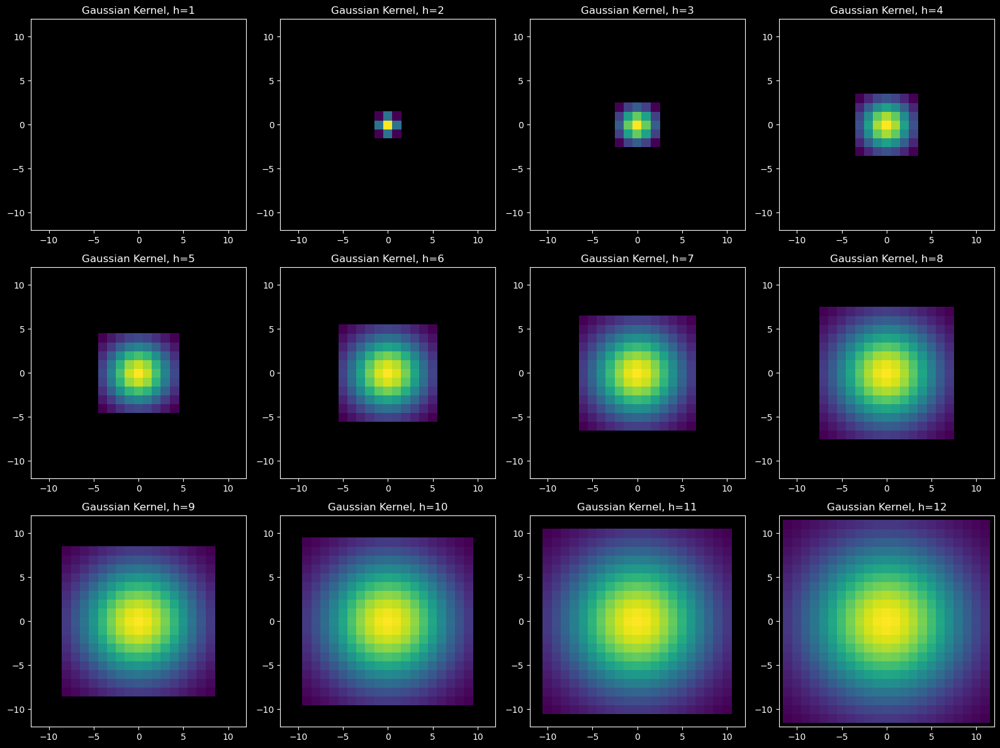

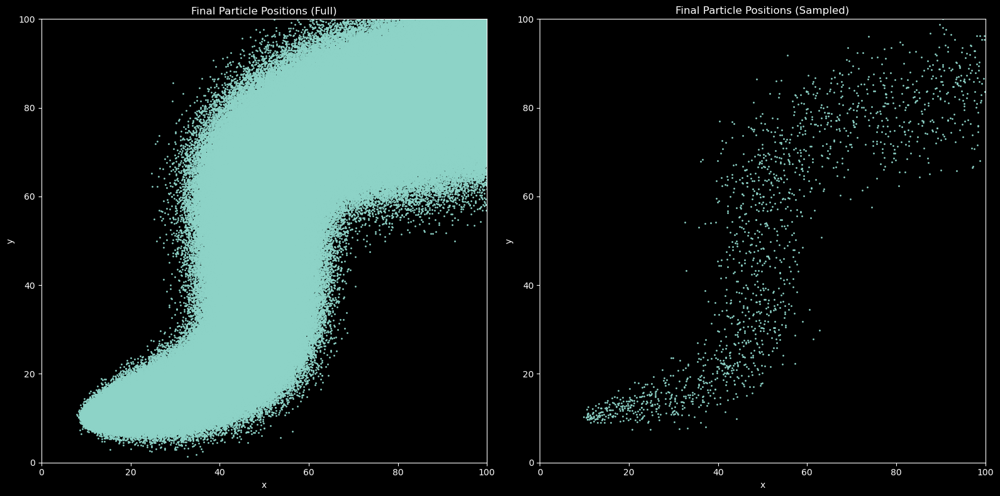

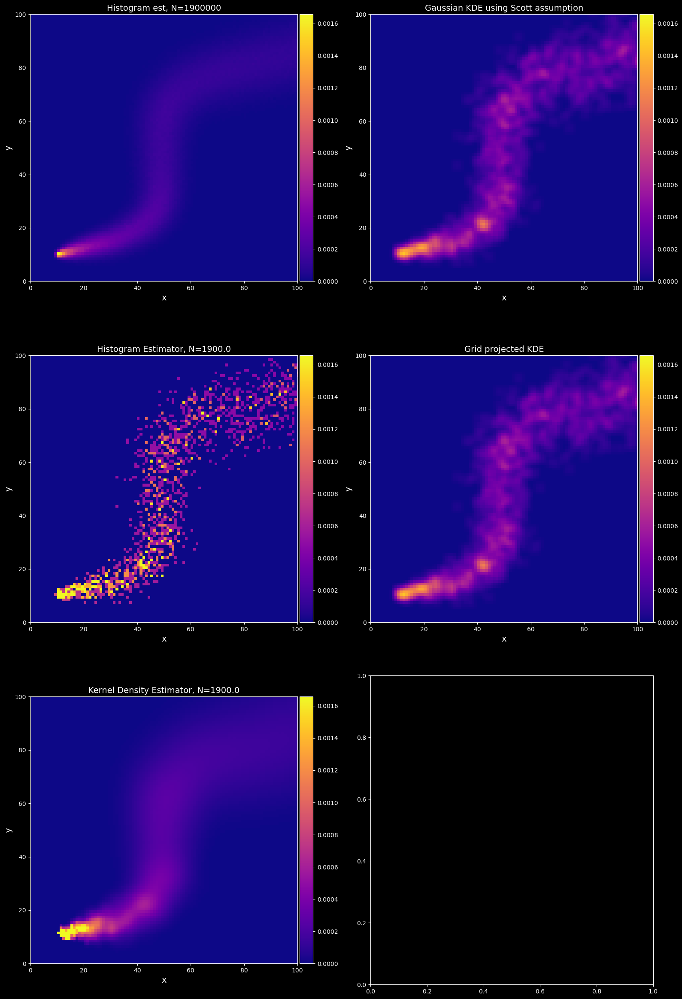

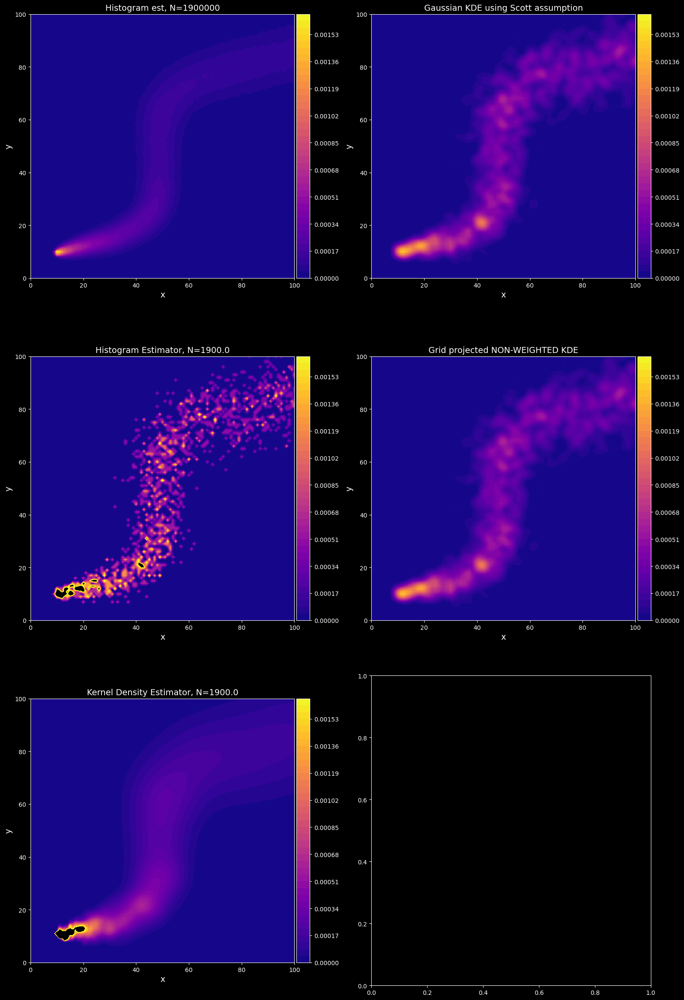

Summed differences between the two estimators
Difference, histogram estimator
1.0246874753687785
Difference, kernel density estimator
0.6374477822414137
Difference, grid projected KDE
0.6418817474063695


In [62]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True)
def histogram_estimator(particles, grid_size,weights = None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''



    # Create a 2D histogram of particle positions
    particle_count = np.zeros((grid_size, grid_size))
    total_weight = np.zeros((grid_size, grid_size))
    for i in range(len(particles)):
        x, y = particles[i,:]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[x, y] += 1*weights[i]
        particle_count[x,y] += 1

    particle_count = particle_count.T
    total_weight = total_weight.T

    return total_weight,particle_count


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw = bw[::frac_diff]
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

#First, calculate Gaussian kernels for h = 1,2,3,4,5,6,7,8,9,10,11,12

del_grid = x_grid[1]-x_grid[0]

gaussian_kernels = []
gaussian_kernels.append(np.array([[1]]))
num_ker = 12 #The number of kernels to calculate
bandwidths_h = np.zeros(num_ker) #Array to store the bandwidth ranges associated with each kernel
#
kernel_origin = []
kernel_origin.append(np.array([0,0]))
for i in range(1,12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    a = a.reshape(-1,1)
    b = b.reshape(1,-1)
    #2 times the standard deviation 
    h = i*(del_grid*0.5)+0.5*del_grid
    #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
    kernel_matrix = ((1/(2*np.pi*h**2))*np.exp(-0.5*((a/h)**2+(b/h)**2))/np.sum(((1/(2*np.pi*h*h))*np.exp(-0.5*((a/h)**2+(b/h)**2)))))
    gaussian_kernels.append(kernel_matrix)
    bandwidths_h[i] = h #can use just find nearest value here.
    kernel_origin.append(np.array([0,0]))
    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################

# Initialize the result matrix
A = np.zeros((grid_size, grid_size))

kernel_dim = 2 #The half width dimension of the kernels in grid cells (also sets h = kernel_dim*0.5)

# Iterate over the grid points
for i in range(grid_size):
    for j in range(grid_size):
        # Determine the kernel size
        kernel_size = len(gaussian_kernels[kernel_dim]) // 2
        kernel = gaussian_kernels[kernel_dim]
        # Define the window boundaries
        i_min = (i - kernel_size)
        i_max = (i + kernel_size + 1)
        j_min = (j - kernel_size)
        j_max = (j + kernel_size + 1)
           
        #Mirror the kernel if the kernel goes outside the grid
        # crop the kernel and mirror the part that leaked out of the grid
        if i_min < 0:
            #add the leaked mass to the edge of the kernel
            kernel[-i_min:-i_min-i_min] + np.flipud(kernel[0:-i_min])
            #crop the kernel by distance i_min:0
            kernel = kernel[-i_min:]  
            i_min = 0          
        if i_max > grid_size:
            kernel[:i_max-grid_size] + np.flipud(kernel[-i_max+grid_size:])
            kernel = kernel[:grid_size-i_max]
            i_max = grid_size
        if j_min < 0:
            kernel[:,-j_min:-j_min-j_min] + np.fliplr(kernel[:,0:-j_min])
            kernel = kernel[:,-j_min:]
            j_min = 0
        if j_max > grid_size:
            kernel[:,:j_max-grid_size] + np.fliplr(kernel[:,-j_max+grid_size:])
            kernel = kernel[:,:grid_size-j_max]
            j_max = grid_size
        # Calculate the weighted kernel

        weighted_kernel = kernel * counts[i, j]
        # Add the contribution to the result matrix
        A[i_min:i_max, j_min:j_max] += weighted_kernel

# Normalize the result matrix
A = A / np.sum(A)

############################################################
##### GRID PROJECTED ADAPTIVE KERNEL DENSITY ESTIMATOR #####
############################################################

#We have already precomputed a pilot kde estimate using an initial h = 1.5.

def calculate_n_u(grid_size, kde_pilot, gaussian_kernels, sigma_u=3*1.5):
    
    n_u = np.zeros((grid_size, grid_size))
    
    #Sigma_u the bandwidth gives the size of the gaussian kernels to be used
    kernel_index = np.argmin(np.abs(bandwidths_h-sigma_u))
    #choose kernel
    kernel_size = len(gaussian_kernels[kernel_index]) // 2
    kernel = gaussian_kernels[kernel_index]

    for i in range(grid_size):
        for j in range(grid_size):
            # Define the window boundaries
            i_min = i - kernel_size
            i_max = i + kernel_size + 1
            j_min = j - kernel_size
            j_max = j + kernel_size + 1

            kernel = gaussian_kernels[kernel_index]

            # Mirror the kernel if the kernel goes outside the grid
            if i_min < 0:
                kernel[-i_min:(-i_min-i_min)] += np.flipud(kernel[0:-i_min])
                kernel = kernel[-i_min:]
                i_min = 0
            if i_max > grid_size:
                kernel[:i_max-grid_size] += np.flipud(kernel[-i_max+grid_size:])
                kernel = kernel[:grid_size-i_max]
                i_max = grid_size
            if j_min < 0:
                kernel[:, -j_min:-j_min-j_min] += np.fliplr(kernel[:, 0:-j_min])
                kernel = kernel[:, -j_min:]
                j_min = 0
            if j_max > grid_size:
                kernel[:, :j_max-grid_size] += np.fliplr(kernel[:, -j_max+grid_size:])
                kernel = kernel[:, :grid_size-j_max]
                j_max = grid_size

            # Calculate the weighted kernel
            weighted_kernel = kernel * kde_pilot[i, j]
            # Add the contribution to the result matrix
            n_u[i_min:i_max, j_min:j_max] += weighted_kernel

    return n_u

# Example usage
grid_size = 100  # Example grid size
kde_pilot = A  

n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)

#####################################################
#####################################################
#####################################################
#################### PLOTTING #######################
#####################################################
#####################################################
#####################################################

if plotting == True:
    #stop the script here

    ##########################################################################
    # Create a 1x2 subplot of all the particles in the full and test dataset #
    ##########################################################################

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Plot final particle positions for trajectories_full
    axes[0].scatter(trajectories_full[:,0], trajectories_full[:,1], s=1)
    axes[0].set_xlim(0, grid_size_plot)
    axes[0].set_ylim(0, grid_size_plot)
    axes[0].set_title('Final Particle Positions (Full)')
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # Plot final particle positions for trajectories
    axes[1].scatter(trajectories[:,0], trajectories[:,1], s=1)
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    axes[1].set_title('Final Particle Positions (Sampled)')
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    plt.tight_layout()
    plt.show()

    ########################################################
    ### Create 2x3 color plots with data and differences ###
    ########################################################

    # Set font size
    font_size = 14
    # Create a 3x2 subplot
    fig, axes = plt.subplots(3, 2, figsize=(16, 24))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [ground_truth, histogram_estimator_est, kernel_density_estimator_est]
    titles = ['Histogram est, N='+str(num_particles), 
            'Histogram Estimator, N='+str(num_particles/frac_diff), 
            'Kernel Density Estimator, N='+str(num_particles/frac_diff)]
    colormap = 'plasma'

    #Get color limits from the ground_truth matrix
    vmin = np.min(ground_truth)
    vmax = np.max(ground_truth)

    for ax, matrix, title in zip(axes[::2], matrices, titles):
        im = ax.pcolor(matrix, cmap=colormap,vmin=vmin,vmax=vmax)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    #Plot the Z matrix (the default gaussian_kde solution) in the upper right hand side plot
    #using the same plotting routine as above
    im = axes[1].pcolor(kde_pilot, cmap=colormap,vmin=vmin,vmax=vmax)
    axes[1].set_title('Gaussian KDE using Scott assumption', fontsize=font_size)
    axes[1].set_xlabel('x', fontsize=font_size)
    axes[1].set_ylabel('y', fontsize=font_size)
    axes[1].axis('square')
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #Plot the grid projected kernel density estimate in the middle right figure

    im = axes[3].pcolor(A, cmap=colormap,vmin=vmin,vmax=vmax)
    axes[3].set_title('Grid projected KDE', fontsize=font_size)
    axes[3].set_xlabel('x', fontsize=font_size)
    axes[3].set_ylabel('y', fontsize=font_size)
    axes[3].axis('square')
    axes[3].set_xlim(0, grid_size_plot)
    axes[3].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #



    '''
    # Plot the differences in the second column
    diff_matrices = [np.abs(ground_truth - histogram_estimator_est), np.abs(ground_truth - kernel_density_estimator_est)]
    diff_titles = ['Difference Histogram Estimator', 'Difference Kernel Density Estimator']

    for ax, matrix, title in zip(axes[3::2], diff_matrices, diff_titles):
        im = ax.pcolor(matrix, cmap=colormap)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    '''

    plt.tight_layout()
    plt.show()

    # Set font size
    font_size = 14
    # Create a 3x2 subplot
    fig, axes = plt.subplots(3, 2, figsize=(16, 24))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [ground_truth, histogram_estimator_est, kernel_density_estimator_est]
    titles = ['Histogram est, N='+str(num_particles), 
            'Histogram Estimator, N='+str(num_particles/frac_diff), 
            'Kernel Density Estimator, N='+str(num_particles/frac_diff)]
    colormap = 'plasma'
    # Get color limits from the ground_truth matrix
    vmin = np.min(ground_truth)
    vmax = np.max(ground_truth)
    # Get color limits for the difference matrices
    diff_vmin = min(np.min(np.abs(ground_truth - histogram_estimator_est)), np.min(np.abs(ground_truth - kernel_density_estimator_est)))
    diff_vmax = max(np.max(np.abs(ground_truth - histogram_estimator_est)), np.max(np.abs(ground_truth - kernel_density_estimator_est)))
    levels = np.linspace(vmin, vmax, 40)
    for ax, matrix, title in zip(axes[::2], matrices, titles):
        im = ax.contourf(matrix, cmap=colormap, levels=levels)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    #Plot the Z matrix (the default gaussian_kde solution) in the upper right hand side plot
    #using the same plotting routine as above
    im = axes[1].contourf(kde_pilot, cmap=colormap, levels=levels)
    axes[1].set_title('Gaussian KDE using Scott assumption', fontsize=font_size)
    axes[1].set_xlabel('x', fontsize=font_size)
    axes[1].set_ylabel('y', fontsize=font_size)
    axes[1].axis('square')
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #Plot the grid projected kernel density estimate in the middle right figure
    im = axes[3].contourf(A, cmap=colormap, levels=levels)
    axes[3].set_title('Grid projected NON-WEIGHTED KDE', fontsize=font_size)
    axes[3].set_xlabel('x', fontsize=font_size)
    axes[3].set_ylabel('y', fontsize=font_size)
    axes[3].axis('square')
    axes[3].set_xlim(0, grid_size_plot)
    axes[3].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)


    '''
    # Plot the differences in the second column
    diff_matrices = [np.abs(ground_truth - histogram_estimator_est), np.abs(ground_truth - kernel_density_estimator_est)]
    diff_titles = ['Difference Histogram Estimator', 'Difference Kernel Density Estimator']

    for ax, matrix, title in zip(axes[3::2], diff_matrices, diff_titles):
        im = ax.contourf(matrix, cmap=colormap, vmin=diff_vmin, vmax=diff_vmax)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    '''

    plt.tight_layout()
    plt.show()
    #print the summed differences
    print('Summed differences between the two estimators')
    print('Difference, histogram estimator')
    print(np.sum(np.abs(ground_truth - histogram_estimator_est)))
    print('Difference, kernel density estimator')
    print(np.sum(np.abs(ground_truth - kernel_density_estimator_est)))
    print('Difference, grid projected KDE')
    print(np.sum(np.abs(ground_truth - A)))



In [63]:
histogram_estimator(trajectories, grid_size,weights=weights_test)[1]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

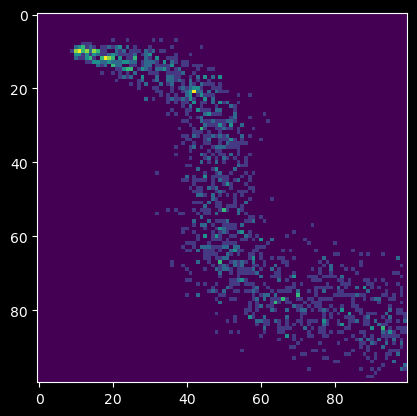

In [64]:
plt.imshow(histogram_estimator(trajectories, grid_size,weights=weights_test)[1])

In [65]:
np.shape(trajectories)

(1900, 2)

In [66]:
np.shape(trajectories_full)

(1900000, 2)

In [67]:

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectorie_fulls[:,0],trajectories_full[:,1],x_grid,y_grid,bw,weights_test)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_full, grid_size,weights=weights_test)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)



NameError: name 'trajectorie_fulls' is not defined

In [68]:
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectorie_full[:,0],trajectories_full[:,1],x_grid,y_grid,bw,weights_test)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_full, grid_size,weights=weights_test)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)



NameError: name 'trajectorie_full' is not defined

In [69]:
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_full[:,0],trajectories_full[:,1],x_grid,y_grid,bw,weights_test)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_full, grid_size,weights=weights_test)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)



<ipython-input-62-ace066d4f983>:124: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


IndexError: index 1900 is out of bounds for axis 0 with size 1900

In [70]:
np.shape(bw)

(1900,)

<ipython-input-71-376cf6c31f55>:124: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


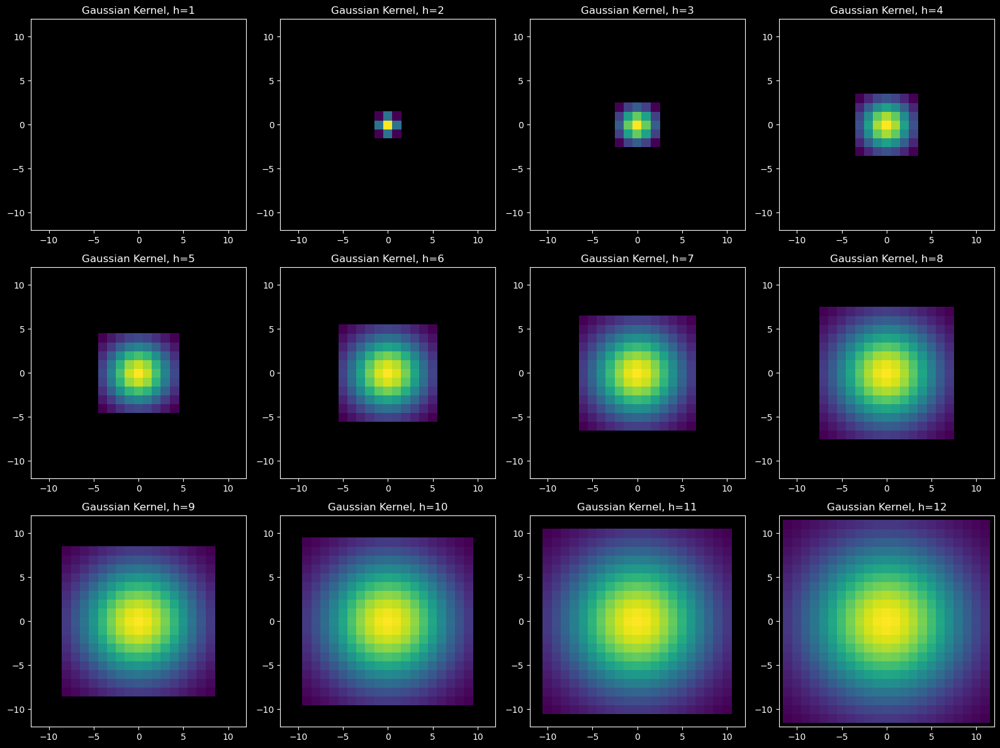

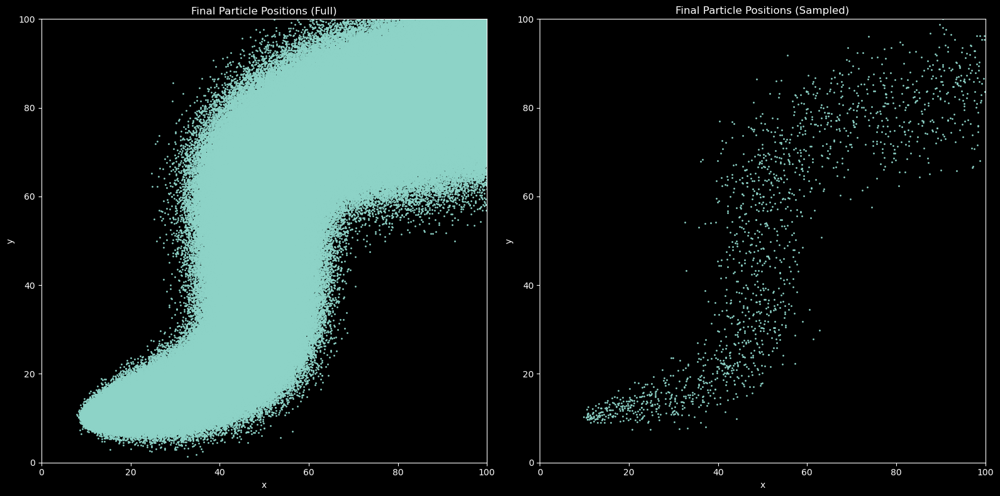

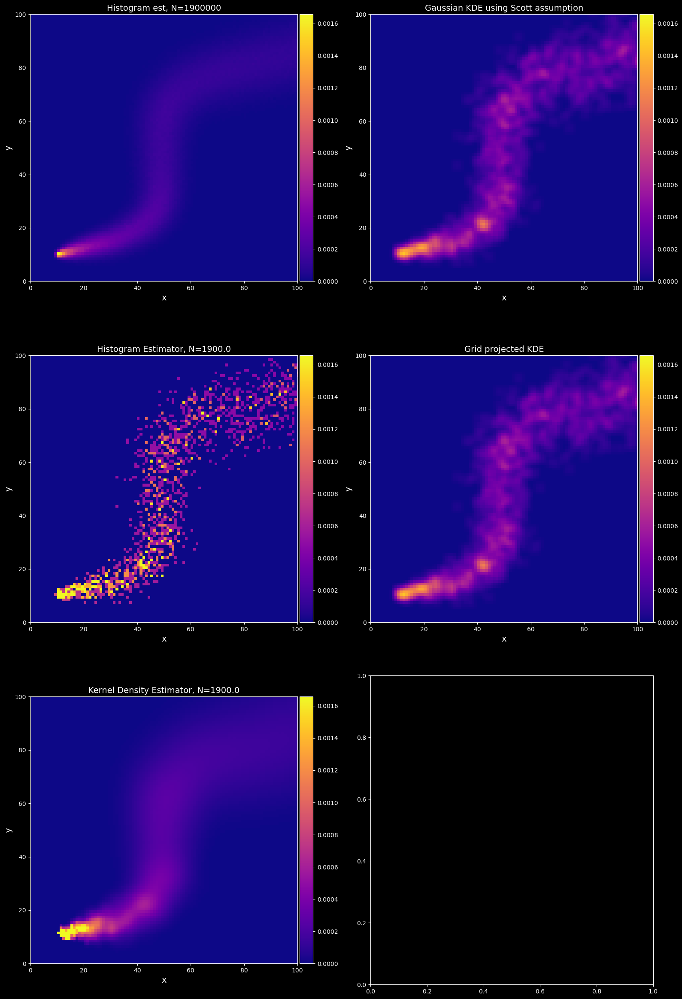

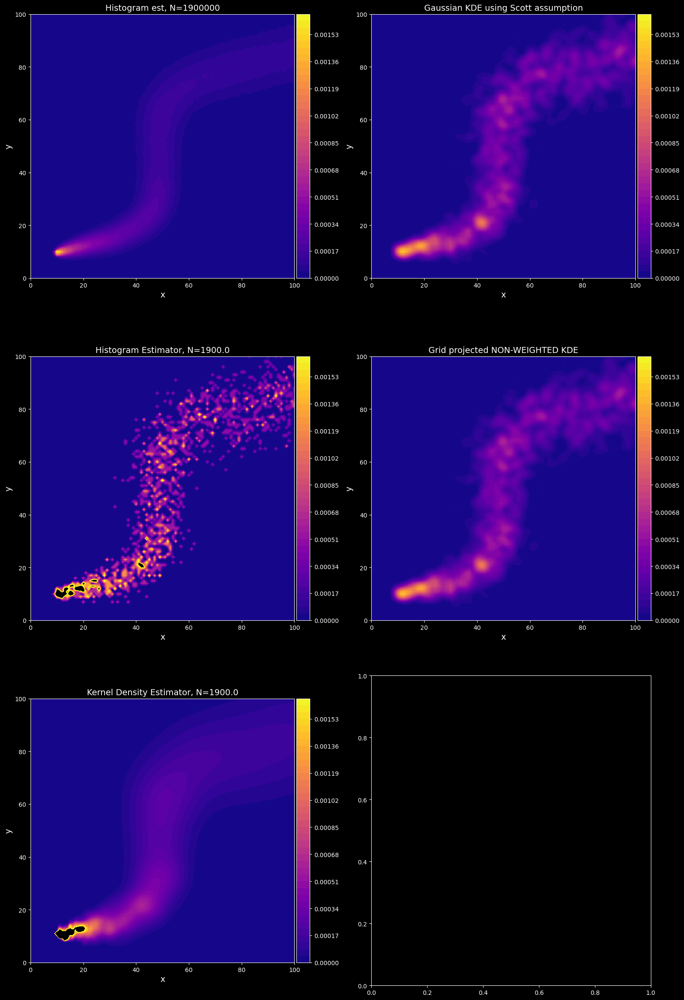

Summed differences between the two estimators
Difference, histogram estimator
1.0246874753687785
Difference, kernel density estimator
0.6374477822414137
Difference, grid projected KDE
0.6418817474063695


<ipython-input-71-376cf6c31f55>:124: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


IndexError: index 1900 is out of bounds for axis 0 with size 1900

In [71]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True)
def histogram_estimator(particles, grid_size,weights = None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''



    # Create a 2D histogram of particle positions
    particle_count = np.zeros((grid_size, grid_size))
    total_weight = np.zeros((grid_size, grid_size))
    for i in range(len(particles)):
        x, y = particles[i,:]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[x, y] += 1*weights[i]
        particle_count[x,y] += 1

    particle_count = particle_count.T
    total_weight = total_weight.T

    return total_weight,particle_count


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw_full = bw
bw = bw[::frac_diff]
weights_full = np.ones(len(bw_full))
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

#First, calculate Gaussian kernels for h = 1,2,3,4,5,6,7,8,9,10,11,12

del_grid = x_grid[1]-x_grid[0]

gaussian_kernels = []
gaussian_kernels.append(np.array([[1]]))
num_ker = 12 #The number of kernels to calculate
bandwidths_h = np.zeros(num_ker) #Array to store the bandwidth ranges associated with each kernel
#
kernel_origin = []
kernel_origin.append(np.array([0,0]))
for i in range(1,12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    a = a.reshape(-1,1)
    b = b.reshape(1,-1)
    #2 times the standard deviation 
    h = i*(del_grid*0.5)+0.5*del_grid
    #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
    kernel_matrix = ((1/(2*np.pi*h**2))*np.exp(-0.5*((a/h)**2+(b/h)**2))/np.sum(((1/(2*np.pi*h*h))*np.exp(-0.5*((a/h)**2+(b/h)**2)))))
    gaussian_kernels.append(kernel_matrix)
    bandwidths_h[i] = h #can use just find nearest value here.
    kernel_origin.append(np.array([0,0]))
    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################

# Initialize the result matrix
A = np.zeros((grid_size, grid_size))

kernel_dim = 2 #The half width dimension of the kernels in grid cells (also sets h = kernel_dim*0.5)

# Iterate over the grid points
for i in range(grid_size):
    for j in range(grid_size):
        # Determine the kernel size
        kernel_size = len(gaussian_kernels[kernel_dim]) // 2
        kernel = gaussian_kernels[kernel_dim]
        # Define the window boundaries
        i_min = (i - kernel_size)
        i_max = (i + kernel_size + 1)
        j_min = (j - kernel_size)
        j_max = (j + kernel_size + 1)
           
        #Mirror the kernel if the kernel goes outside the grid
        # crop the kernel and mirror the part that leaked out of the grid
        if i_min < 0:
            #add the leaked mass to the edge of the kernel
            kernel[-i_min:-i_min-i_min] + np.flipud(kernel[0:-i_min])
            #crop the kernel by distance i_min:0
            kernel = kernel[-i_min:]  
            i_min = 0          
        if i_max > grid_size:
            kernel[:i_max-grid_size] + np.flipud(kernel[-i_max+grid_size:])
            kernel = kernel[:grid_size-i_max]
            i_max = grid_size
        if j_min < 0:
            kernel[:,-j_min:-j_min-j_min] + np.fliplr(kernel[:,0:-j_min])
            kernel = kernel[:,-j_min:]
            j_min = 0
        if j_max > grid_size:
            kernel[:,:j_max-grid_size] + np.fliplr(kernel[:,-j_max+grid_size:])
            kernel = kernel[:,:grid_size-j_max]
            j_max = grid_size
        # Calculate the weighted kernel

        weighted_kernel = kernel * counts[i, j]
        # Add the contribution to the result matrix
        A[i_min:i_max, j_min:j_max] += weighted_kernel

# Normalize the result matrix
A = A / np.sum(A)

############################################################
##### GRID PROJECTED ADAPTIVE KERNEL DENSITY ESTIMATOR #####
############################################################

#We have already precomputed a pilot kde estimate using an initial h = 1.5.

def calculate_n_u(grid_size, kde_pilot, gaussian_kernels, sigma_u=3*1.5):
    
    n_u = np.zeros((grid_size, grid_size))
    
    #Sigma_u the bandwidth gives the size of the gaussian kernels to be used
    kernel_index = np.argmin(np.abs(bandwidths_h-sigma_u))
    #choose kernel
    kernel_size = len(gaussian_kernels[kernel_index]) // 2
    kernel = gaussian_kernels[kernel_index]

    for i in range(grid_size):
        for j in range(grid_size):
            # Define the window boundaries
            i_min = i - kernel_size
            i_max = i + kernel_size + 1
            j_min = j - kernel_size
            j_max = j + kernel_size + 1

            kernel = gaussian_kernels[kernel_index]

            # Mirror the kernel if the kernel goes outside the grid
            if i_min < 0:
                kernel[-i_min:(-i_min-i_min)] += np.flipud(kernel[0:-i_min])
                kernel = kernel[-i_min:]
                i_min = 0
            if i_max > grid_size:
                kernel[:i_max-grid_size] += np.flipud(kernel[-i_max+grid_size:])
                kernel = kernel[:grid_size-i_max]
                i_max = grid_size
            if j_min < 0:
                kernel[:, -j_min:-j_min-j_min] += np.fliplr(kernel[:, 0:-j_min])
                kernel = kernel[:, -j_min:]
                j_min = 0
            if j_max > grid_size:
                kernel[:, :j_max-grid_size] += np.fliplr(kernel[:, -j_max+grid_size:])
                kernel = kernel[:, :grid_size-j_max]
                j_max = grid_size

            # Calculate the weighted kernel
            weighted_kernel = kernel * kde_pilot[i, j]
            # Add the contribution to the result matrix
            n_u[i_min:i_max, j_min:j_max] += weighted_kernel

    return n_u

# Example usage
grid_size = 100  # Example grid size
kde_pilot = A  

n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)

#####################################################
#####################################################
#####################################################
#################### PLOTTING #######################
#####################################################
#####################################################
#####################################################

if plotting == True:
    #stop the script here

    ##########################################################################
    # Create a 1x2 subplot of all the particles in the full and test dataset #
    ##########################################################################

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Plot final particle positions for trajectories_full
    axes[0].scatter(trajectories_full[:,0], trajectories_full[:,1], s=1)
    axes[0].set_xlim(0, grid_size_plot)
    axes[0].set_ylim(0, grid_size_plot)
    axes[0].set_title('Final Particle Positions (Full)')
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # Plot final particle positions for trajectories
    axes[1].scatter(trajectories[:,0], trajectories[:,1], s=1)
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    axes[1].set_title('Final Particle Positions (Sampled)')
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    plt.tight_layout()
    plt.show()

    ########################################################
    ### Create 2x3 color plots with data and differences ###
    ########################################################

    # Set font size
    font_size = 14
    # Create a 3x2 subplot
    fig, axes = plt.subplots(3, 2, figsize=(16, 24))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [ground_truth, histogram_estimator_est, kernel_density_estimator_est]
    titles = ['Histogram est, N='+str(num_particles), 
            'Histogram Estimator, N='+str(num_particles/frac_diff), 
            'Kernel Density Estimator, N='+str(num_particles/frac_diff)]
    colormap = 'plasma'

    #Get color limits from the ground_truth matrix
    vmin = np.min(ground_truth)
    vmax = np.max(ground_truth)

    for ax, matrix, title in zip(axes[::2], matrices, titles):
        im = ax.pcolor(matrix, cmap=colormap,vmin=vmin,vmax=vmax)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    #Plot the Z matrix (the default gaussian_kde solution) in the upper right hand side plot
    #using the same plotting routine as above
    im = axes[1].pcolor(kde_pilot, cmap=colormap,vmin=vmin,vmax=vmax)
    axes[1].set_title('Gaussian KDE using Scott assumption', fontsize=font_size)
    axes[1].set_xlabel('x', fontsize=font_size)
    axes[1].set_ylabel('y', fontsize=font_size)
    axes[1].axis('square')
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #Plot the grid projected kernel density estimate in the middle right figure

    im = axes[3].pcolor(A, cmap=colormap,vmin=vmin,vmax=vmax)
    axes[3].set_title('Grid projected KDE', fontsize=font_size)
    axes[3].set_xlabel('x', fontsize=font_size)
    axes[3].set_ylabel('y', fontsize=font_size)
    axes[3].axis('square')
    axes[3].set_xlim(0, grid_size_plot)
    axes[3].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #



    '''
    # Plot the differences in the second column
    diff_matrices = [np.abs(ground_truth - histogram_estimator_est), np.abs(ground_truth - kernel_density_estimator_est)]
    diff_titles = ['Difference Histogram Estimator', 'Difference Kernel Density Estimator']

    for ax, matrix, title in zip(axes[3::2], diff_matrices, diff_titles):
        im = ax.pcolor(matrix, cmap=colormap)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    '''

    plt.tight_layout()
    plt.show()

    # Set font size
    font_size = 14
    # Create a 3x2 subplot
    fig, axes = plt.subplots(3, 2, figsize=(16, 24))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [ground_truth, histogram_estimator_est, kernel_density_estimator_est]
    titles = ['Histogram est, N='+str(num_particles), 
            'Histogram Estimator, N='+str(num_particles/frac_diff), 
            'Kernel Density Estimator, N='+str(num_particles/frac_diff)]
    colormap = 'plasma'
    # Get color limits from the ground_truth matrix
    vmin = np.min(ground_truth)
    vmax = np.max(ground_truth)
    # Get color limits for the difference matrices
    diff_vmin = min(np.min(np.abs(ground_truth - histogram_estimator_est)), np.min(np.abs(ground_truth - kernel_density_estimator_est)))
    diff_vmax = max(np.max(np.abs(ground_truth - histogram_estimator_est)), np.max(np.abs(ground_truth - kernel_density_estimator_est)))
    levels = np.linspace(vmin, vmax, 40)
    for ax, matrix, title in zip(axes[::2], matrices, titles):
        im = ax.contourf(matrix, cmap=colormap, levels=levels)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    #Plot the Z matrix (the default gaussian_kde solution) in the upper right hand side plot
    #using the same plotting routine as above
    im = axes[1].contourf(kde_pilot, cmap=colormap, levels=levels)
    axes[1].set_title('Gaussian KDE using Scott assumption', fontsize=font_size)
    axes[1].set_xlabel('x', fontsize=font_size)
    axes[1].set_ylabel('y', fontsize=font_size)
    axes[1].axis('square')
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #Plot the grid projected kernel density estimate in the middle right figure
    im = axes[3].contourf(A, cmap=colormap, levels=levels)
    axes[3].set_title('Grid projected NON-WEIGHTED KDE', fontsize=font_size)
    axes[3].set_xlabel('x', fontsize=font_size)
    axes[3].set_ylabel('y', fontsize=font_size)
    axes[3].axis('square')
    axes[3].set_xlim(0, grid_size_plot)
    axes[3].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)


    '''
    # Plot the differences in the second column
    diff_matrices = [np.abs(ground_truth - histogram_estimator_est), np.abs(ground_truth - kernel_density_estimator_est)]
    diff_titles = ['Difference Histogram Estimator', 'Difference Kernel Density Estimator']

    for ax, matrix, title in zip(axes[3::2], diff_matrices, diff_titles):
        im = ax.contourf(matrix, cmap=colormap, vmin=diff_vmin, vmax=diff_vmax)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    '''

    plt.tight_layout()
    plt.show()
    #print the summed differences
    print('Summed differences between the two estimators')
    print('Difference, histogram estimator')
    print(np.sum(np.abs(ground_truth - histogram_estimator_est)))
    print('Difference, kernel density estimator')
    print(np.sum(np.abs(ground_truth - kernel_density_estimator_est)))
    print('Difference, grid projected KDE')
    print(np.sum(np.abs(ground_truth - A)))

    ###############
    #TEST WHAT'S FASTEST GRID PROJECTED VS kernel_matrix_2d_NOFLAT

    #Create a bw v

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_full[:,0],trajectories_full[:,1],x_grid,y_grid,bw,weights_test)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_full, grid_size,weights=weights_test)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)





In [72]:

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_full[:,0],trajectories_full[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_full, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)



KeyboardInterrupt: 

In [73]:

    #Create a bw v
    trajectories_test = trajectories[::1000]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)



Time for kernel_matrix_2d_NOFLAT
0.0058176517486572266
Time for grid projected KDE
1.0943934917449951


In [74]:

    #Create a bw v
    trajectories_test = trajectories[::100]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)




Time for kernel_matrix_2d_NOFLAT
0.1016683578491211
Time for grid projected KDE
0.1605849266052246


In [75]:

    #Create a bw v
    trajectories_test = trajectories[::10]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)



Time for kernel_matrix_2d_NOFLAT
0.4661571979522705
Time for grid projected KDE
0.07819104194641113


In [77]:
    #Create a bw v
    trajectories_test = trajectories_full[::1000]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)





Time for kernel_matrix_2d_NOFLAT
4.874612092971802
Time for grid projected KDE
0.09587526321411133


In [78]:

    #Create a bw v
    trajectories_test = trajectories_full[::100]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)


Time for kernel_matrix_2d_NOFLAT
45.917105197906494
Time for grid projected KDE
0.09781789779663086


<ipython-input-79-aedf7b226252>:124: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


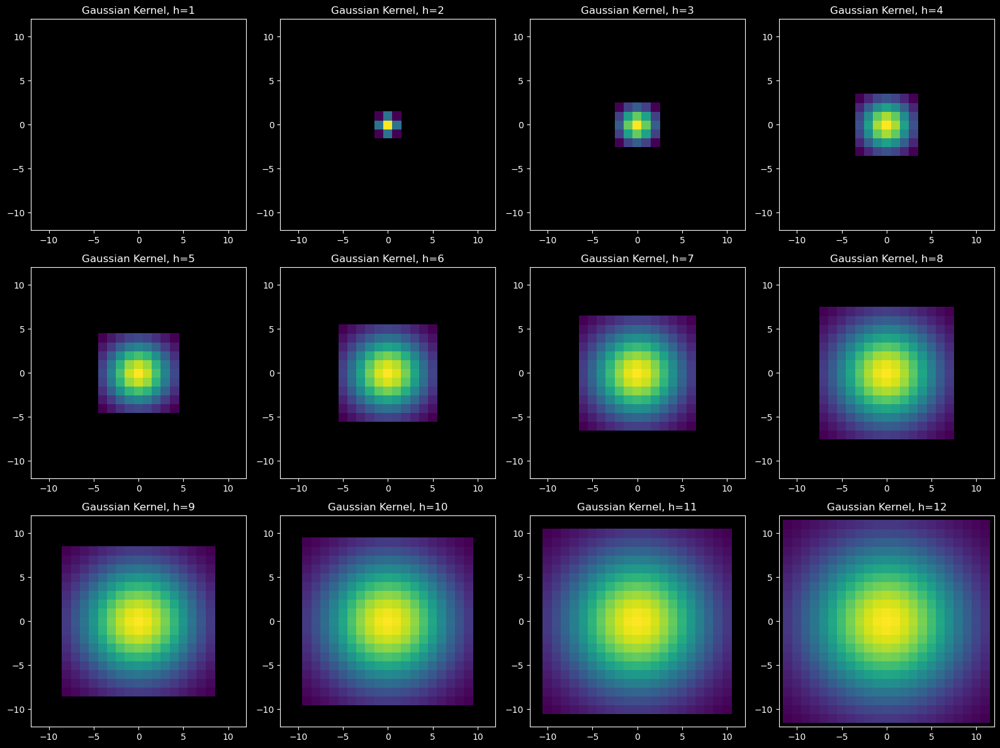

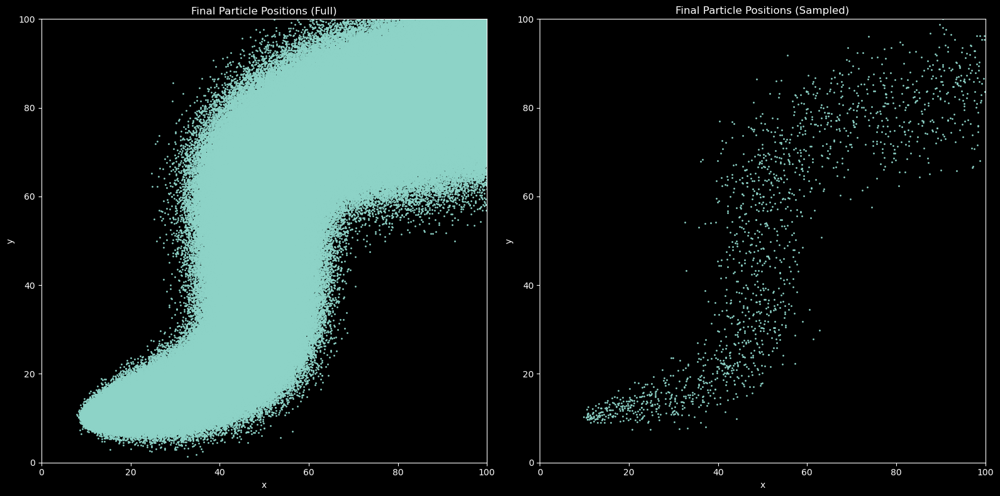

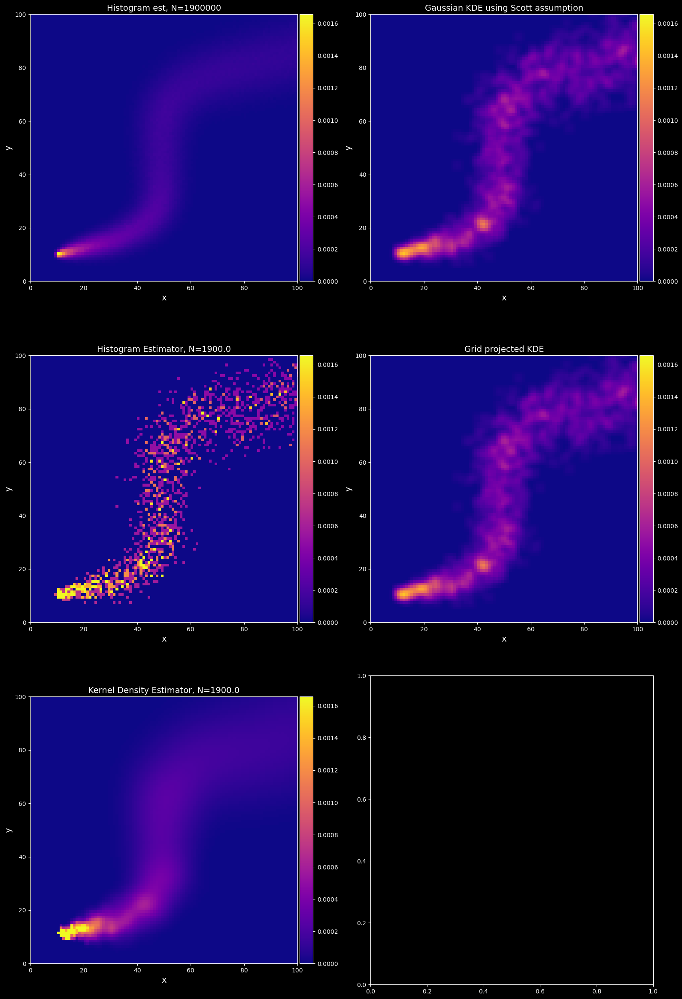

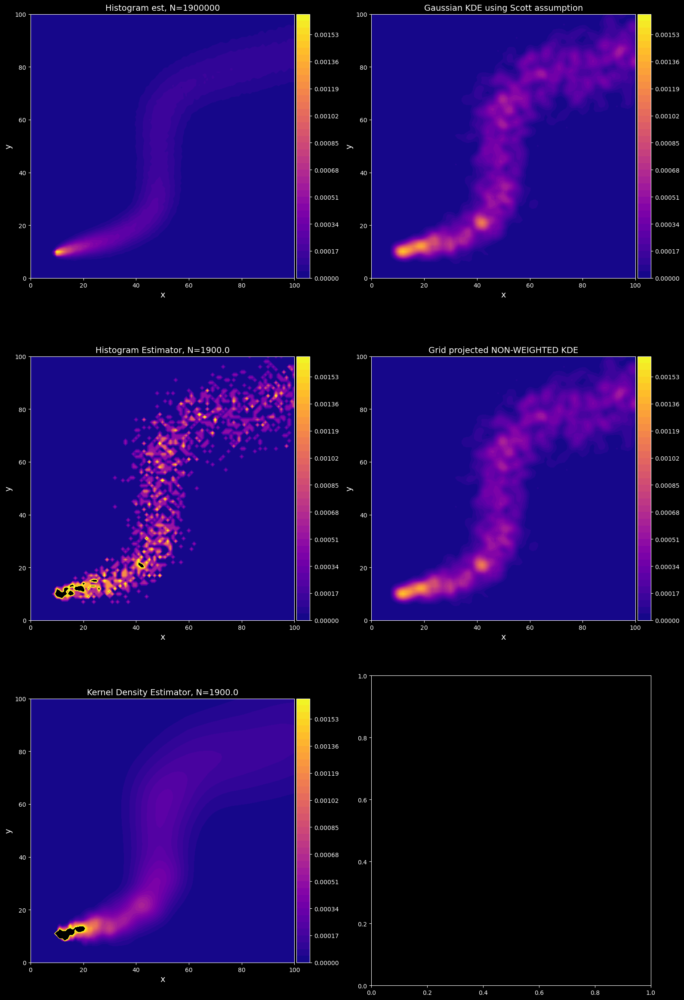

Summed differences between the two estimators
Difference, histogram estimator
1.0248093658100474
Difference, kernel density estimator
0.6378960385121714
Difference, grid projected KDE
0.6423303475263676
Time for kernel_matrix_2d_NOFLAT
32.116435289382935
Time for grid projected KDE
1.9186806678771973


In [79]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True, nopython=True)
def histogram_estimator(particles, grid_size, weights=None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''
    # Initialize the histograms
    particle_count = np.zeros((grid_size, grid_size), dtype=np.int32)
    total_weight = np.zeros((grid_size, grid_size), dtype=np.float64)
    
    # Check if weights are provided
    if weights is None:
        weights = np.ones(len(particles), dtype=np.float64)
    
    # Create a 2D histogram of particle positions
    for i in numba.prange(len(particles)):
        x, y = particles[i, :]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[y, x] += weights[i]
        particle_count[y, x] += 1

    return total_weight, particle_count


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw_full = bw
bw = bw[::frac_diff]
weights_full = np.ones(len(bw_full))
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

#First, calculate Gaussian kernels for h = 1,2,3,4,5,6,7,8,9,10,11,12

del_grid = x_grid[1]-x_grid[0]

gaussian_kernels = []
gaussian_kernels.append(np.array([[1]]))
num_ker = 12 #The number of kernels to calculate
bandwidths_h = np.zeros(num_ker) #Array to store the bandwidth ranges associated with each kernel
#
kernel_origin = []
kernel_origin.append(np.array([0,0]))
for i in range(1,12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    a = a.reshape(-1,1)
    b = b.reshape(1,-1)
    #2 times the standard deviation 
    h = i*(del_grid*0.5)+0.5*del_grid
    #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
    kernel_matrix = ((1/(2*np.pi*h**2))*np.exp(-0.5*((a/h)**2+(b/h)**2))/np.sum(((1/(2*np.pi*h*h))*np.exp(-0.5*((a/h)**2+(b/h)**2)))))
    gaussian_kernels.append(kernel_matrix)
    bandwidths_h[i] = h #can use just find nearest value here.
    kernel_origin.append(np.array([0,0]))
    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################

# Initialize the result matrix
A = np.zeros((grid_size, grid_size))

kernel_dim = 2 #The half width dimension of the kernels in grid cells (also sets h = kernel_dim*0.5)

# Iterate over the grid points
for i in range(grid_size):
    for j in range(grid_size):
        # Determine the kernel size
        kernel_size = len(gaussian_kernels[kernel_dim]) // 2
        kernel = gaussian_kernels[kernel_dim]
        # Define the window boundaries
        i_min = (i - kernel_size)
        i_max = (i + kernel_size + 1)
        j_min = (j - kernel_size)
        j_max = (j + kernel_size + 1)
           
        #Mirror the kernel if the kernel goes outside the grid
        # crop the kernel and mirror the part that leaked out of the grid
        if i_min < 0:
            #add the leaked mass to the edge of the kernel
            kernel[-i_min:-i_min-i_min] + np.flipud(kernel[0:-i_min])
            #crop the kernel by distance i_min:0
            kernel = kernel[-i_min:]  
            i_min = 0          
        if i_max > grid_size:
            kernel[:i_max-grid_size] + np.flipud(kernel[-i_max+grid_size:])
            kernel = kernel[:grid_size-i_max]
            i_max = grid_size
        if j_min < 0:
            kernel[:,-j_min:-j_min-j_min] + np.fliplr(kernel[:,0:-j_min])
            kernel = kernel[:,-j_min:]
            j_min = 0
        if j_max > grid_size:
            kernel[:,:j_max-grid_size] + np.fliplr(kernel[:,-j_max+grid_size:])
            kernel = kernel[:,:grid_size-j_max]
            j_max = grid_size
        # Calculate the weighted kernel

        weighted_kernel = kernel * counts[i, j]
        # Add the contribution to the result matrix
        A[i_min:i_max, j_min:j_max] += weighted_kernel

# Normalize the result matrix
A = A / np.sum(A)

############################################################
##### GRID PROJECTED ADAPTIVE KERNEL DENSITY ESTIMATOR #####
############################################################

#We have already precomputed a pilot kde estimate using an initial h = 1.5.

def calculate_n_u(grid_size, kde_pilot, gaussian_kernels, sigma_u=3*1.5):
    
    n_u = np.zeros((grid_size, grid_size))
    
    #Sigma_u the bandwidth gives the size of the gaussian kernels to be used
    kernel_index = np.argmin(np.abs(bandwidths_h-sigma_u))
    #choose kernel
    kernel_size = len(gaussian_kernels[kernel_index]) // 2
    kernel = gaussian_kernels[kernel_index]

    for i in range(grid_size):
        for j in range(grid_size):
            # Define the window boundaries
            i_min = i - kernel_size
            i_max = i + kernel_size + 1
            j_min = j - kernel_size
            j_max = j + kernel_size + 1

            kernel = gaussian_kernels[kernel_index]

            # Mirror the kernel if the kernel goes outside the grid
            if i_min < 0:
                kernel[-i_min:(-i_min-i_min)] += np.flipud(kernel[0:-i_min])
                kernel = kernel[-i_min:]
                i_min = 0
            if i_max > grid_size:
                kernel[:i_max-grid_size] += np.flipud(kernel[-i_max+grid_size:])
                kernel = kernel[:grid_size-i_max]
                i_max = grid_size
            if j_min < 0:
                kernel[:, -j_min:-j_min-j_min] += np.fliplr(kernel[:, 0:-j_min])
                kernel = kernel[:, -j_min:]
                j_min = 0
            if j_max > grid_size:
                kernel[:, :j_max-grid_size] += np.fliplr(kernel[:, -j_max+grid_size:])
                kernel = kernel[:, :grid_size-j_max]
                j_max = grid_size

            # Calculate the weighted kernel
            weighted_kernel = kernel * kde_pilot[i, j]
            # Add the contribution to the result matrix
            n_u[i_min:i_max, j_min:j_max] += weighted_kernel

    return n_u

# Example usage
grid_size = 100  # Example grid size
kde_pilot = A  

n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)

#####################################################
#####################################################
#####################################################
#################### PLOTTING #######################
#####################################################
#####################################################
#####################################################

if plotting == True:
    #stop the script here

    ##########################################################################
    # Create a 1x2 subplot of all the particles in the full and test dataset #
    ##########################################################################

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Plot final particle positions for trajectories_full
    axes[0].scatter(trajectories_full[:,0], trajectories_full[:,1], s=1)
    axes[0].set_xlim(0, grid_size_plot)
    axes[0].set_ylim(0, grid_size_plot)
    axes[0].set_title('Final Particle Positions (Full)')
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # Plot final particle positions for trajectories
    axes[1].scatter(trajectories[:,0], trajectories[:,1], s=1)
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    axes[1].set_title('Final Particle Positions (Sampled)')
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    plt.tight_layout()
    plt.show()

    ########################################################
    ### Create 2x3 color plots with data and differences ###
    ########################################################

    # Set font size
    font_size = 14
    # Create a 3x2 subplot
    fig, axes = plt.subplots(3, 2, figsize=(16, 24))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [ground_truth, histogram_estimator_est, kernel_density_estimator_est]
    titles = ['Histogram est, N='+str(num_particles), 
            'Histogram Estimator, N='+str(num_particles/frac_diff), 
            'Kernel Density Estimator, N='+str(num_particles/frac_diff)]
    colormap = 'plasma'

    #Get color limits from the ground_truth matrix
    vmin = np.min(ground_truth)
    vmax = np.max(ground_truth)

    for ax, matrix, title in zip(axes[::2], matrices, titles):
        im = ax.pcolor(matrix, cmap=colormap,vmin=vmin,vmax=vmax)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    #Plot the Z matrix (the default gaussian_kde solution) in the upper right hand side plot
    #using the same plotting routine as above
    im = axes[1].pcolor(kde_pilot, cmap=colormap,vmin=vmin,vmax=vmax)
    axes[1].set_title('Gaussian KDE using Scott assumption', fontsize=font_size)
    axes[1].set_xlabel('x', fontsize=font_size)
    axes[1].set_ylabel('y', fontsize=font_size)
    axes[1].axis('square')
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #Plot the grid projected kernel density estimate in the middle right figure

    im = axes[3].pcolor(A, cmap=colormap,vmin=vmin,vmax=vmax)
    axes[3].set_title('Grid projected KDE', fontsize=font_size)
    axes[3].set_xlabel('x', fontsize=font_size)
    axes[3].set_ylabel('y', fontsize=font_size)
    axes[3].axis('square')
    axes[3].set_xlim(0, grid_size_plot)
    axes[3].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #



    '''
    # Plot the differences in the second column
    diff_matrices = [np.abs(ground_truth - histogram_estimator_est), np.abs(ground_truth - kernel_density_estimator_est)]
    diff_titles = ['Difference Histogram Estimator', 'Difference Kernel Density Estimator']

    for ax, matrix, title in zip(axes[3::2], diff_matrices, diff_titles):
        im = ax.pcolor(matrix, cmap=colormap)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    '''

    plt.tight_layout()
    plt.show()

    # Set font size
    font_size = 14
    # Create a 3x2 subplot
    fig, axes = plt.subplots(3, 2, figsize=(16, 24))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [ground_truth, histogram_estimator_est, kernel_density_estimator_est]
    titles = ['Histogram est, N='+str(num_particles), 
            'Histogram Estimator, N='+str(num_particles/frac_diff), 
            'Kernel Density Estimator, N='+str(num_particles/frac_diff)]
    colormap = 'plasma'
    # Get color limits from the ground_truth matrix
    vmin = np.min(ground_truth)
    vmax = np.max(ground_truth)
    # Get color limits for the difference matrices
    diff_vmin = min(np.min(np.abs(ground_truth - histogram_estimator_est)), np.min(np.abs(ground_truth - kernel_density_estimator_est)))
    diff_vmax = max(np.max(np.abs(ground_truth - histogram_estimator_est)), np.max(np.abs(ground_truth - kernel_density_estimator_est)))
    levels = np.linspace(vmin, vmax, 40)
    for ax, matrix, title in zip(axes[::2], matrices, titles):
        im = ax.contourf(matrix, cmap=colormap, levels=levels)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    #Plot the Z matrix (the default gaussian_kde solution) in the upper right hand side plot
    #using the same plotting routine as above
    im = axes[1].contourf(kde_pilot, cmap=colormap, levels=levels)
    axes[1].set_title('Gaussian KDE using Scott assumption', fontsize=font_size)
    axes[1].set_xlabel('x', fontsize=font_size)
    axes[1].set_ylabel('y', fontsize=font_size)
    axes[1].axis('square')
    axes[1].set_xlim(0, grid_size_plot)
    axes[1].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

    #Plot the grid projected kernel density estimate in the middle right figure
    im = axes[3].contourf(A, cmap=colormap, levels=levels)
    axes[3].set_title('Grid projected NON-WEIGHTED KDE', fontsize=font_size)
    axes[3].set_xlabel('x', fontsize=font_size)
    axes[3].set_ylabel('y', fontsize=font_size)
    axes[3].axis('square')
    axes[3].set_xlim(0, grid_size_plot)
    axes[3].set_ylim(0, grid_size_plot)
    #and same color range and colorbar
    divider = make_axes_locatable(axes[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)


    '''
    # Plot the differences in the second column
    diff_matrices = [np.abs(ground_truth - histogram_estimator_est), np.abs(ground_truth - kernel_density_estimator_est)]
    diff_titles = ['Difference Histogram Estimator', 'Difference Kernel Density Estimator']

    for ax, matrix, title in zip(axes[3::2], diff_matrices, diff_titles):
        im = ax.contourf(matrix, cmap=colormap, vmin=diff_vmin, vmax=diff_vmax)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    '''

    plt.tight_layout()
    plt.show()
    #print the summed differences
    print('Summed differences between the two estimators')
    print('Difference, histogram estimator')
    print(np.sum(np.abs(ground_truth - histogram_estimator_est)))
    print('Difference, kernel density estimator')
    print(np.sum(np.abs(ground_truth - kernel_density_estimator_est)))
    print('Difference, grid projected KDE')
    print(np.sum(np.abs(ground_truth - A)))

    ###############
    #TEST WHAT'S FASTEST GRID PROJECTED VS kernel_matrix_2d_NOFLAT

    #Create a bw v
    trajectories_test = trajectories_full[::100]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)





Time for kernel_matrix_2d_NOFLAT
322.4647603034973
Time for grid projected KDE
0.10650062561035156


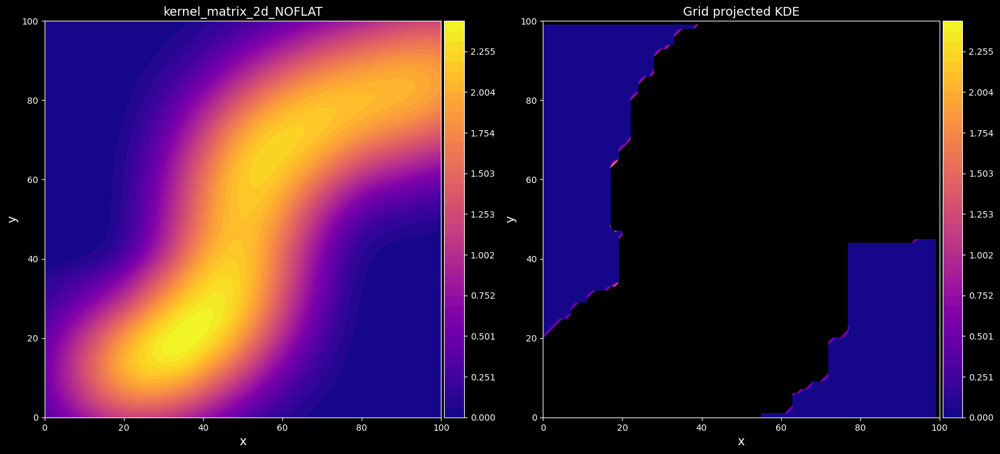

In [80]:

    #Create a bw v
    trajectories_test = trajectories_full[::10]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)

    #Plot to see if they are the same
    # Create a 1x2 subplot
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [kernel_density_estimator_est, n_u]
    titles = ['kernel_matrix_2d_NOFLAT', 'Grid projected KDE']
    colormap = 'plasma'
    # Get color limits from the ground_truth matrix
    vmin = np.min(kernel_density_estimator_est)
    vmax = np.max(kernel_density_estimator_est)
    levels = np.linspace(vmin, vmax, 40)

    for ax, matrix, title in zip(axes, matrices, titles):
        im = ax.contourf(matrix, cmap=colormap, levels=levels)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    
    plt.tight_layout()

    plt.show()


Time for kernel_matrix_2d_NOFLAT
0.5199944972991943
Time for grid projected KDE
0.0975947380065918


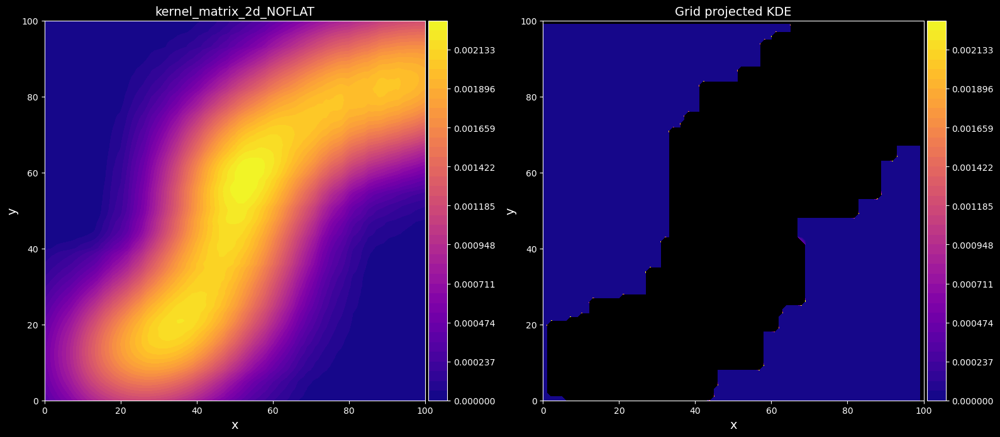

In [81]:

    #Create a bw v
    trajectories_test = trajectories_full[::10000]

    #Test on the big particle dataset
    import time
    start = time.time()
    kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories_test[:,0],trajectories_test[:,1],x_grid,y_grid,bw_full,weights_full)
    kernel_density_estimator_est = kernel_density_estimator_est.T
    end = time.time()

    print('Time for kernel_matrix_2d_NOFLAT')
    print(end-start)

    start = time.time()
    #Precompute the pilot KDE
    kde_pilot = histogram_estimator(trajectories_test, grid_size,weights=weights_full)[1]
    n_u = calculate_n_u(grid_size, kde_pilot, gaussian_kernels)
    end = time.time()

    print('Time for grid projected KDE')
    print(end-start)

    #Plot to see if they are the same
    # Create a 1x2 subplot
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    # Plot each matrix in the first column
    matrices = [kernel_density_estimator_est, n_u]
    titles = ['kernel_matrix_2d_NOFLAT', 'Grid projected KDE']
    colormap = 'plasma'
    # Get color limits from the ground_truth matrix
    vmin = np.min(kernel_density_estimator_est)
    vmax = np.max(kernel_density_estimator_est)
    levels = np.linspace(vmin, vmax, 40)

    for ax, matrix, title in zip(axes, matrices, titles):
        im = ax.contourf(matrix, cmap=colormap, levels=levels)
        ax.set_title(title, fontsize=font_size)
        ax.set_xlabel('x', fontsize=font_size)
        ax.set_ylabel('y', fontsize=font_size)
        ax.axis('square')
        ax.set_xlim(0, grid_size_plot)
        ax.set_ylim(0, grid_size_plot)
        
        # Create a colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    
    plt.tight_layout()

    plt.show()





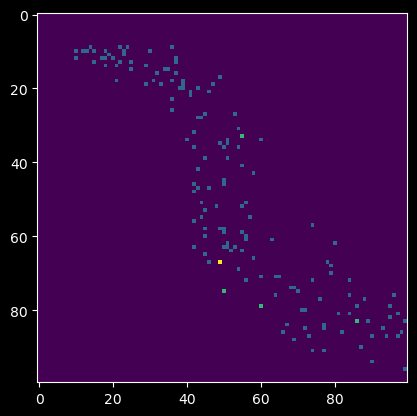

In [82]:
plt.imshow(kde_pilot)

In [83]:
np.isnan(n_u)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [84]:
np.sum(np.isnan(n_u))*

SyntaxError: invalid syntax (<ipython-input-84-5f4e0642689d>, line 1)

In [85]:
np.sum(np.isnan(n_u))

0

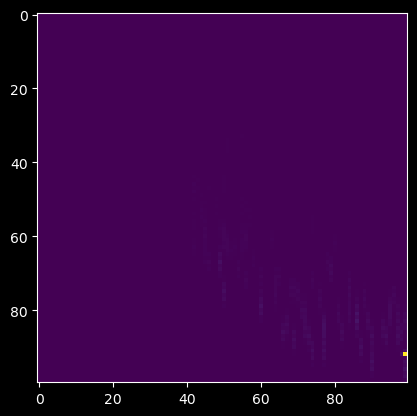

In [86]:
plt.imshow(n_u)

In [87]:
A

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

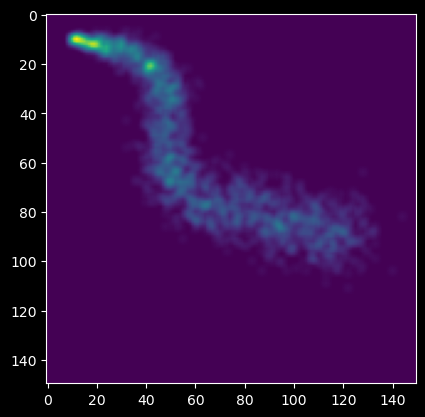

In [88]:
plt.imshow(A)

In [89]:
gaussian_kernels

[array([[1]]),
 array([[0.07556518, 0.12376086, 0.07556518],
        [0.12376086, 0.20269587, 0.12376086],
        [0.07556518, 0.12376086, 0.07556518]]),
 array([[0.0146392 , 0.02826177, 0.03519061, 0.02826177, 0.0146392 ],
        [0.02826177, 0.0545609 , 0.0679374 , 0.0545609 , 0.02826177],
        [0.03519061, 0.0679374 , 0.08459336, 0.0679374 , 0.03519061],
        [0.02826177, 0.0545609 , 0.0679374 , 0.0545609 , 0.02826177],
        [0.0146392 , 0.02826177, 0.03519061, 0.02826177, 0.0146392 ]]),
 array([[0.00502644, 0.00931295, 0.01348291, 0.01525278, 0.01348291,
         0.00931295, 0.00502644],
        [0.00931295, 0.01725498, 0.02498105, 0.02826025, 0.02498105,
         0.01725498, 0.00931295],
        [0.01348291, 0.02498105, 0.03616653, 0.04091403, 0.03616653,
         0.02498105, 0.01348291],
        [0.01525278, 0.02826025, 0.04091403, 0.04628472, 0.04091403,
         0.02826025, 0.01525278],
        [0.01348291, 0.02498105, 0.03616653, 0.04091403, 0.03616653,
         0.0

In [90]:
grid_size

100

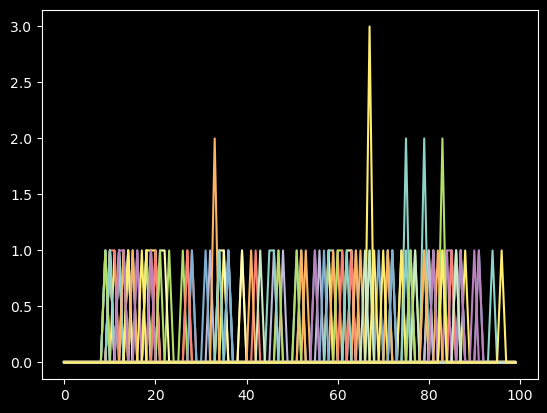

In [91]:
plt.plot(kde_pilot)

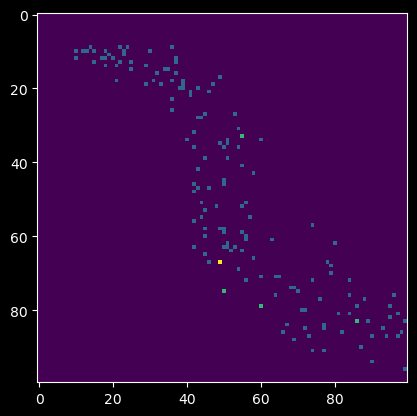

In [92]:
plt.imshow(kde_pilot)

<ipython-input-93-0b99d52d0058>:171: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


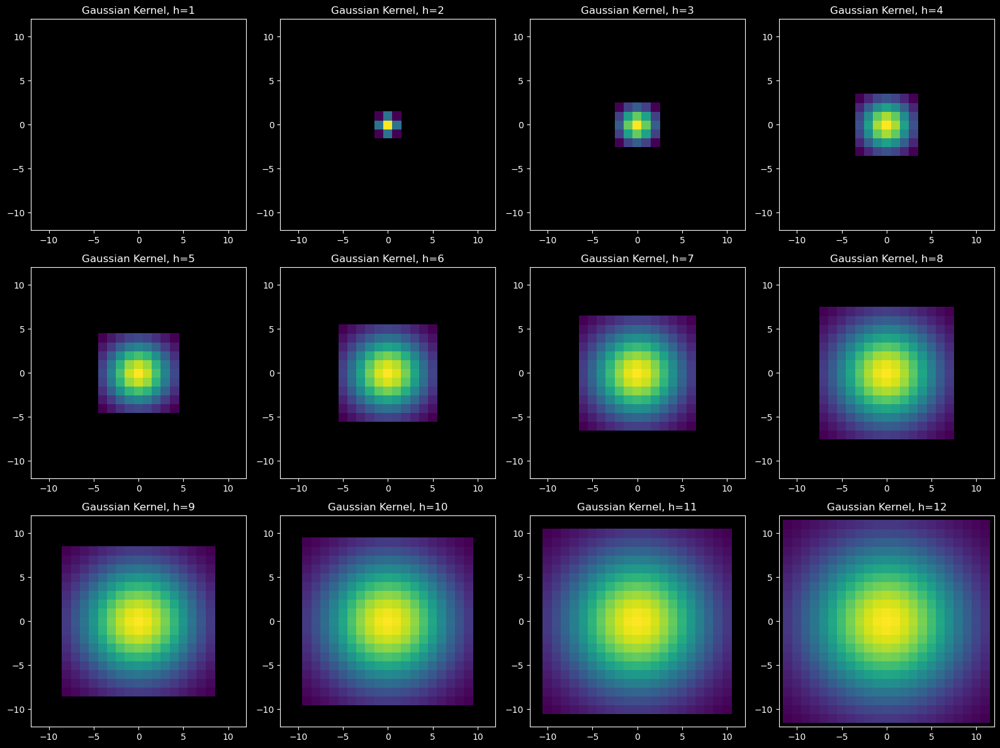

In [93]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True, nopython=True)
def histogram_estimator(particles, grid_size, weights=None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''
    # Initialize the histograms
    particle_count = np.zeros((grid_size, grid_size), dtype=np.int32)
    total_weight = np.zeros((grid_size, grid_size), dtype=np.float64)
    
    # Check if weights are provided
    if weights is None:
        weights = np.ones(len(particles), dtype=np.float64)
    
    # Create a 2D histogram of particle positions
    for i in numba.prange(len(particles)):
        x, y = particles[i, :]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[y, x] += weights[i]
        particle_count[y, x] += 1

    return total_weight, particle_count

#Function to calculate the grid projected kernel density estimator
#sigma_u is the total reach of the kernel in grid cells (sigma_u = 3*h is a good starting point)
def calculate_n_u(grid_size, kde_pilot, gaussian_kernels, sigma_u=3*1.5):
    
    n_u = np.zeros((grid_size, grid_size))
    
    #Sigma_u the bandwidth gives the size of the gaussian kernels to be used
    kernel_index = np.argmin(np.abs(bandwidths_h-sigma_u))
    #choose kernel
    kernel_size = len(gaussian_kernels[kernel_index]) // 2
    kernel = gaussian_kernels[kernel_index]

    for i in range(grid_size):
        for j in range(grid_size):
            # Define the window boundaries
            i_min = i - kernel_size
            i_max = i + kernel_size + 1
            j_min = j - kernel_size
            j_max = j + kernel_size + 1

            kernel = gaussian_kernels[kernel_index]

            # Mirror the kernel if the kernel goes outside the grid
            if i_min < 0:
                kernel[-i_min:(-i_min-i_min)] += np.flipud(kernel[0:-i_min])
                kernel = kernel[-i_min:]
                i_min = 0
            if i_max > grid_size:
                kernel[:i_max-grid_size] += np.flipud(kernel[-i_max+grid_size:])
                kernel = kernel[:grid_size-i_max]
                i_max = grid_size
            if j_min < 0:
                kernel[:, -j_min:-j_min-j_min] += np.fliplr(kernel[:, 0:-j_min])
                kernel = kernel[:, -j_min:]
                j_min = 0
            if j_max > grid_size:
                kernel[:, :j_max-grid_size] += np.fliplr(kernel[:, -j_max+grid_size:])
                kernel = kernel[:, :grid_size-j_max]
                j_max = grid_size

            # Calculate the weighted kernel
            weighted_kernel = kernel * kde_pilot[i, j]
            # Add the contribution to the result matrix
            n_u[i_min:i_max, j_min:j_max] += weighted_kernel

    return n_u


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw_full = bw
bw = bw[::frac_diff]
weights_full = np.ones(len(bw_full))
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

#First, calculate Gaussian kernels for h = 1,2,3,4,5,6,7,8,9,10,11,12

del_grid = x_grid[1]-x_grid[0]

gaussian_kernels = []
gaussian_kernels.append(np.array([[1]]))
num_ker = 12 #The number of kernels to calculate
bandwidths_h = np.zeros(num_ker) #Array to store the bandwidth ranges associated with each kernel
#
kernel_origin = []
kernel_origin.append(np.array([0,0]))
for i in range(1,12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    a = a.reshape(-1,1)
    b = b.reshape(1,-1)
    #2 times the standard deviation 
    h = i*(del_grid*0.5)+0.5*del_grid
    #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
    kernel_matrix = ((1/(2*np.pi*h**2))*np.exp(-0.5*((a/h)**2+(b/h)**2))/np.sum(((1/(2*np.pi*h*h))*np.exp(-0.5*((a/h)**2+(b/h)**2)))))
    gaussian_kernels.append(kernel_matrix)
    bandwidths_h[i] = h #can use just find nearest value here.
    kernel_origin.append(np.array([0,0]))
    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################

# Initialize the result matrix
A = np.zeros((grid_size, grid_size))

kernel_dim = 2 #The half width dimension of the kernels in grid cells (also sets h = kernel_dim*0.5)

# Iterate over the grid points
for i in range(grid_size):
    for j in range(grid_size):
        # Determine the kernel size
        kernel_size = len(gaussian_kernels[kernel_dim]) // 2
        kernel = gaussian_kernels[kernel_dim]
        # Define the window boundaries
        i_min = (i - kernel_size)
        i_max = (i + kernel_size + 1)
        j_min = (j - kernel_size)
        j_max = (j + kernel_size + 1)
           
        #Mirror the kernel if the kernel goes outside the grid
        # crop the kernel and mirror the part that leaked out of the grid
        if i_min < 0:
            #add the leaked mass to the edge of the kernel
            kernel[-i_min:-i_min-i_min] + np.flipud(kernel[0:-i_min])
            #crop the kernel by distance i_min:0
            kernel = kernel[-i_min:]  
            i_min = 0          
        if i_max > grid_size:
            kernel[:i_max-grid_size] + np.flipud(kernel[-i_max+grid_size:])
            kernel = kernel[:grid_size-i_max]
            i_max = grid_size
        if j_min < 0:
            kernel[:,-j_min:-j_min-j_min] + np.fliplr(kernel[:,0:-j_min])
            kernel = kernel[:,-j_min:]
            j_min = 0
        if j_max > grid_size:
            kernel[:,:j_max-grid_size] + np.fliplr(kernel[:,-j_max+grid_size:])
            kernel = kernel[:,:grid_size-j_max]
            j_max = grid_size
        # Calculate the weighted kernel

        weighted_kernel = kernel * counts[i, j]
        # Add the contribution to the result matrix
        A[i_min:i_max, j_min:j_max] += weighted_kernel

# Normalize the result matrix
A = A / np.sum(A)

############################################################
##### GRID PROJECTED ADAPTIVE KERNEL DENSITY ESTIMATOR #####
############################################################


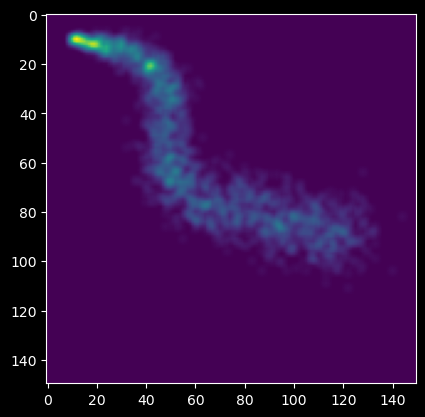

In [94]:
plt.imshow(A)

<ipython-input-95-d26fd64ad8b9>:171: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


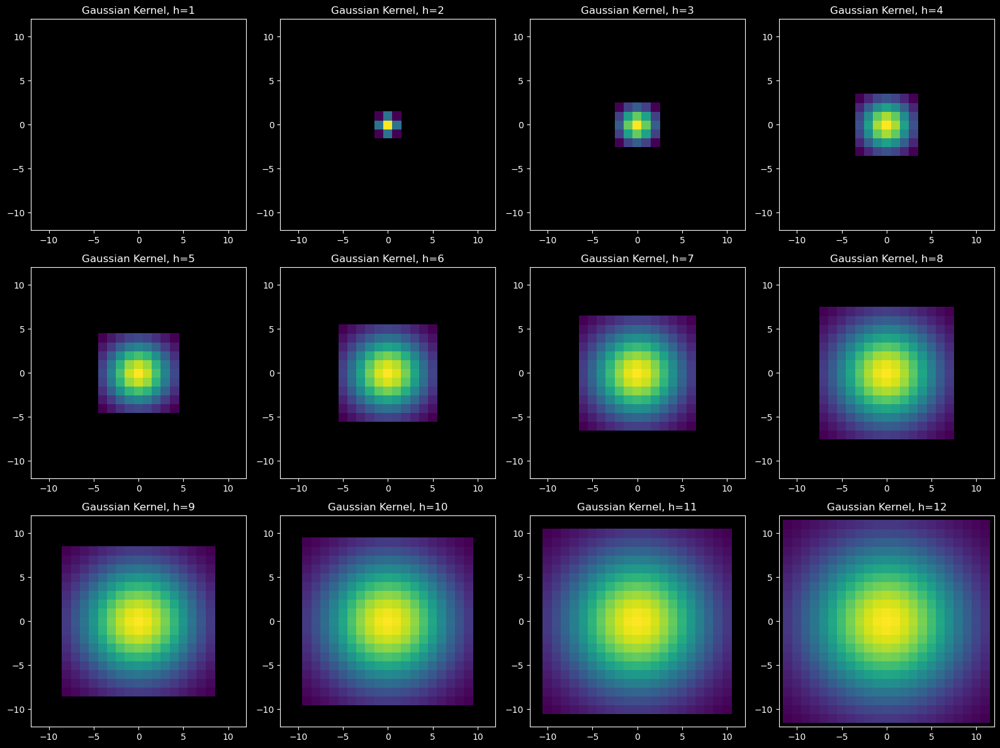

In [95]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True, nopython=True)
def histogram_estimator(particles, grid_size, weights=None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''
    # Initialize the histograms
    particle_count = np.zeros((grid_size, grid_size), dtype=np.int32)
    total_weight = np.zeros((grid_size, grid_size), dtype=np.float64)
    
    # Check if weights are provided
    if weights is None:
        weights = np.ones(len(particles), dtype=np.float64)
    
    # Create a 2D histogram of particle positions
    for i in numba.prange(len(particles)):
        x, y = particles[i, :]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[y, x] += weights[i]
        particle_count[y, x] += 1

    return total_weight, particle_count

#Function to calculate the grid projected kernel density estimator
#sigma_u is the total reach of the kernel in grid cells (sigma_u = 3*h is a good starting point)
def calculate_n_u(grid_size, kde_pilot, gaussian_kernels,bandwidths_h, sigma_u=3*1.5):
    
    n_u = np.zeros((grid_size, grid_size))
    
    #Sigma_u the bandwidth gives the size of the gaussian kernels to be used
    kernel_index = np.argmin(np.abs(bandwidths_h-sigma_u))
    #choose kernel
    kernel_size = len(gaussian_kernels[kernel_index]) // 2
    kernel = gaussian_kernels[kernel_index]

    for i in range(grid_size):
        for j in range(grid_size):
            # Define the window boundaries
            i_min = i - kernel_size
            i_max = i + kernel_size + 1
            j_min = j - kernel_size
            j_max = j + kernel_size + 1

            kernel = gaussian_kernels[kernel_index]

            # Mirror the kernel if the kernel goes outside the grid
            if i_min < 0:
                kernel[-i_min:(-i_min-i_min)] += np.flipud(kernel[0:-i_min])
                kernel = kernel[-i_min:]
                i_min = 0
            if i_max > grid_size:
                kernel[:i_max-grid_size] += np.flipud(kernel[-i_max+grid_size:])
                kernel = kernel[:grid_size-i_max]
                i_max = grid_size
            if j_min < 0:
                kernel[:, -j_min:-j_min-j_min] += np.fliplr(kernel[:, 0:-j_min])
                kernel = kernel[:, -j_min:]
                j_min = 0
            if j_max > grid_size:
                kernel[:, :j_max-grid_size] += np.fliplr(kernel[:, -j_max+grid_size:])
                kernel = kernel[:, :grid_size-j_max]
                j_max = grid_size

            # Calculate the weighted kernel
            weighted_kernel = kernel * kde_pilot[i, j]
            # Add the contribution to the result matrix
            n_u[i_min:i_max, j_min:j_max] += weighted_kernel

    return n_u


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw_full = bw
bw = bw[::frac_diff]
weights_full = np.ones(len(bw_full))
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

#First, calculate Gaussian kernels for h = 1,2,3,4,5,6,7,8,9,10,11,12

del_grid = x_grid[1]-x_grid[0]

gaussian_kernels = []
gaussian_kernels.append(np.array([[1]]))
num_ker = 12 #The number of kernels to calculate
bandwidths_h = np.zeros(num_ker) #Array to store the bandwidth ranges associated with each kernel
#
kernel_origin = []
kernel_origin.append(np.array([0,0]))
for i in range(1,12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    a = a.reshape(-1,1)
    b = b.reshape(1,-1)
    #2 times the standard deviation 
    h = i*(del_grid*0.5)+0.5*del_grid
    #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
    kernel_matrix = ((1/(2*np.pi*h**2))*np.exp(-0.5*((a/h)**2+(b/h)**2))/np.sum(((1/(2*np.pi*h*h))*np.exp(-0.5*((a/h)**2+(b/h)**2)))))
    gaussian_kernels.append(kernel_matrix)
    bandwidths_h[i] = h #can use just find nearest value here.
    kernel_origin.append(np.array([0,0]))
    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################

# Initialize the result matrix
A = np.zeros((grid_size, grid_size))

kernel_dim = 2 #The half width dimension of the kernels in grid cells (also sets h = kernel_dim*0.5)

# Iterate over the grid points
for i in range(grid_size):
    for j in range(grid_size):
        # Determine the kernel size
        kernel_size = len(gaussian_kernels[kernel_dim]) // 2
        kernel = gaussian_kernels[kernel_dim]
        # Define the window boundaries
        i_min = (i - kernel_size)
        i_max = (i + kernel_size + 1)
        j_min = (j - kernel_size)
        j_max = (j + kernel_size + 1)
           
        #Mirror the kernel if the kernel goes outside the grid
        # crop the kernel and mirror the part that leaked out of the grid
        if i_min < 0:
            #add the leaked mass to the edge of the kernel
            kernel[-i_min:-i_min-i_min] + np.flipud(kernel[0:-i_min])
            #crop the kernel by distance i_min:0
            kernel = kernel[-i_min:]  
            i_min = 0          
        if i_max > grid_size:
            kernel[:i_max-grid_size] + np.flipud(kernel[-i_max+grid_size:])
            kernel = kernel[:grid_size-i_max]
            i_max = grid_size
        if j_min < 0:
            kernel[:,-j_min:-j_min-j_min] + np.fliplr(kernel[:,0:-j_min])
            kernel = kernel[:,-j_min:]
            j_min = 0
        if j_max > grid_size:
            kernel[:,:j_max-grid_size] + np.fliplr(kernel[:,-j_max+grid_size:])
            kernel = kernel[:,:grid_size-j_max]
            j_max = grid_size
        # Calculate the weighted kernel

        weighted_kernel = kernel * counts[i, j]
        # Add the contribution to the result matrix
        A[i_min:i_max, j_min:j_max] += weighted_kernel

# Normalize the result matrix
A = A / np.sum(A)

############################################################
##### GRID PROJECTED ADAPTIVE KERNEL DENSITY ESTIMATOR #####
############################################################

grid_size = 100  # Example grid size
kde_pilot = A  

In [96]:
bandwidths_h

array([0.        , 1.00671141, 1.51006711, 2.01342282, 2.51677852,
       3.02013423, 3.52348993, 4.02684564, 4.53020134, 5.03355705,
       5.53691275, 6.04026846])

In [97]:
bandwidths_h

array([0.        , 1.00671141, 1.51006711, 2.01342282, 2.51677852,
       3.02013423, 3.52348993, 4.02684564, 4.53020134, 5.03355705,
       5.53691275, 6.04026846])

In [98]:
np.shape(gaussian_kernels)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (12,) + inhomogeneous part.

In [99]:
np.shape(gaussian_kernels[1])

(3, 3)

In [100]:
np.shape(gaussian_kernels[2])

(5, 5)

In [101]:
np.shape(gaussian_kernels[3])

(7, 7)

In [102]:

def generate_gaussian_kernels(x_grid, num_kernels, ratio):
    """
    Generates Gaussian kernels and their bandwidths.

    Parameters:
    x_grid (np.array): The grid on which the kernels are defined.
    num_kernels (int): The number of kernels to generate.
    ratio (float): The ratio between the kernel bandwidth and integration support.

    Returns:
    gaussian_kernels (list): List of Gaussian kernels.
    bandwidths_h (np.array): Array of bandwidths associated with each kernel.
    kernel_origin (list): List of kernel origins.
    """
    del_grid = x_grid[1] - x_grid[0]

    gaussian_kernels = [np.array([[1]])]
    bandwidths_h = np.zeros(num_kernels)
    kernel_origin = [np.array([0, 0])]

    for i in range(1, num_kernels):
        a = np.arange(-i, i + 1, 1).reshape(-1, 1)
        b = np.arange(-i, i + 1, 1).reshape(1, -1)
        h = i * (del_grid * ratio) + ratio * del_grid
        kernel_matrix = ((1 / (2 * np.pi * h ** 2)) * np.exp(-0.5 * ((a / h) ** 2 + (b / h) ** 2)) /
                         np.sum((1 / (2 * np.pi * h ** 2)) * np.exp(-0.5 * ((a / h) ** 2 + (b / h) ** 2))))
        gaussian_kernels.append(kernel_matrix)
        bandwidths_h[i] = h
        kernel_origin.append(np.array([0, 0]))

    return gaussian_kernels, bandwidths_h, kernel_origin

# Example usage:
x_grid = np.linspace(0, 10, 100)
num_kernels = 12
ratio = 0.5
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)


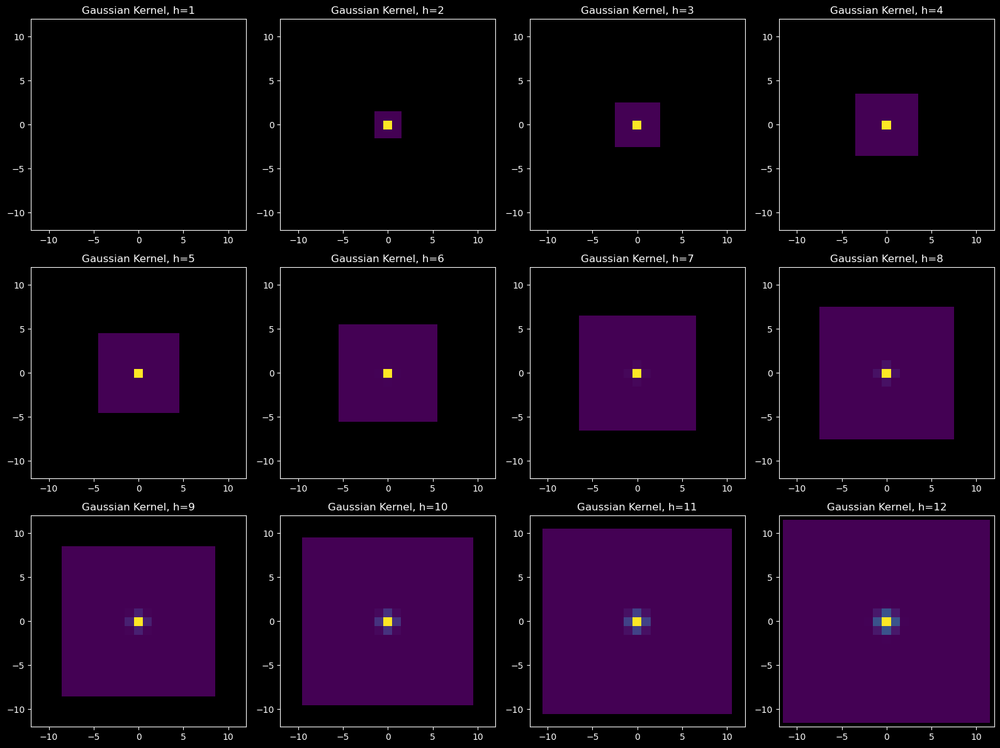

In [103]:
    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

In [104]:
i

11

In [105]:
i * (del_grid * ratio) + ratio * del_grid

6.0402684563758395

In [106]:
del_grid

1.0067114093959733

In [107]:
del_grid

1.0067114093959733

In [108]:
len(a)

23

In [109]:
np.shape(b)

(23,)

In [110]:
i

11

In [111]:
h = i * (len(a) * ratio) + ratio * len(a)

In [112]:
h

138.0

In [113]:
i

11

In [114]:
(len(a) * ratio)

11.5

In [115]:
(len(a) * ratio)

11.5

In [116]:
ratio * len(a)

11.5

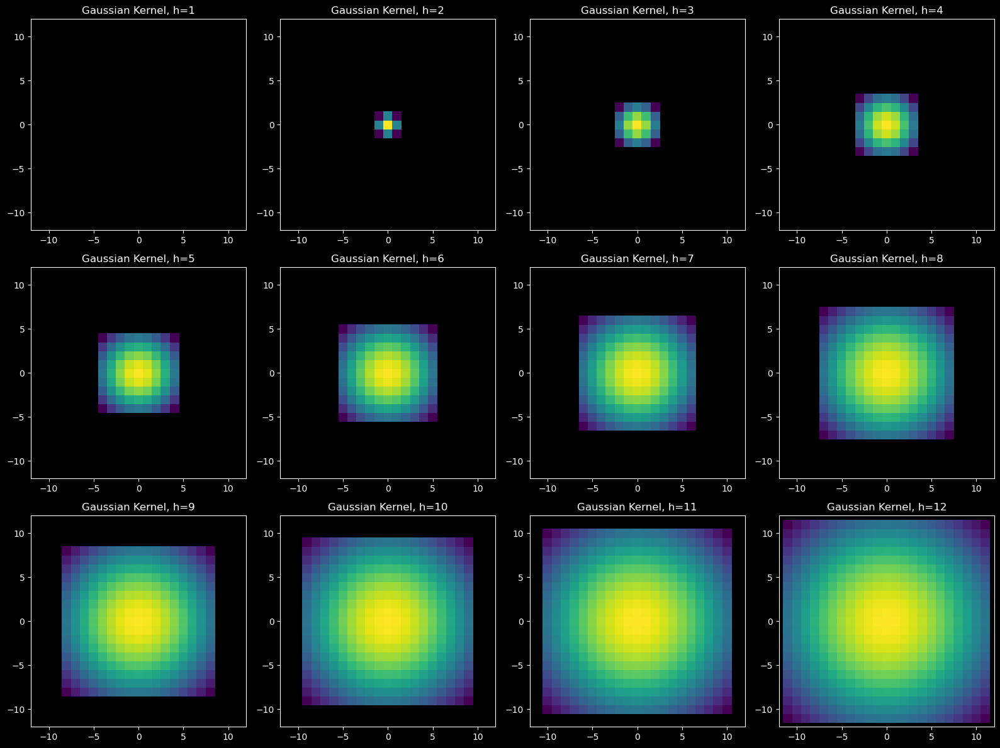

In [117]:
def generate_gaussian_kernels(x_grid, num_kernels, ratio, stretch=1):
    """
    Generates Gaussian kernels and their bandwidths.

    Parameters:
    x_grid (np.array): The grid on which the kernels are defined.
    num_kernels (int): The number of kernels to generate.
    ratio (float): The ratio between the kernel bandwidth and integration support.
    stretch (float): The stretch factor of the kernels. Defined as the ratio between the bandwidth in the x and y directions.

    Returns:
    gaussian_kernels (list): List of Gaussian kernels.
    bandwidths_h (np.array): Array of bandwidths associated with each kernel.
    kernel_origin (list): List of kernel origins.
    """

    del_grid = x_grid[1] - x_grid[0]

    gaussian_kernels = [np.array([[1]])]
    bandwidths_h = np.zeros(num_kernels)
    kernel_origin = [np.array([0, 0])]

    for i in range(1, num_kernels):
        a = np.arange(-i, i + 1, 1).reshape(-1, 1)
        b = np.arange(-i, i + 1, 1).reshape(1, -1)
        h = (len(a) * ratio) #+ ratio * len(a) #multiply with 2 here, since it goes in all directions (i.e. the 11 kernel is 22 wide etc.). 
        #impose stretch and calculate the kernel
        h_a = h*stretch
        h_b = h
        kernel_matrix = ((1 / (2 * np.pi * h_a * h_b)) * np.exp(-0.5 * ((a / h_a) ** 2 + (b / h_b) ** 2)))
        gaussian_kernels.append(kernel_matrix)
        bandwidths_h[i] = h
        kernel_origin.append(np.array([0, 0]))

    return gaussian_kernels, bandwidths_h, kernel_origin

# Example usage:
x_grid = np.linspace(0, 10, 100)
num_kernels = 12
ratio = 0.5
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)

    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()


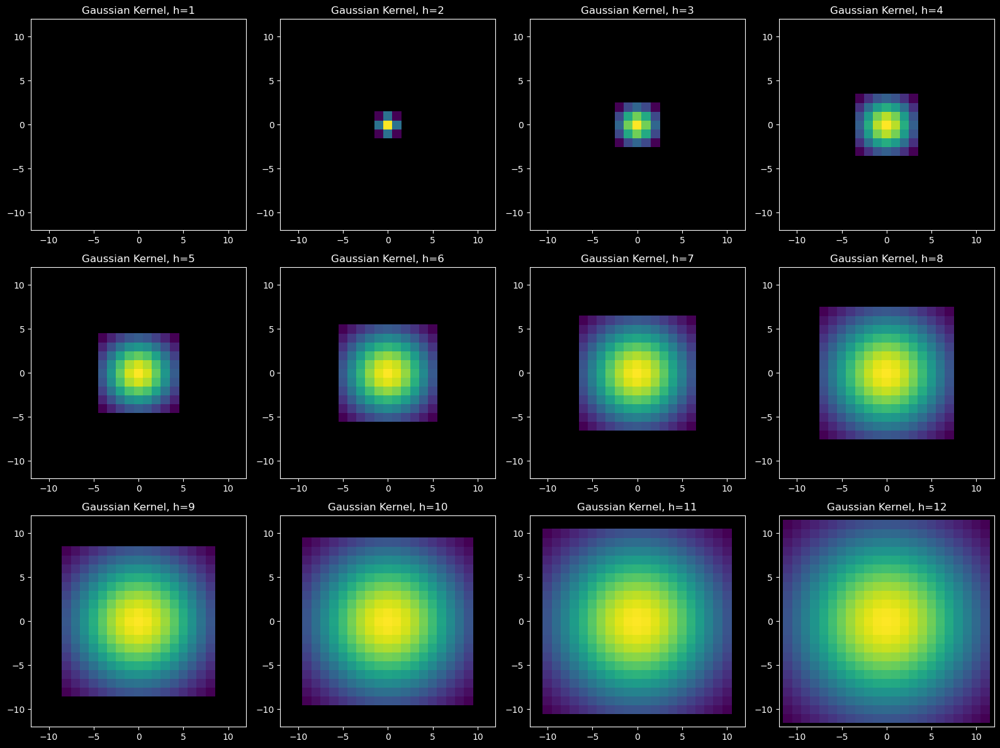

In [118]:

def generate_gaussian_kernels(x_grid, num_kernels, ratio, stretch=1):
    """
    Generates Gaussian kernels and their bandwidths.

    Parameters:
    x_grid (np.array): The grid on which the kernels are defined.
    num_kernels (int): The number of kernels to generate.
    ratio (float): The ratio between the kernel bandwidth and integration support.
    stretch (float): The stretch factor of the kernels. Defined as the ratio between the bandwidth in the x and y directions.

    Returns:
    gaussian_kernels (list): List of Gaussian kernels.
    bandwidths_h (np.array): Array of bandwidths associated with each kernel.
    kernel_origin (list): List of kernel origins.
    """

    del_grid = x_grid[1] - x_grid[0]

    gaussian_kernels = [np.array([[1]])]
    bandwidths_h = np.zeros(num_kernels)
    kernel_origin = [np.array([0, 0])]

    for i in range(1, num_kernels):
        a = np.arange(-i, i + 1, 1).reshape(-1, 1)
        b = np.arange(-i, i + 1, 1).reshape(1, -1)
        h = (len(a) * ratio) #+ ratio * len(a) #multiply with 2 here, since it goes in all directions (i.e. the 11 kernel is 22 wide etc.). 
        #impose stretch and calculate the kernel
        h_a = h*stretch
        h_b = h
        kernel_matrix = ((1 / (2 * np.pi * h_a * h_b)) * np.exp(-0.5 * ((a / h_a) ** 2 + (b / h_b) ** 2)))
        gaussian_kernels.append(kernel_matrix)
        bandwidths_h[i] = h
        kernel_origin.append(np.array([0, 0]))

    return gaussian_kernels, bandwidths_h, kernel_origin

# Example usage:
x_grid = np.linspace(0, 10, 100)
num_kernels = 12
ratio = 1/3
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)

    
#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

In [119]:
np.linspace(0, 10, 100)

array([ 0.        ,  0.1010101 ,  0.2020202 ,  0.3030303 ,  0.4040404 ,
        0.50505051,  0.60606061,  0.70707071,  0.80808081,  0.90909091,
        1.01010101,  1.11111111,  1.21212121,  1.31313131,  1.41414141,
        1.51515152,  1.61616162,  1.71717172,  1.81818182,  1.91919192,
        2.02020202,  2.12121212,  2.22222222,  2.32323232,  2.42424242,
        2.52525253,  2.62626263,  2.72727273,  2.82828283,  2.92929293,
        3.03030303,  3.13131313,  3.23232323,  3.33333333,  3.43434343,
        3.53535354,  3.63636364,  3.73737374,  3.83838384,  3.93939394,
        4.04040404,  4.14141414,  4.24242424,  4.34343434,  4.44444444,
        4.54545455,  4.64646465,  4.74747475,  4.84848485,  4.94949495,
        5.05050505,  5.15151515,  5.25252525,  5.35353535,  5.45454545,
        5.55555556,  5.65656566,  5.75757576,  5.85858586,  5.95959596,
        6.06060606,  6.16161616,  6.26262626,  6.36363636,  6.46464646,
        6.56565657,  6.66666667,  6.76767677,  6.86868687,  6.96

In [120]:

# Create kernels:
x_grid = np.linspace(0, 10, 100)
num_kernels = 20
ratio = 1/3
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)

    

In [121]:
gaussian_kernels

[array([[1]]),
 array([[0.05854983, 0.09653235, 0.05854983],
        [0.09653235, 0.15915494, 0.09653235],
        [0.05854983, 0.09653235, 0.05854983]]),
 array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
 array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
         0.00885874, 0.00559695],
        [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
         0.01402145, 0.00885874],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0184691 , 0.01166876],
        [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
         0.02024556, 0.01279113],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0

In [122]:
bandwidths_h

array([ 0.        ,  1.        ,  1.66666667,  2.33333333,  3.        ,
        3.66666667,  4.33333333,  5.        ,  5.66666667,  6.33333333,
        7.        ,  7.66666667,  8.33333333,  9.        ,  9.66666667,
       10.33333333, 11.        , 11.66666667, 12.33333333, 13.        ])

In [123]:
4/3

1.3333333333333333

In [124]:
5/3

1.6666666666666667

In [125]:
kernel_bandwidths = bandwidths_h

In [126]:
h

138.0

In [127]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)*0.1
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.1


<ipython-input-128-6ba782750c1b>:179: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


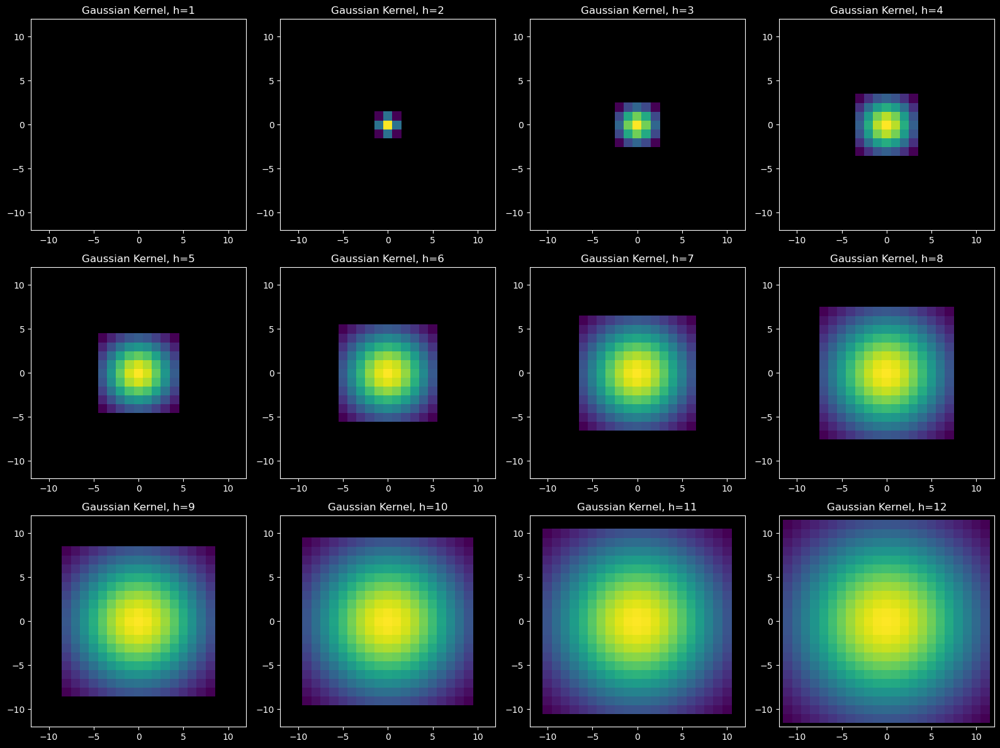

In [128]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True, nopython=True)
def histogram_estimator(particles, grid_size, weights=None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''
    # Initialize the histograms
    particle_count = np.zeros((grid_size, grid_size), dtype=np.int32)
    total_weight = np.zeros((grid_size, grid_size), dtype=np.float64)
    
    # Check if weights are provided
    if weights is None:
        weights = np.ones(len(particles), dtype=np.float64)
    
    # Create a 2D histogram of particle positions
    for i in numba.prange(len(particles)):
        x, y = particles[i, :]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[y, x] += weights[i]
        particle_count[y, x] += 1

    return total_weight, particle_count


#Function to calculate the grid projected kernel density estimator
#sigma_u is the total reach of the kernel in grid cells (sigma_u = 3*h is a good starting point)
#sigma_u is the integration support... 
def grid_proj_kde(grid_size, kde_pilot, gaussian_kernels, kernel_bandwidths, particle_bandwidths):
    
    #sigma_u sets the integration support for the kernels and the bandwidth is defined from 
    #that and the gaussian kernel objects.
    #kernel_bandwidths is the bandwidths for the kernels
    #

    n_u = np.zeros((grid_size, grid_size))
    
    
    #Sigma_u the bandwidth gives the size of the gaussian kernels to be used
    kernel_index = np.argmin(np.abs(kernel_bandwidths-particle_bandwidths))
    #choose kernel
    kernel_size = len(gaussian_kernels[kernel_index]) // 2
    kernel = gaussian_kernels[kernel_index]

    for i in range(grid_size):
        for j in range(grid_size):
            # Define the window boundaries
            i_min = i - kernel_size
            i_max = i + kernel_size + 1
            j_min = j - kernel_size
            j_max = j + kernel_size + 1

            kernel = gaussian_kernels[kernel_index]

            # Mirror the kernel if the kernel goes outside the grid
            if i_min < 0:
                kernel[-i_min:(-i_min-i_min)] += np.flipud(kernel[0:-i_min])
                kernel = kernel[-i_min:]
                i_min = 0
            if i_max > grid_size:
                kernel[:i_max-grid_size] += np.flipud(kernel[-i_max+grid_size:])
                kernel = kernel[:grid_size-i_max]
                i_max = grid_size
            if j_min < 0:
                kernel[:, -j_min:-j_min-j_min] += np.fliplr(kernel[:, 0:-j_min])
                kernel = kernel[:, -j_min:]
                j_min = 0
            if j_max > grid_size:
                kernel[:, :j_max-grid_size] += np.fliplr(kernel[:, -j_max+grid_size:])
                kernel = kernel[:, :grid_size-j_max]
                j_max = grid_size

            # Calculate the weighted kernel
            weighted_kernel = kernel * kde_pilot[i, j]
            # Add the contribution to the result matrix
            n_u[i_min:i_max, j_min:j_max] += weighted_kernel

    return n_u


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

    
def generate_gaussian_kernels(x_grid, num_kernels, ratio, stretch=1):
    """
    Generates Gaussian kernels and their bandwidths.

    Parameters:
    x_grid (np.array): The grid on which the kernels are defined.
    num_kernels (int): The number of kernels to generate.
    ratio (float): The ratio between the kernel bandwidth and integration support.
    stretch (float): The stretch factor of the kernels. Defined as the ratio between the bandwidth in the x and y directions.

    Returns:
    gaussian_kernels (list): List of Gaussian kernels.
    bandwidths_h (np.array): Array of bandwidths associated with each kernel.
    kernel_origin (list): List of kernel origins.
    """

    del_grid = x_grid[1] - x_grid[0]

    gaussian_kernels = [np.array([[1]])]
    bandwidths_h = np.zeros(num_kernels)
    kernel_origin = [np.array([0, 0])]

    for i in range(1, num_kernels):
        a = np.arange(-i, i + 1, 1).reshape(-1, 1)
        b = np.arange(-i, i + 1, 1).reshape(1, -1)
        h = (len(a) * ratio) #+ ratio * len(a) #multiply with 2 here, since it goes in all directions (i.e. the 11 kernel is 22 wide etc.). 
        #impose stretch and calculate the kernel
        h_a = h*stretch
        h_b = h
        kernel_matrix = ((1 / (2 * np.pi * h_a * h_b)) * np.exp(-0.5 * ((a / h_a) ** 2 + (b / h_b) ** 2)))
        gaussian_kernels.append(kernel_matrix)
        bandwidths_h[i] = h
        kernel_origin.append(np.array([0, 0]))

    return gaussian_kernels, bandwidths_h, kernel_origin


#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw_full = bw
bw = bw[::frac_diff]
weights_full = np.ones(len(bw_full))
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

# Create kernels:
x_grid = np.linspace(0, 10, 100)
num_kernels = 20
ratio = 1/3
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)

#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################


#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)*0.1
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.1

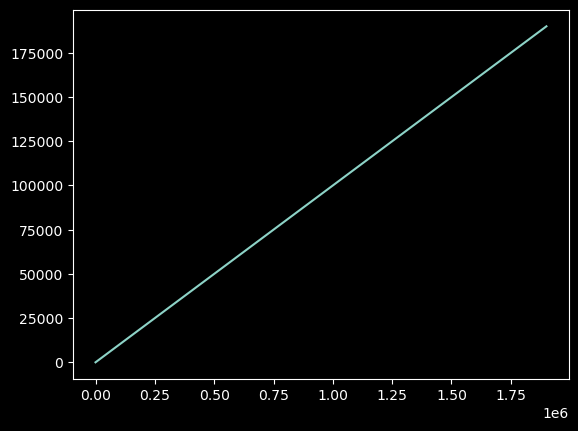

In [129]:
plt.plot(particle_bandwidths)

In [130]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)*0.1
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0000000.1


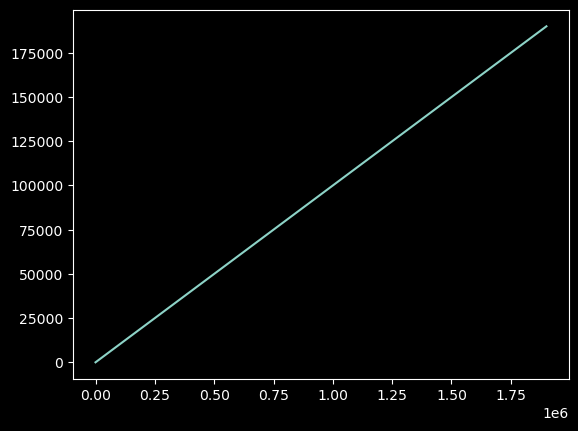

In [131]:
plt.plot(particle_bandwidths)

In [132]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)*0.1

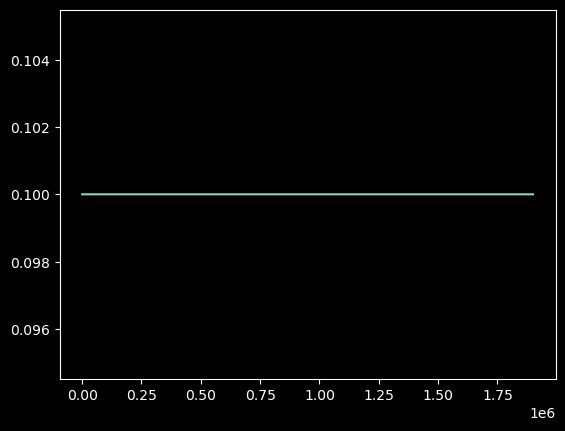

In [133]:
plt.plot(particle_bandwidths)

In [134]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0000000.1

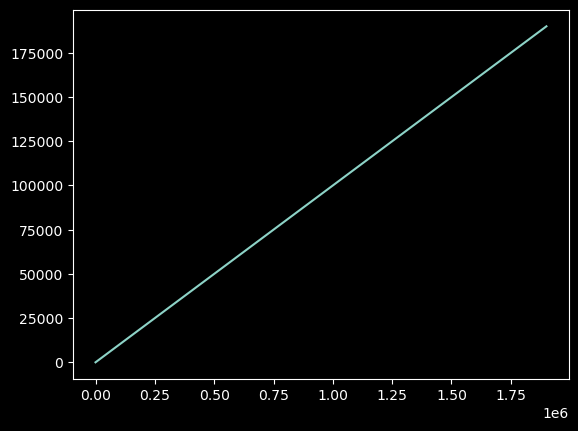

In [135]:
plt.plot(particle_bandwidths)

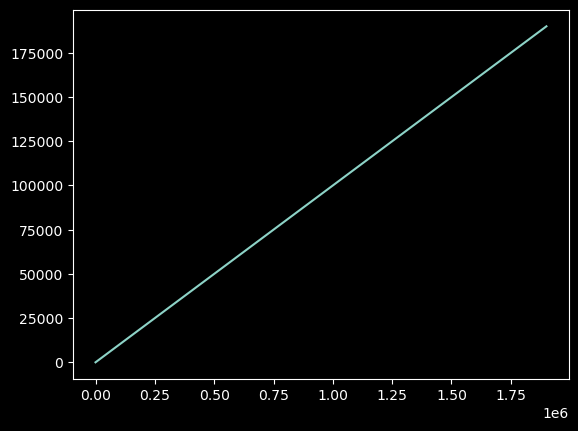

In [136]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+00000000000.1

plt.plot(particle_bandwidths)

In [137]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)

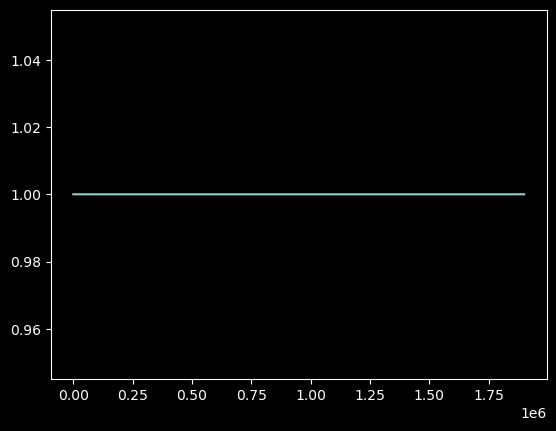

In [138]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]#+00000000000.1

plt.plot(particle_bandwidths)


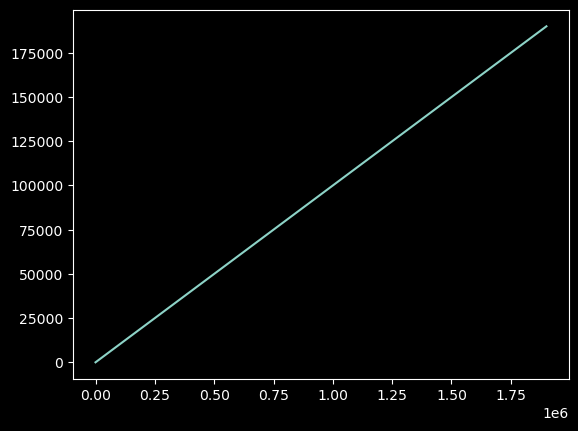

In [139]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+00000000000.1

plt.plot(particle_bandwidths)


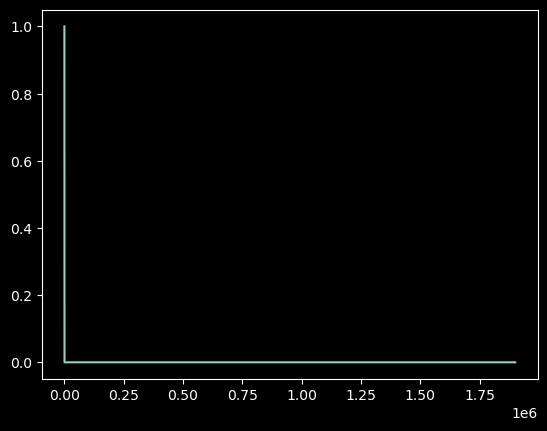

In [140]:


#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]*0.01

plt.plot(particle_bandwidths)

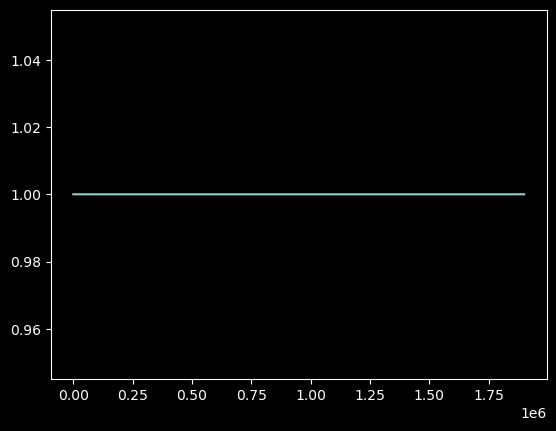

In [141]:


#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.000000000000000000000001

plt.plot(particle_bandwidths)


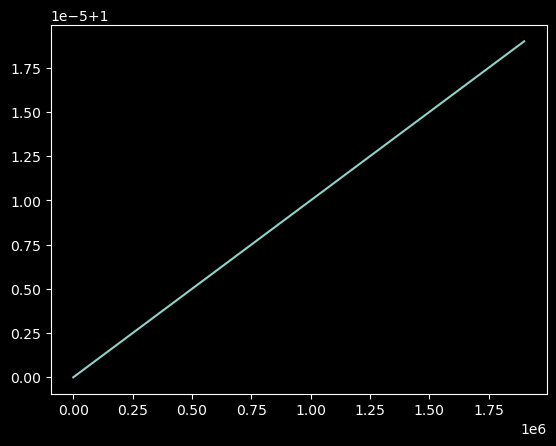

In [142]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.00000000001

plt.plot(particle_bandwidths)


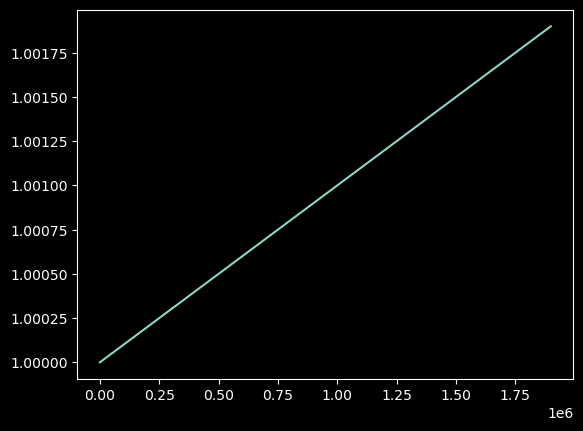

In [143]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.000000001

plt.plot(particle_bandwidths)


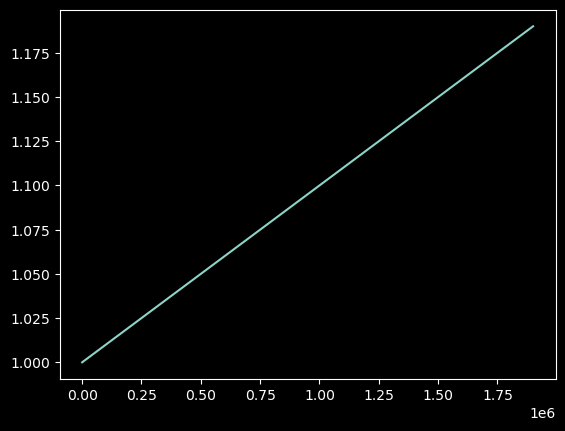

In [144]:

#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.0000001

plt.plot(particle_bandwidths)

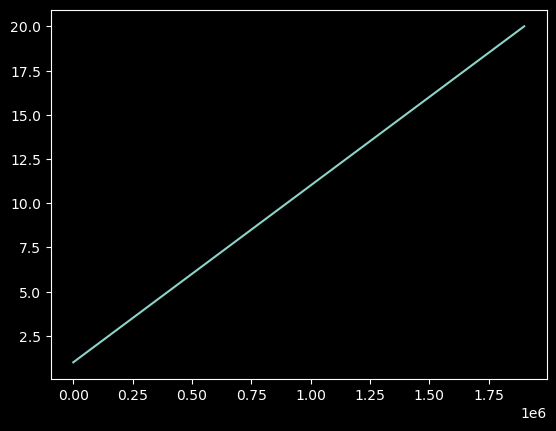

In [145]:


#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.00001

plt.plot(particle_bandwidths)


In [146]:
particle_bandwidths

array([ 1.     ,  1.00001,  1.00002, ..., 19.99997, 19.99998, 19.99999])

In [147]:
kernel_bandwidths

array([ 0.        ,  1.        ,  1.66666667,  2.33333333,  3.        ,
        3.66666667,  4.33333333,  5.        ,  5.66666667,  6.33333333,
        7.        ,  7.66666667,  8.33333333,  9.        ,  9.66666667,
       10.33333333, 11.        , 11.66666667, 12.33333333, 13.        ])

In [148]:
np.argmin(np.abs(kernel_bandwidths-particle_bandwidths))

ValueError: operands could not be broadcast together with shapes (20,) (1900000,) 

In [149]:
np.abs(kernel_bandwidths-particle_bandwidths)

ValueError: operands could not be broadcast together with shapes (20,) (1900000,) 

In [150]:
550/30

18.333333333333332

In [151]:
550/20

27.5

In [152]:
kernel_indices = np.argmin(np.abs(kernel_bandwidths[:, np.newaxis] - particle_bandwidths), axis=0)

In [153]:
np.shape(particle_bandwidths)

(1900000,)

In [154]:
kernel_indices

array([ 1,  1,  1, ..., 19, 19, 19], dtype=int64)

In [155]:
gaussian_kernels[0]

array([[1]])

In [156]:
kernel_bandwidths[0]

0.0

In [157]:
kernel_bandwidths[1]

1.0

In [158]:
kernel_bandwidths[2]

1.6666666666666665

<ipython-input-159-daf2253b0aa8>:173: RuntimeWarning: divide by zero encountered in scalar divide
  kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))


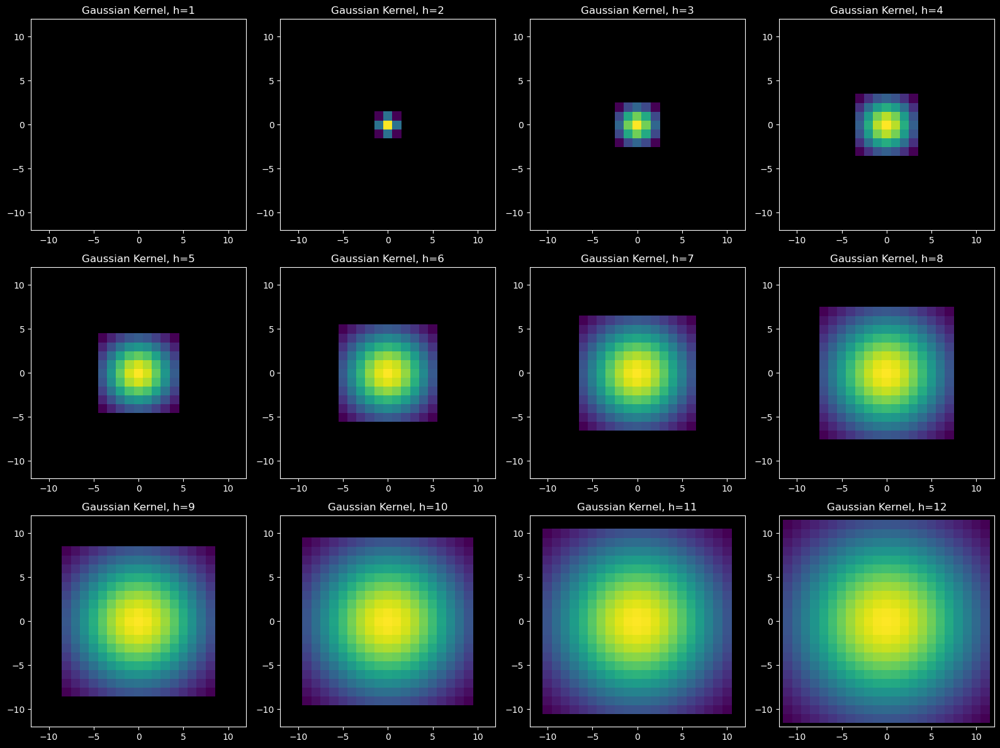

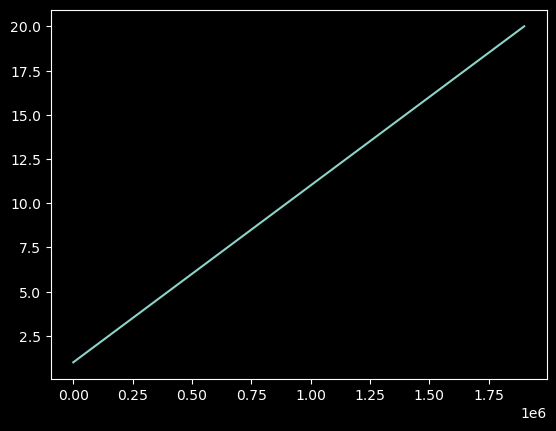

In [159]:
'''
Script for testing the adaptive hydrid Kernel Density estimator

Author: Knut Ola Dølven

'''

import numpy as np
import matplotlib.pyplot as plt
#import sns to make use of the colormaps there
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import numba
from scipy.stats import gaussian_kde
from scipy.stats import norm

#Triggers
create_test_data = False
load_test_data = True
plotting = True

# Parameters
grid_size = 150
grid_size_plot = 100
x_grid = np.linspace(0, grid_size, grid_size)
y_grid = np.linspace(0, grid_size, grid_size)
frac_diff = 1000 #the fractinoal difference between the full dataset and the test dataset

num_particles_per_timestep = 5000 #seeded one after the other
time_steps = 380
dt = 0.1
stdev = 1.4 #Stochastic std
U_a = np.array([2.5, 2.5]) #Advection velocity
num_particles = num_particles_per_timestep*time_steps


# ------------------------------------------------------- #
###########################################################
##################### FUNCTIONS ###########################
###########################################################
# ------------------------------------------------------- #


@numba.jit(parallel=True, nopython=True)
def histogram_estimator(particles, grid_size, weights=None):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    grid_size: int
    
    Output:
    particle_count: np.array of shape (grid_size, grid_size)
    '''
    # Initialize the histograms
    particle_count = np.zeros((grid_size, grid_size), dtype=np.int32)
    total_weight = np.zeros((grid_size, grid_size), dtype=np.float64)
    
    # Check if weights are provided
    if weights is None:
        weights = np.ones(len(particles), dtype=np.float64)
    
    # Create a 2D histogram of particle positions
    for i in numba.prange(len(particles)):
        x, y = particles[i, :]
        if np.isnan(x) or np.isnan(y):
            continue
        x = int(x)
        y = int(y)
        if x >= grid_size or y >= grid_size or x < 0 or y < 0:
            continue
        total_weight[y, x] += weights[i]
        particle_count[y, x] += 1

    return total_weight, particle_count


#Function to calculate the grid projected kernel density estimator
def grid_proj_kde(grid_size, kde_pilot, gaussian_kernels, kernel_bandwidths, particle_bandwidths):
    """
    Projects a kernel density estimate (KDE) onto a grid using Gaussian kernels.

    Parameters:
    grid_size (int): The size of the grid (grid_size x grid_size).
    kde_pilot (np.array): The pilot KDE values on the grid.
    gaussian_kernels (list): List of Gaussian kernel matrices.
    kernel_bandwidths (np.array): Array of bandwidths associated with each Gaussian kernel.
    particle_bandwidths (np.array): Array of bandwidths of the particles.

    Returns:
    np.array: The resulting KDE projected onto the grid.
    """
    
    n_u = np.zeros((grid_size, grid_size))
    
    # Find the closest kernel indices for each particle bandwidth
    kernel_indices = np.argmin(np.abs(kernel_bandwidths[:, np.newaxis] - particle_bandwidths), axis=0)
    
    # Get the indices of non-zero kde_pilot values
    non_zero_indices = np.argwhere(kde_pilot > 0)
    
    for idx in non_zero_indices:
        i, j = idx
        # Get the appropriate kernel for the current particle bandwidth
        kernel_index = kernel_indices[i * grid_size + j]
        kernel = gaussian_kernels[kernel_index]
        kernel_size = len(kernel) // 2

        # Define the window boundaries
        i_min = max(i - kernel_size, 0)
        i_max = min(i + kernel_size + 1, grid_size)
        j_min = max(j - kernel_size, 0)
        j_max = min(j + kernel_size + 1, grid_size)

        # Calculate the weighted kernel
        weighted_kernel = kernel * kde_pilot[i, j]

        # Add the contribution to the result matrix
        n_u[i_min:i_max, j_min:j_max] += weighted_kernel[
            max(0, kernel_size - i):kernel_size + min(grid_size - i, kernel_size + 1),
            max(0, kernel_size - j):kernel_size + min(grid_size - j, kernel_size + 1)
        ]

    return n_u


def kernel_matrix_2d_NOFLAT(x,y,x_grid,y_grid,bw,weights,ker_size_frac=4,bw_cutoff=2):
    ''' 
    Creates a kernel matrices for a 2d gaussian kernel with bandwidth bw and a cutoff at 
    2*bw for all datapoints and sums them onto grid x_grid,ygrid. The kernel matrices are 
    created by binning the kernel values (the 2d gaussian) are created with a grid with
    adaptive resolution such that the kernel resolution fits within the x_grid/y_grid grid resolution. 
    Normalizes with the sum of the kernel values (l2norm). Assumes uniform x_grid/y_grid resolution.
    Input: 
    x: x-coordinates of the datapoints
    y: y-coordinates of the datapoints
    x_grid: x-coordinates of the grid
    y_grid: y-coordinates of the grid
    bw: bandwidth of the kernel (vector of length n with the bandwidth for each datapoint)
    weights: weights for each datapoint
    ker_size_frac: the fraction of the grid size of the underlying grid that the kernel grid should be
    bw_cutoff: the cutoff for the kernel in standard deviations
    Adaptive: if True, the kernel grid will be adaptive to the particle density at each point

    Output:
    GRID_active: a 3d matrix with the kernel values for each datapoint
    '''

    #desired fractional difference between kernel grid size and grid size
    ker_size_frac = 4 #1/3 of the grid size of underlying grid
    bw_cutoff = 2 #cutoff for the kernel in standard deviations

    #calculate the grid resolution
    dxy_grid = x_grid[1]-x_grid[0]

    #create a grid for z values
    GRID_active = np.zeros((len(x_grid),len(y_grid)))

    for i in range(len(x)):
        #calculate the kernel for each datapoint
        #Adapt the bandwidth if adaptive is not False    
        #kernel_matrix[i,:] = gaussian_kernel_2d(grid_points[0]-x[i],grid_points[1]-y[i],bw=bw)
        #create a matrix for the kernel that makes sure the kernel resolution fits
        #within the grid resolution (adaptive kernel size). ker_size is the number of points in each direction
        #in the kernel. Can also add in weight of kernel here to save time, but let's do that later if needed.
        ker_size = int(np.ceil((bw_cutoff*2*bw[i]*ker_size_frac)/dxy_grid))
        a = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        b = np.linspace(-bw_cutoff*bw[i],bw_cutoff*bw[i],ker_size)
        #create the 2d coordinate matrix
        a = a.reshape(-1,1)
        b = b.reshape(1,-1)
        #kernel_matrix[i,:] = #gaussian_kernel_2d_sym(a,b,bw=1, norm='l2norm')
        kernel_matrix = ((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2)))/np.sum(((1/(2*np.pi*bw[i]*bw[i]))*np.exp(-0.5*((a/bw[i])**2+(b/bw[i])**2))))
        #add the kernel_matrix values by binning them into the grid using digitize
        #get the indices of the grid points that are closest to the datapoints
        lx = a+x[i]
        ly = b+y[i]
        #get the indices of the grid points that are closest to the datapoints
        ix = np.digitize(lx,x_grid)
        iy = np.digitize(ly,y_grid)

        #if any values in ix or iy is outside the grid, remove the kernel entirely and skip to next iteration
        if np.any(ix >= len(x_grid)) or np.any(iy >= len(y_grid)) or np.any(ix < 0) or np.any(iy < 0):
            continue

        #add the kernel values to the grid
        GRID_active[ix,iy] += kernel_matrix*weights[i]

    return GRID_active

# Function to update particle positions
def update_positions(particles, U_a, stdev, dt):
    '''
    Input:
    particles: np.array of shape (num_particles, 2)
    U_a: np.array of shape (2,)

    '''
    # Advective term
    advective_displacement = U_a * dt
    
    # Stochastic term
    stochastic_displacement = np.random.normal(0, stdev, particles.shape) * np.sqrt(dt)
    
    # Update positions
    particles += advective_displacement + stochastic_displacement
    
    #particles = np.mod(particles, grid_size)
    
    return particles

    
def generate_gaussian_kernels(x_grid, num_kernels, ratio, stretch=1):
    """
    Generates Gaussian kernels and their bandwidths.

    Parameters:
    x_grid (np.array): The grid on which the kernels are defined.
    num_kernels (int): The number of kernels to generate.
    ratio (float): The ratio between the kernel bandwidth and integration support.
    stretch (float): The stretch factor of the kernels. Defined as the ratio between the bandwidth in the x and y directions.

    Returns:
    gaussian_kernels (list): List of Gaussian kernels.
    bandwidths_h (np.array): Array of bandwidths associated with each kernel.
    kernel_origin (list): List of kernel origins.
    """

    del_grid = x_grid[1] - x_grid[0]

    gaussian_kernels = [np.array([[1]])]
    bandwidths_h = np.zeros(num_kernels)
    kernel_origin = [np.array([0, 0])]

    for i in range(1, num_kernels):
        a = np.arange(-i, i + 1, 1).reshape(-1, 1)
        b = np.arange(-i, i + 1, 1).reshape(1, -1)
        h = (len(a) * ratio) #+ ratio * len(a) #multiply with 2 here, since it goes in all directions (i.e. the 11 kernel is 22 wide etc.). 
        #impose stretch and calculate the kernel
        h_a = h*stretch
        h_b = h
        kernel_matrix = ((1 / (2 * np.pi * h_a * h_b)) * np.exp(-0.5 * ((a / h_a) ** 2 + (b / h_b) ** 2)))
        gaussian_kernels.append(kernel_matrix)
        bandwidths_h[i] = h
        kernel_origin.append(np.array([0, 0]))

    #set the smallest bandwidth to 0.5 of the first calculated bandwidth (gaussian_kernels[1])
    bandwidths_h[0] = bandwidths_h[1] * 0.5

    return gaussian_kernels, bandwidths_h, kernel_origin


#
#Create test data function
#
def create_test_data(stdev=1.4, num_particles_per_timestep=5000, time_steps=380, dt=0.1, grid_size=150, num_particles=5000):
    #Creates a bunch of particles and the time dependant bandwidth parameter. 
    #returns the particle trajectories and the bandwidth vector
    # Release position
    release_position = np.array([10, 10])
    #Make U_a a periodic function with size time_steps
    U_a = [0,5] #Initial value
    #Initial magnitude
    magU = np.sqrt(U_a[0]**2+U_a[1]**2)
    U_a = np.tile(U_a, (time_steps, 1))
    for i in range(1, time_steps):
        U_a[i][:][0] = 2*magU+ np.sin(i/50)*2*magU
        #make it a bit more complex by adding another sine function with different
        #frequency
        #U_a[i][:][1] = 2*magU+ np.sin(i/50)*2*magU + np.sin(i/10)*2*magU
        print(np.sin(i/10))
        #L2 normalize the velocity
        U_a[i] = (U_a[i]/(np.sqrt(U_a[i][0]**2+U_a[i][1]**2)))*magU #Concervation of mass

    # Simulate particle trajectories
    trajectories = np.zeros((time_steps-1, num_particles, 2))*np.nan
    #create the bandwidth vector for each particle
    bw = np.ones(num_particles)*0

    for t in range(time_steps-1):
        if t == 0:
            # Initialize particle matrix at first timestep
            particles = np.ones([num_particles_per_timestep, 2])*release_position
        else:
            particles_old = particles

            #REMOVING PARTICLES THAT HAVE LEFT THE GRID#
            #particles_old[np.where(particles_old[:,0] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,1] >= grid_size)] = np.nan
            #particles_old[np.where(particles_old[:,0] < 0)] = np.nan
            #particles_old[np.where(particles_old[:,1] < 0)] = np.nan
            #if np.sum(np.isnan(particles_old)) > 0:
            #    print('Particles have left the domain')
            #    particles_left += np.sum(np.isnan(particles_old))
            #############################################

            # add particles to the particle array
            particles = np.ones([num_particles_per_timestep*(t+1), 2])*release_position
            # add in the old particle positions to the new array
            particles[:num_particles_per_timestep*(t)] = particles_old
            #Set particles that has left the dodmain to nan
            #Update the bw vector

        particles = update_positions(particles, U_a[t], stdev, dt)
        trajectories[t,:len(particles)] = particles
        bw[:len(particles)] = bw[:len(particles)] + np.sqrt(stdev*0.001)
        #limit bw to a maximum value
        #bw[bw > 20] = 20
    with open('trajectories_full.pkl', 'wb') as f:
        pickle.dump(trajectories[-1], f)
    with open('bw.pkl', 'wb') as f:
        pickle.dump(bw, f)
    
    return trajectories, bw

# ------------------------------------------------------- #
###########################################################
##################### INITIATION ##########################
###########################################################
# ------------------------------------------------------- #

if create_test_data == True:
    trajectories, bw = create_test_data()

if load_test_data == True:
    # Load test data
    #add directory
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\trajectories_full.pkl', 'rb') as f:
        trajectories_full = pickle.load(f)
    with open(r'C:\Users\kdo000\Dropbox\post_doc\project_modelling_M2PG1_hydro\src\Dispersion_modelling\concentration_estimation\kde_estimate\bw.pkl', 'rb') as f:
        bw = pickle.load(f) #This is just the time dependent a priori bandwidth parameter
else:
    # Create test data
    trajectories_full = trajectories[-1]
#load test data

### CREATE TEST DATA ###
trajectories = trajectories_full[::frac_diff,:]
#pick only the right data from the bw vector
bw_full = bw
bw = bw[::frac_diff]
weights_full = np.ones(len(bw_full))
weights = np.ones(len(bw))

####################################################
####### MAKE COLOR PLOT OF PARTICLE DENSITY ########
####################################################

#Create a weight function that decreases logarithmically with time
weights = 1-np.log(np.linspace(1,100,len(trajectories_full)))/(np.log(100)*2)
#flip weights 
weights = weights[::-1]

weights_test = weights[::frac_diff]

#Histogram estimator estimate
histogram_estimator_est,counts = histogram_estimator(trajectories, grid_size,weights=weights_test)
#Kernel density estimator with time dependent bandwidth estimate
kernel_density_estimator_est = kernel_matrix_2d_NOFLAT(trajectories[:,0],trajectories[:,1],x_grid,y_grid,bw,weights_test)
kernel_density_estimator_est = kernel_density_estimator_est.T

#Normalize everything
histogram_estimator_est = histogram_estimator_est/np.sum(histogram_estimator_est)
kernel_density_estimator_est = kernel_density_estimator_est/np.sum(kernel_density_estimator_est)
ground_truth,count_truth = histogram_estimator(trajectories_full, grid_size,weights=weights)/np.sum(histogram_estimator(trajectories_full, grid_size,weights=weights))

#####################################################
##### CALCULATE PILOT KDE USING PREMADE PACKAGE #####
#####################################################

#create a 2d grid
X, Y = np.meshgrid(x_grid, y_grid)
#...using vstack
positions = np.vstack([X.ravel(), Y.ravel()])

# Sample particle positions
values = np.array(trajectories.T)  # Replace with your actual data
#remove nans in values
weights = weights_test[~np.isnan(values).any(axis=0)]
values = values[:,~np.isnan(values).any(axis=0)]
kde_pilot = gaussian_kde(values,bw_method = 'silverman',weights = weights)
#with constant bandwidth
kde_pilot = gaussian_kde(values,bw_method = 0.1,weights = np.ones(len(values[0])))
kde_pilot = np.reshape(kde_pilot(positions).T, X.shape)

#try to use the FFT method from kdepy ... maybe later...

#############################################################################
####### CALCULATE BANDWIDTH H USING THE HISTOGRAM ESTIMATOR ESTIMATE ########
#############################################################################

#The bandwidth must be h = n*del_x, i.e. a whole number times the grid resolution
#this means that h is 1,2,3,4,5, etc corresponding to a 3x3, 5x5, 7x7, 9x9, 11x11, etc approximation
# to a gaussian kernel. 

# Create kernels:
x_grid = np.linspace(0, 10, 100)
num_kernels = 20
ratio = 1/3
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)

#plot the kernels in a 3x4 plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for i in range(12):
    a = np.arange(-i,i+1,1)
    b = np.arange(-i,i+1,1)
    #make it a 3x3 kernel giving the distance in each dimension (3x3 matrix)
    #a = a.reshape(-1,1)
    #b = b.reshape(1,-1)
    #plot the kernel centered at kernel_origin
    axes[i].pcolor(kernel_origin[i][0]+a,kernel_origin[i][1]+b,gaussian_kernels[i])
    
    axes[i].set_title('Gaussian Kernel, h='+str(i+1))
    #set the same limit for everyone
    axes[i].set_xlim(-12, 12)
    axes[i].set_ylim(-12, 12)

plt.tight_layout()
plt.show()

######################################################################
######## GRID PROJECTED NON-ADAPTIVE KERNEL DENSITY ESTIMATOR ########
######################################################################


#make an array of arbitrary bandwidths for testing
particle_bandwidths = np.ones(num_particles)
for i in range(1,num_particles):
    particle_bandwidths[i] = particle_bandwidths[i-1]+0.00001

plt.plot(particle_bandwidths)

# Initialize the result matrix
A = np.zeros((grid_size, grid_size))

kernel_dim = 2 #The half width dimension of the kernels in grid cells (also sets h = kernel_dim*0.5)

# Iterate over the grid points
for i in range(grid_size):
    for j in range(grid_size):
        # Determine the kernel size
        kernel_size = len(gaussian_kernels[kernel_dim]) // 2
        kernel = gaussian_kernels[kernel_dim]
        # Define the window boundaries
        i_min = (i - kernel_size)
        i_max = (i + kernel_size + 1)
        j_min = (j - kernel_size)
        j_max = (j + kernel_size + 1)
           
        #Mirror the kernel if the kernel goes outside the grid
        # crop the kernel and mirror the part that leaked out of the grid
        if i_min < 0:
            #add the leaked mass to the edge of the kernel
            kernel[-i_min:-i_min-i_min] + np.flipud(kernel[0:-i_min])
            #crop the kernel by distance i_min:0
            kernel = kernel[-i_min:]  
            i_min = 0          
        if i_max > grid_size:
            kernel[:i_max-grid_size] + np.flipud(kernel[-i_max+grid_size:])
            kernel = kernel[:grid_size-i_max]
            i_max = grid_size
        if j_min < 0:
            kernel[:,-j_min:-j_min-j_min] + np.fliplr(kernel[:,0:-j_min])
            kernel = kernel[:,-j_min:]
            j_min = 0
        if j_max > grid_size:
            kernel[:,:j_max-grid_size] + np.fliplr(kernel[:,-j_max+grid_size:])
            kernel = kernel[:,:grid_size-j_max]
            j_max = grid_size
        # Calculate the weighted kernel

        weighted_kernel = kernel * counts[i, j]
        # Add the contribution to the result matrix
        A[i_min:i_max, j_min:j_max] += weighted_kernel

# Normalize the result matrix
A = A / np.sum(A)

############################################################
##### GRID PROJECTED ADAPTIVE KERNEL DENSITY ESTIMATOR #####
############################################################

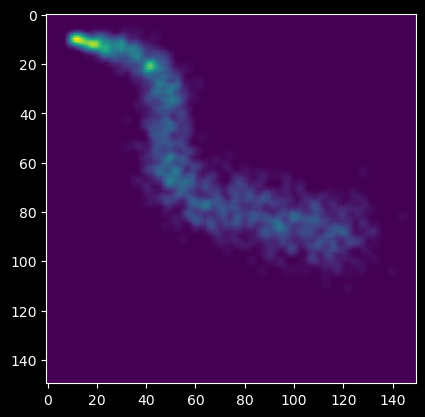

In [160]:
plt.imshow(A)

In [161]:
weights_test

array([0.5       , 0.50005659, 0.5001132 , ..., 0.98423577, 0.98924215,
       0.99449058])

In [162]:
np.shape(weights_test)

(1900,)

In [163]:
kde_pilot = histogram_estimator(trajectories, grid_size,weights=weights_test)[1]

In [164]:
help(grid_proj_kde)

Help on function grid_proj_kde in module __main__:

grid_proj_kde(grid_size, kde_pilot, gaussian_kernels, kernel_bandwidths, particle_bandwidths)
    Projects a kernel density estimate (KDE) onto a grid using Gaussian kernels.

    Parameters:
    grid_size (int): The size of the grid (grid_size x grid_size).
    kde_pilot (np.array): The pilot KDE values on the grid.
    gaussian_kernels (list): List of Gaussian kernel matrices.
    kernel_bandwidths (np.array): Array of bandwidths associated with each Gaussian kernel.
    particle_bandwidths (np.array): Array of bandwidths of the particles.

    Returns:
    np.array: The resulting KDE projected onto the grid.



In [165]:
help(generate_gaussian_kernels)

Help on function generate_gaussian_kernels in module __main__:

generate_gaussian_kernels(x_grid, num_kernels, ratio, stretch=1)
    Generates Gaussian kernels and their bandwidths.

    Parameters:
    x_grid (np.array): The grid on which the kernels are defined.
    num_kernels (int): The number of kernels to generate.
    ratio (float): The ratio between the kernel bandwidth and integration support.
    stretch (float): The stretch factor of the kernels. Defined as the ratio between the bandwidth in the x and y directions.

    Returns:
    gaussian_kernels (list): List of Gaussian kernels.
    bandwidths_h (np.array): Array of bandwidths associated with each kernel.
    kernel_origin (list): List of kernel origins.



In [166]:

ratio = 1/3

gaussian_kernels_test = generate_gaussian_kernels(grid_size, num_kernels, ratio)

TypeError: 'int' object is not subscriptable

In [167]:
gaussian_kernels_test = generate_gaussian_kernels(x_grid, num_kernels, ratio)

In [168]:
x_grid

array([ 0.        ,  0.1010101 ,  0.2020202 ,  0.3030303 ,  0.4040404 ,
        0.50505051,  0.60606061,  0.70707071,  0.80808081,  0.90909091,
        1.01010101,  1.11111111,  1.21212121,  1.31313131,  1.41414141,
        1.51515152,  1.61616162,  1.71717172,  1.81818182,  1.91919192,
        2.02020202,  2.12121212,  2.22222222,  2.32323232,  2.42424242,
        2.52525253,  2.62626263,  2.72727273,  2.82828283,  2.92929293,
        3.03030303,  3.13131313,  3.23232323,  3.33333333,  3.43434343,
        3.53535354,  3.63636364,  3.73737374,  3.83838384,  3.93939394,
        4.04040404,  4.14141414,  4.24242424,  4.34343434,  4.44444444,
        4.54545455,  4.64646465,  4.74747475,  4.84848485,  4.94949495,
        5.05050505,  5.15151515,  5.25252525,  5.35353535,  5.45454545,
        5.55555556,  5.65656566,  5.75757576,  5.85858586,  5.95959596,
        6.06060606,  6.16161616,  6.26262626,  6.36363636,  6.46464646,
        6.56565657,  6.66666667,  6.76767677,  6.86868687,  6.96

In [169]:
gaussian_kernels_test

([array([[1]]),
  array([[0.05854983, 0.09653235, 0.05854983],
         [0.09653235, 0.15915494, 0.09653235],
         [0.05854983, 0.09653235, 0.05854983]]),
  array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
         [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
         [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
         [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
         [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
  array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
          0.00885874, 0.00559695],
         [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
          0.01402145, 0.00885874],
         [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
          0.0184691 , 0.01166876],
         [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
          0.02024556, 0.01279113],
         [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.0243

In [170]:
gaussian_kernels_test = generate_gaussian_kernels(x_grid, 20, ratio)

In [171]:
gaussian_kernels_test

([array([[1]]),
  array([[0.05854983, 0.09653235, 0.05854983],
         [0.09653235, 0.15915494, 0.09653235],
         [0.05854983, 0.09653235, 0.05854983]]),
  array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
         [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
         [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
         [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
         [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
  array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
          0.00885874, 0.00559695],
         [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
          0.01402145, 0.00885874],
         [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
          0.0184691 , 0.01166876],
         [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
          0.02024556, 0.01279113],
         [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.0243

In [172]:
gaussian_kernels_test[12]

IndexError: tuple index out of range

In [173]:
gaussian_kernels_test[11]

IndexError: tuple index out of range

In [174]:
gaussian_kernels_test[10]

IndexError: tuple index out of range

In [175]:
gaussian_kernels_test[0]

[array([[1]]),
 array([[0.05854983, 0.09653235, 0.05854983],
        [0.09653235, 0.15915494, 0.09653235],
        [0.05854983, 0.09653235, 0.05854983]]),
 array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
 array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
         0.00885874, 0.00559695],
        [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
         0.01402145, 0.00885874],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0184691 , 0.01166876],
        [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
         0.02024556, 0.01279113],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0

In [176]:
gaussian_kernels_test[0][0]

array([[1]])

In [177]:
gaussian_kernels_test[0][1]

array([[0.05854983, 0.09653235, 0.05854983],
       [0.09653235, 0.15915494, 0.09653235],
       [0.05854983, 0.09653235, 0.05854983]])

In [178]:
gaussian_kernels_test[0][2]

array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
       [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
       [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
       [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
       [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]])

In [179]:
gaussian_kernels_test[1][2]

1.6666666666666665

In [180]:
gaussian_kernels_test[2][2]

array([0, 0])

In [181]:
gaussian_kernels_test[3][2]

IndexError: tuple index out of range

In [182]:
gaussian_kernels_test[0]

[array([[1]]),
 array([[0.05854983, 0.09653235, 0.05854983],
        [0.09653235, 0.15915494, 0.09653235],
        [0.05854983, 0.09653235, 0.05854983]]),
 array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
 array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
         0.00885874, 0.00559695],
        [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
         0.01402145, 0.00885874],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0184691 , 0.01166876],
        [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
         0.02024556, 0.01279113],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0

In [183]:
np.shape(gaussian_kernels_test[0])

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (20,) + inhomogeneous part.

In [184]:
gaussian_kernels_test = gaussian_kernels_test[0]

In [185]:
gaussian_kernels_test[0]

array([[1]])

In [186]:
gaussian_kernels_test[1]

array([[0.05854983, 0.09653235, 0.05854983],
       [0.09653235, 0.15915494, 0.09653235],
       [0.05854983, 0.09653235, 0.05854983]])

In [187]:
gaussian_kernels_test[2]

array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
       [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
       [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
       [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
       [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]])

In [188]:
gaussian_kernels_test[20]

IndexError: list index out of range

In [189]:
gaussian_kernels_test[19]

array([[0.00011123, 0.0001241 , 0.00013764, ..., 0.00013764, 0.0001241 ,
        0.00011123],
       [0.0001241 , 0.00013846, 0.00015357, ..., 0.00015357, 0.00013846,
        0.0001241 ],
       [0.00013764, 0.00015357, 0.00017032, ..., 0.00017032, 0.00015357,
        0.00013764],
       ...,
       [0.00013764, 0.00015357, 0.00017032, ..., 0.00017032, 0.00015357,
        0.00013764],
       [0.0001241 , 0.00013846, 0.00015357, ..., 0.00015357, 0.00013846,
        0.0001241 ],
       [0.00011123, 0.0001241 , 0.00013764, ..., 0.00013764, 0.0001241 ,
        0.00011123]])

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (20,) + inhomogeneous part.

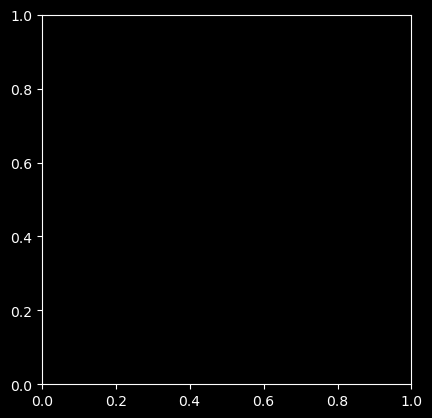

In [190]:
plt.imshow(gaussian_kernels_test)

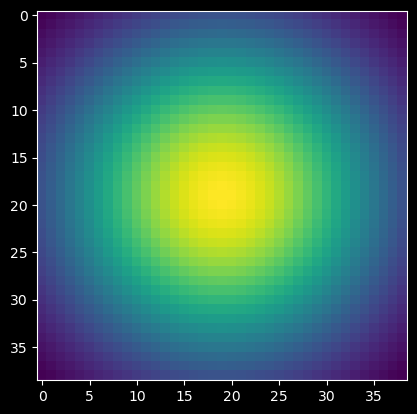

In [191]:
plt.imshow(gaussian_kernels_test[19])

In [192]:
x_grid = np.linspace(0, 10, 100)
num_kernels = 20
ratio = 1/3
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)[0]


ValueError: too many values to unpack (expected 3)

In [193]:
x_grid = np.linspace(0, 10, 100)
num_kernels = 20
ratio = 1/3
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)[0]


ValueError: too many values to unpack (expected 3)

In [194]:
x_grid = np.linspace(0, 10, 100)
num_kernels = 20
ratio = 1/3
gaussian_kernels, bandwidths_h = generate_gaussian_kernels(x_grid, num_kernels, ratio)[0]


ValueError: too many values to unpack (expected 2)

In [195]:
generate_gaussian_kernels(x_grid, num_kernels, ratio)

([array([[1]]),
  array([[0.05854983, 0.09653235, 0.05854983],
         [0.09653235, 0.15915494, 0.09653235],
         [0.05854983, 0.09653235, 0.05854983]]),
  array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
         [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
         [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
         [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
         [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
  array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
          0.00885874, 0.00559695],
         [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
          0.01402145, 0.00885874],
         [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
          0.0184691 , 0.01166876],
         [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
          0.02024556, 0.01279113],
         [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.0243

In [196]:
gaussian_kernels, bandwidths_h, kernel_origin = generate_gaussian_kernels(x_grid, num_kernels, ratio)

In [197]:
gaussian_kernels

[array([[1]]),
 array([[0.05854983, 0.09653235, 0.05854983],
        [0.09653235, 0.15915494, 0.09653235],
        [0.05854983, 0.09653235, 0.05854983]]),
 array([[0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.02788885, 0.04785746, 0.05729578, 0.04785746, 0.02788885],
        [0.02329473, 0.03997391, 0.04785746, 0.03997391, 0.02329473],
        [0.01357496, 0.02329473, 0.02788885, 0.02329473, 0.01357496]]),
 array([[0.00559695, 0.00885874, 0.01166876, 0.01279113, 0.01166876,
         0.00885874, 0.00559695],
        [0.00885874, 0.01402145, 0.0184691 , 0.02024556, 0.0184691 ,
         0.01402145, 0.00885874],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0184691 , 0.01166876],
        [0.01279113, 0.02024556, 0.0266675 , 0.02923254, 0.0266675 ,
         0.02024556, 0.01279113],
        [0.01166876, 0.0184691 , 0.02432754, 0.0266675 , 0.02432754,
         0.0

In [198]:
x_grid = np.linspace(0, 10, grid_size)